In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
! # Make sure to enable the ipycanvas/ other widgets
!jupyter labextension enable widgetsnbextension

In [3]:
import pandas as pd
import numpy as np
import anndata as ad
import scanpy as sc
import squidpy as sq
import h5py
import matplotlib.pyplot as plt
import scipy
from scipy.sparse import csr_matrix
import scipy.sparse as sp
import torch
import os

In [ ]:
import pyliger
import scvi
from STAligner.STAligner import *
from scib_metrics.benchmark import Benchmarker, BioConservation, BatchCorrection

In [4]:
directory = "popari/simulated_batch_data/output/"

all_files = []
for root, dirs, files in os.walk(directory):
    for file in files:
        file_path = os.path.join(root, file)
        all_files.append(file_path)

print(all_files)

['popari/simulated_batch_data/output/batch_effect_1pt5_with_75_percent/processed_dataset_28.h5ad', 'popari/simulated_batch_data/output/batch_effect_1pt5_with_75_percent/processed_dataset_7.h5ad', 'popari/simulated_batch_data/output/batch_effect_1pt5_with_75_percent/processed_dataset_42.h5ad', 'popari/simulated_batch_data/output/batch_effect_1pt5_with_75_percent/processed_dataset_10.h5ad', 'popari/simulated_batch_data/output/batch_effect_1pt5_with_75_percent/processed_dataset_13.h5ad', 'popari/simulated_batch_data/output/batch_effect_3_with_75_percent/processed_dataset_42.h5ad', 'popari/simulated_batch_data/output/batch_effect_3_with_75_percent/processed_dataset_28.h5ad', 'popari/simulated_batch_data/output/batch_effect_3_with_75_percent/processed_dataset_7.h5ad', 'popari/simulated_batch_data/output/batch_effect_3_with_75_percent/processed_dataset_10.h5ad', 'popari/simulated_batch_data/output/batch_effect_3_with_75_percent/processed_dataset_13.h5ad', 'popari/simulated_batch_data/output/

In [5]:
exception_files = []
for file in all_files:
    
    print(f"Processing file {file}")
    adata = ad.read_h5ad(file)


    print("Running STAligner...")
    try:
        batches = adata.obs['batch'].unique()
        batches_list = batches.tolist()
        
        Batch_list = []
        adj_list = []
        for batch in batches:
            batch_data = adata[adata.obs['batch'] == batch].copy()
            batch_data.X = csr_matrix(batch_data.X)
            Cal_Spatial_Net(batch_data, rad_cutoff=1.3)
           
            sc.pp.normalize_total(batch_data, target_sum=1e4)
            sc.pp.log1p(batch_data)
            sc.pp.highly_variable_genes(batch_data, flavor="seurat_v3", n_top_genes=5000)
            batch_data = batch_data[:, batch_data.var['highly_variable']]
        
            adj_list.append(batch_data.uns['adj'])
            Batch_list.append(batch_data)
    
        adata_concat = ad.concat(Batch_list, label="slice_name", keys=batches)
        adata_concat.obs["batch_name"] = adata_concat.obs["slice_name"].astype('category')
        adata.obs["batch_name"] = adata_concat.obs["slice_name"].astype('category')
    
        adj_concat = np.asarray(adj_list[0].todense())
        for batch_id in range(1,len(batches_list)):
            adj_concat = scipy.linalg.block_diag(adj_concat, np.asarray(adj_list[batch_id].todense()))
        adata_concat.uns['edgeList'] = np.nonzero(adj_concat)
    
        adata_concat.obs_names_make_unique()
        reference_batch = 1
        iter_comb = []
        for i in range(len(batches_list)):
            if i != reference_batch:
                iter_comb.append((i, reference_batch))
        
        adata_concat = train_STAligner(adata_concat, verbose=True, knn_neigh=100, iter_comb=iter_comb, margin=2.5)
        adata_staligner = adata_concat.copy()
        sc.pp.neighbors(adata_staligner, use_rep='STAligner')
        sc.tl.umap(adata_staligner)
    
        adata.obsm['X_umap_STAligner'] = adata_staligner.obsm['X_umap']
        adata.obsm['X_STAligner'] = adata_staligner.obsm['STAligner']
    except Exception as e:
        exception_files += [(file, str(e), "STAligner")]


        
    
    print("Running scVI...")
    try:     
        scvi.model.SCVI.setup_anndata(adata, batch_key='batch')
        model = scvi.model.SCVI(adata)
        model.train()
        adata.obsm['X_scVI'] = model.get_latent_representation()
    
        adata_scvi = adata.copy()
        sc.pp.neighbors(adata_scvi, use_rep='X_scVI')
        sc.tl.umap(adata_scvi)   
        adata.obsm['X_umap_scVI'] = adata_scvi.obsm['X_umap']
    except Exception as e:
        exception_files += [(file, str(e), "scVI")]



    print("Running PyLiger...")
    try:
        batch_datas = []
        for i, batch in enumerate(batches):
            original_batch = adata[adata.obs['batch'] == batch]
            X_matrix = original_batch.obsm['ground_truth_X'].copy()
            cell_types = original_batch.obs['cell_type'].copy()
            
            new_var_index = [f"feature_{j}" for j in range(X_matrix.shape[1])]
            var_df = pd.DataFrame(index=new_var_index)
            batch_data = ad.AnnData(
                X=X_matrix,
                obs=original_batch.obs.copy(),
                var=var_df
            )
            
            batch_data.obs.index.name = "cell_" + str(i)
            batch_data.var.index.name = "metagene_" + str(i)
            batch_data.uns["sample_name"] = f"dataset_{i}"
            batch_data.obs['cell_type'] = cell_types
            batch_datas += [batch_data]
        
        liger_data = pyliger.create_liger(batch_datas)
        pyliger.normalize(liger_data)
        pyliger.select_genes(liger_data)
        pyliger.scale_not_center(liger_data)
        pyliger.optimize_ALS(liger_data, k=5)
        pyliger.quantile_norm(liger_data)
        pyliger.leiden_cluster(liger_data, resolution=0.25)
        pyliger.run_umap(liger_data, distance='cosine', n_neighbors=10, min_dist=0.3)
        
        adata_liger = adata.copy()
        adata_liger.obsm['X_pyliger'] = liger_data.tsne_coords.to_numpy()
        sc.pp.neighbors(adata_liger, use_rep='X_pyliger')
        sc.tl.umap(adata_liger)
        adata.obsm['X_umap_pyliger'] = adata_liger.obsm['X_umap']
        adata.obsm['X_pyliger'] = adata_liger.obsm['X_pyliger']
    except Exception as e:
        exception_files += [(file, str(e), "PyLiger")]


     
    adata.write(file)
    

Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_75_percent/processed_dataset_28.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 295.04it/s]


Train with STAligner...


  0%|          | 1/500 [00:00<01:34,  5.30it/s]

Update spot triplets at epoch 500


 26%|██▌       | 131/500 [00:00<00:01, 199.31it/s]

Update spot triplets at epoch 600


 42%|████▏     | 210/500 [00:01<00:01, 191.19it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 312/500 [00:01<00:00, 193.51it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 417/500 [00:02<00:00, 195.67it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 204.28it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Running scVI...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.99it/s, v_num=1, train_loss_step=56.7, train_loss_epoch=56]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.49it/s, v_num=1, train_loss_step=56.7, train_loss_epoch=56]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 274.61it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_75_percent/processed_dataset_7.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 324.19it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 87.92it/s]

Update spot triplets at epoch 500


 23%|██▎       | 113/500 [00:00<00:02, 184.64it/s]

Update spot triplets at epoch 600


 44%|████▎     | 218/500 [00:01<00:01, 194.78it/s]

Update spot triplets at epoch 700


 64%|██████▍   | 322/500 [00:01<00:00, 191.31it/s]

Update spot triplets at epoch 800


 86%|████████▌ | 428/500 [00:02<00:00, 206.89it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 213.92it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.18it/s, v_num=1, train_loss_step=56.5, train_loss_epoch=54.5]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.96it/s, v_num=1, train_loss_step=56.5, train_loss_epoch=54.5]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 292.14it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_75_percent/processed_dataset_42.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 321.59it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:04, 99.65it/s]

Update spot triplets at epoch 500


 23%|██▎       | 114/500 [00:00<00:01, 200.63it/s]

Update spot triplets at epoch 600


 43%|████▎     | 215/500 [00:01<00:01, 203.92it/s]

Update spot triplets at epoch 700


 64%|██████▍   | 319/500 [00:01<00:00, 209.06it/s]

Update spot triplets at epoch 800


 84%|████████▍ | 422/500 [00:01<00:00, 207.44it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 222.85it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.84it/s, v_num=1, train_loss_step=48.7, train_loss_epoch=49.1]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.99it/s, v_num=1, train_loss_step=48.7, train_loss_epoch=49.1]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 287.29it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_75_percent/processed_dataset_10.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 321.98it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 88.86it/s]

Update spot triplets at epoch 500


 27%|██▋       | 133/500 [00:00<00:01, 209.29it/s]

Update spot triplets at epoch 600


 42%|████▏     | 209/500 [00:01<00:01, 197.28it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 309/500 [00:01<00:00, 195.52it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 412/500 [00:01<00:00, 197.69it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 214.71it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.29it/s, v_num=1, train_loss_step=52, train_loss_epoch=51.3]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.88it/s, v_num=1, train_loss_step=52, train_loss_epoch=51.3]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 347.43it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_75_percent/processed_dataset_13.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 320.00it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:04, 98.37it/s]

Update spot triplets at epoch 500


 22%|██▏       | 112/500 [00:00<00:02, 188.83it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 190.80it/s]

Update spot triplets at epoch 700


 58%|█████▊    | 290/500 [00:01<00:00, 230.96it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 416/500 [00:02<00:00, 147.66it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 172.79it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.75it/s, v_num=1, train_loss_step=57, train_loss_epoch=55.6]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.75it/s, v_num=1, train_loss_step=57, train_loss_epoch=55.6]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 285.92it/s]


Processing file popari/simulated_batch_data/output/batch_effect_3_with_75_percent/processed_dataset_42.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 320.37it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:05, 97.01it/s]

Update spot triplets at epoch 500


 22%|██▏       | 109/500 [00:00<00:02, 187.48it/s]

Update spot triplets at epoch 600


 42%|████▏     | 211/500 [00:01<00:01, 195.06it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 311/500 [00:01<00:00, 192.18it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 413/500 [00:02<00:00, 191.34it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 211.15it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.55it/s, v_num=1, train_loss_step=90.4, train_loss_epoch=90.7]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.82it/s, v_num=1, train_loss_step=90.4, train_loss_epoch=90.7]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 347.34it/s]


Processing file popari/simulated_batch_data/output/batch_effect_3_with_75_percent/processed_dataset_28.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 320.34it/s]


Train with STAligner...


  2%|▏         | 11/500 [00:00<00:04, 106.27it/s]

Update spot triplets at epoch 500


 22%|██▏       | 110/500 [00:00<00:02, 192.37it/s]

Update spot triplets at epoch 600


 43%|████▎     | 215/500 [00:01<00:01, 204.60it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 315/500 [00:01<00:00, 203.52it/s]

Update spot triplets at epoch 800


 84%|████████▎ | 418/500 [00:01<00:00, 205.79it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 218.34it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.73it/s, v_num=1, train_loss_step=92.1, train_loss_epoch=94.5]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.45it/s, v_num=1, train_loss_step=92.1, train_loss_epoch=94.5]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 324.80it/s]


Processing file popari/simulated_batch_data/output/batch_effect_3_with_75_percent/processed_dataset_7.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 319.30it/s]


Train with STAligner...


  2%|▏         | 11/500 [00:00<00:04, 106.92it/s]

Update spot triplets at epoch 500


 23%|██▎       | 113/500 [00:00<00:01, 198.35it/s]

Update spot triplets at epoch 600


 43%|████▎     | 213/500 [00:01<00:01, 202.69it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 316/500 [00:01<00:00, 205.97it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 416/500 [00:01<00:00, 202.37it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 220.38it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.34it/s, v_num=1, train_loss_step=88.6, train_loss_epoch=89.4]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.45it/s, v_num=1, train_loss_step=88.6, train_loss_epoch=89.4]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 315.56it/s]


Processing file popari/simulated_batch_data/output/batch_effect_3_with_75_percent/processed_dataset_10.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.77it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:04, 99.79it/s]

Update spot triplets at epoch 500


 22%|██▏       | 109/500 [00:00<00:02, 191.26it/s]

Update spot triplets at epoch 600


 42%|████▏     | 211/500 [00:01<00:01, 202.63it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 314/500 [00:01<00:00, 203.60it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 417/500 [00:01<00:00, 205.48it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 219.83it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.44it/s, v_num=1, train_loss_step=98.8, train_loss_epoch=96.3]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.37it/s, v_num=1, train_loss_step=98.8, train_loss_epoch=96.3]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 370.56it/s]


Processing file popari/simulated_batch_data/output/batch_effect_3_with_75_percent/processed_dataset_13.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 319.64it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 88.66it/s]

Update spot triplets at epoch 500


 17%|█▋        | 87/500 [00:00<00:01, 233.73it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 147.95it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 314/500 [00:02<00:01, 178.11it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 416/500 [00:02<00:00, 189.65it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 174.92it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.50it/s, v_num=1, train_loss_step=98.4, train_loss_epoch=98.3]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.35it/s, v_num=1, train_loss_step=98.4, train_loss_epoch=98.3]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 359.05it/s]


Processing file popari/simulated_batch_data/output/batch_effect_5_with_100_percent/processed_dataset_10.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.70it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 86.82it/s]

Update spot triplets at epoch 500


 22%|██▏       | 111/500 [00:00<00:02, 191.23it/s]

Update spot triplets at epoch 600


 43%|████▎     | 213/500 [00:01<00:01, 192.93it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 315/500 [00:01<00:00, 197.88it/s]

Update spot triplets at epoch 800


 84%|████████▎ | 418/500 [00:01<00:00, 199.84it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 214.93it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.96it/s, v_num=1, train_loss_step=165, train_loss_epoch=164]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.35it/s, v_num=1, train_loss_step=165, train_loss_epoch=164]
Running PyLiger...
Processing file popari/simulated_batch_data/output/batch_effect_5_with_100_percent/processed_dataset_28.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.09it/s]


Train with STAligner...


  2%|▏         | 11/500 [00:00<00:04, 106.58it/s]

Update spot triplets at epoch 500


 22%|██▏       | 109/500 [00:00<00:02, 188.20it/s]

Update spot triplets at epoch 600


 42%|████▏     | 211/500 [00:01<00:01, 198.55it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 311/500 [00:01<00:00, 197.60it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 414/500 [00:01<00:00, 200.12it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 216.58it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.75it/s, v_num=1, train_loss_step=176, train_loss_epoch=176]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.32it/s, v_num=1, train_loss_step=176, train_loss_epoch=176]
Running PyLiger...
Processing file popari/simulated_batch_data/output/batch_effect_5_with_100_percent/processed_dataset_42.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.84it/s]


Train with STAligner...


  2%|▏         | 12/500 [00:00<00:04, 115.57it/s]

Update spot triplets at epoch 500


 23%|██▎       | 114/500 [00:00<00:01, 194.00it/s]

Update spot triplets at epoch 600


 43%|████▎     | 214/500 [00:01<00:01, 196.02it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 317/500 [00:01<00:00, 198.13it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 417/500 [00:01<00:00, 194.12it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 215.75it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.35it/s, v_num=1, train_loss_step=158, train_loss_epoch=159]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.52it/s, v_num=1, train_loss_step=158, train_loss_epoch=159]
Running PyLiger...
Processing file popari/simulated_batch_data/output/batch_effect_5_with_100_percent/processed_dataset_7.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 319.77it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 89.36it/s]

Update spot triplets at epoch 500


 22%|██▏       | 111/500 [00:00<00:02, 192.73it/s]

Update spot triplets at epoch 600


 43%|████▎     | 213/500 [00:01<00:01, 196.60it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 313/500 [00:01<00:00, 195.45it/s]

Update spot triplets at epoch 800


 78%|███████▊  | 391/500 [00:01<00:00, 231.55it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 175.86it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.52it/s, v_num=1, train_loss_step=163, train_loss_epoch=163]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.36it/s, v_num=1, train_loss_step=163, train_loss_epoch=163]
Running PyLiger...
Processing file popari/simulated_batch_data/output/batch_effect_5_with_100_percent/processed_dataset_13.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.45it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:05, 97.95it/s]

Update spot triplets at epoch 500


 22%|██▏       | 112/500 [00:00<00:02, 188.19it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 188.93it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 314/500 [00:01<00:00, 190.96it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 414/500 [00:02<00:00, 187.96it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 210.98it/s]


Running scVI...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.23it/s, v_num=1, train_loss_step=168, train_loss_epoch=169]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.41it/s, v_num=1, train_loss_step=168, train_loss_epoch=169]
Running PyLiger...
Processing file popari/simulated_batch_data/output/batch_effect_2_with_75_percent/processed_dataset_13.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 316.99it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 89.25it/s]

Update spot triplets at epoch 500


 22%|██▏       | 108/500 [00:00<00:02, 182.31it/s]

Update spot triplets at epoch 600


 42%|████▏     | 210/500 [00:01<00:01, 189.00it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 310/500 [00:01<00:01, 188.15it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 412/500 [00:02<00:00, 190.46it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 210.16it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.68it/s, v_num=1, train_loss_step=63.5, train_loss_epoch=62.1]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.35it/s, v_num=1, train_loss_step=63.5, train_loss_epoch=62.1]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 286.84it/s]


Processing file popari/simulated_batch_data/output/batch_effect_2_with_75_percent/processed_dataset_7.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.82it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:05, 97.87it/s]

Update spot triplets at epoch 500


 22%|██▏       | 112/500 [00:00<00:02, 190.05it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 189.34it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 314/500 [00:01<00:00, 192.55it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 414/500 [00:02<00:00, 188.29it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 212.06it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.24it/s, v_num=1, train_loss_step=67.2, train_loss_epoch=68.4]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.28it/s, v_num=1, train_loss_step=67.2, train_loss_epoch=68.4]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 329.17it/s]


Processing file popari/simulated_batch_data/output/batch_effect_2_with_75_percent/processed_dataset_28.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.93it/s]


Train with STAligner...


  0%|          | 0/500 [00:00<?, ?it/s]

Update spot triplets at epoch 500


 26%|██▌       | 128/500 [00:01<00:02, 164.63it/s]

Update spot triplets at epoch 600


 46%|████▌     | 228/500 [00:01<00:01, 195.57it/s]

Update spot triplets at epoch 700


 61%|██████    | 304/500 [00:02<00:01, 187.32it/s]

Update spot triplets at epoch 800


 81%|████████  | 405/500 [00:02<00:00, 186.55it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 172.89it/s]


Running scVI...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.60it/s, v_num=1, train_loss_step=63.3, train_loss_epoch=63.9]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.21it/s, v_num=1, train_loss_step=63.3, train_loss_epoch=63.9]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 326.71it/s]


Processing file popari/simulated_batch_data/output/batch_effect_2_with_75_percent/processed_dataset_42.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.75it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 88.20it/s]

Update spot triplets at epoch 500


 22%|██▏       | 111/500 [00:00<00:02, 175.86it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 182.85it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 314/500 [00:01<00:00, 188.62it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 416/500 [00:02<00:00, 186.77it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 207.96it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.10it/s, v_num=1, train_loss_step=66.9, train_loss_epoch=66]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.46it/s, v_num=1, train_loss_step=66.9, train_loss_epoch=66]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 339.86it/s]


Processing file popari/simulated_batch_data/output/batch_effect_2_with_75_percent/processed_dataset_10.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.58it/s]


Train with STAligner...


  2%|▏         | 11/500 [00:00<00:04, 108.32it/s]

Update spot triplets at epoch 500


 23%|██▎       | 113/500 [00:00<00:01, 194.10it/s]

Update spot triplets at epoch 600


 43%|████▎     | 216/500 [00:01<00:01, 204.46it/s]

Update spot triplets at epoch 700


 64%|██████▍   | 319/500 [00:01<00:00, 205.40it/s]

Update spot triplets at epoch 800


 84%|████████▍ | 419/500 [00:01<00:00, 204.55it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 220.06it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.40it/s, v_num=1, train_loss_step=66.6, train_loss_epoch=67.2]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.42it/s, v_num=1, train_loss_step=66.6, train_loss_epoch=67.2]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 398.77it/s]


Processing file popari/simulated_batch_data/output/batch_effect_5_with_50_percent/processed_dataset_13.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 316.91it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:04, 98.62it/s]

Update spot triplets at epoch 500


 22%|██▏       | 110/500 [00:00<00:02, 188.95it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 195.31it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 312/500 [00:01<00:00, 194.56it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 413/500 [00:01<00:00, 195.39it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 213.90it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.59it/s, v_num=1, train_loss_step=130, train_loss_epoch=130]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.47it/s, v_num=1, train_loss_step=130, train_loss_epoch=130]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 412.85it/s]


Processing file popari/simulated_batch_data/output/batch_effect_5_with_50_percent/processed_dataset_42.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.18it/s]


Train with STAligner...


  0%|          | 0/500 [00:00<?, ?it/s]

Update spot triplets at epoch 500


 25%|██▌       | 127/500 [00:01<00:02, 166.98it/s]

Update spot triplets at epoch 600


 46%|████▌     | 229/500 [00:01<00:01, 202.03it/s]

Update spot triplets at epoch 700


 66%|██████▌   | 330/500 [00:02<00:00, 205.08it/s]

Update spot triplets at epoch 800


 81%|████████  | 406/500 [00:02<00:00, 190.54it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 175.05it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.29it/s, v_num=1, train_loss_step=109, train_loss_epoch=113]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.26it/s, v_num=1, train_loss_step=109, train_loss_epoch=113]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 302.90it/s]


Processing file popari/simulated_batch_data/output/batch_effect_5_with_50_percent/processed_dataset_7.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.52it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:04, 99.34it/s]

Update spot triplets at epoch 500


 22%|██▏       | 112/500 [00:00<00:02, 186.63it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 188.22it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 314/500 [00:01<00:00, 190.61it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 414/500 [00:02<00:00, 189.05it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 211.26it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.20it/s, v_num=1, train_loss_step=115, train_loss_epoch=115]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.26it/s, v_num=1, train_loss_step=115, train_loss_epoch=115]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 329.79it/s]


Processing file popari/simulated_batch_data/output/batch_effect_5_with_50_percent/processed_dataset_28.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.55it/s]


Train with STAligner...


  2%|▏         | 8/500 [00:00<00:06, 78.03it/s]

Update spot triplets at epoch 500


 22%|██▏       | 110/500 [00:00<00:02, 191.93it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 197.05it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 312/500 [00:01<00:00, 196.24it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 414/500 [00:01<00:00, 196.98it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 214.17it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.76it/s, v_num=1, train_loss_step=137, train_loss_epoch=137]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.38it/s, v_num=1, train_loss_step=137, train_loss_epoch=137]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 340.57it/s]


Processing file popari/simulated_batch_data/output/batch_effect_5_with_50_percent/processed_dataset_10.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.63it/s]


Train with STAligner...


  2%|▏         | 11/500 [00:00<00:04, 109.74it/s]

Update spot triplets at epoch 500


 23%|██▎       | 113/500 [00:00<00:01, 195.94it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 197.28it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 314/500 [00:01<00:00, 198.49it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 414/500 [00:01<00:00, 195.64it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 215.02it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.42it/s, v_num=1, train_loss_step=124, train_loss_epoch=124]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.41it/s, v_num=1, train_loss_step=124, train_loss_epoch=124]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 328.10it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1_with_75_percent/processed_dataset_42.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 316.35it/s]


Train with STAligner...


  0%|          | 0/500 [00:00<?, ?it/s]

Update spot triplets at epoch 500


 25%|██▌       | 127/500 [00:01<00:02, 162.61it/s]

Update spot triplets at epoch 600


 45%|████▌     | 227/500 [00:01<00:01, 193.63it/s]

Update spot triplets at epoch 700


 61%|██████    | 303/500 [00:02<00:01, 185.65it/s]

Update spot triplets at epoch 800


 81%|████████  | 403/500 [00:02<00:00, 186.21it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 172.21it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.36it/s, v_num=1, train_loss_step=45.7, train_loss_epoch=46]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.26it/s, v_num=1, train_loss_step=45.7, train_loss_epoch=46]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 289.24it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1_with_75_percent/processed_dataset_28.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.70it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 88.70it/s]

Update spot triplets at epoch 500


 22%|██▏       | 108/500 [00:00<00:02, 178.65it/s]

Update spot triplets at epoch 600


 42%|████▏     | 210/500 [00:01<00:01, 186.83it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 310/500 [00:01<00:01, 186.90it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 412/500 [00:02<00:00, 189.58it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 208.62it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.75it/s, v_num=1, train_loss_step=41.6, train_loss_epoch=42]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.39it/s, v_num=1, train_loss_step=41.6, train_loss_epoch=42]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 315.59it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1_with_75_percent/processed_dataset_10.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 319.10it/s]


Train with STAligner...


  2%|▏         | 8/500 [00:00<00:06, 78.00it/s]

Update spot triplets at epoch 500


 22%|██▏       | 110/500 [00:00<00:02, 185.98it/s]

Update spot triplets at epoch 600


 42%|████▏     | 210/500 [00:01<00:01, 188.00it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 312/500 [00:01<00:00, 191.71it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 412/500 [00:02<00:00, 189.67it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 210.62it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.48it/s, v_num=1, train_loss_step=41.6, train_loss_epoch=41.1]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.52it/s, v_num=1, train_loss_step=41.6, train_loss_epoch=41.1]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 285.70it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1_with_75_percent/processed_dataset_7.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.25it/s]


Train with STAligner...


  1%|          | 6/500 [00:00<00:08, 58.44it/s]

Update spot triplets at epoch 500


 21%|██▏       | 107/500 [00:00<00:02, 176.55it/s]

Update spot triplets at epoch 600


 42%|████▏     | 209/500 [00:01<00:01, 187.30it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 311/500 [00:01<00:01, 186.30it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 413/500 [00:02<00:00, 189.58it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 208.97it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.48it/s, v_num=1, train_loss_step=45.8, train_loss_epoch=44.8]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.06it/s, v_num=1, train_loss_step=45.8, train_loss_epoch=44.8]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 282.27it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1_with_75_percent/processed_dataset_13.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.70it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 87.11it/s]

Update spot triplets at epoch 500


 22%|██▏       | 111/500 [00:00<00:02, 183.62it/s]

Update spot triplets at epoch 600


 42%|████▏     | 211/500 [00:01<00:01, 185.89it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 313/500 [00:01<00:00, 190.86it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 413/500 [00:02<00:00, 188.66it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 209.78it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.26it/s, v_num=1, train_loss_step=44, train_loss_epoch=42.3]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.33it/s, v_num=1, train_loss_step=44, train_loss_epoch=42.3]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 290.59it/s]


Processing file popari/simulated_batch_data/output/batch_effect_2_with_100_percent/processed_dataset_7.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.18it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:05, 96.38it/s]

Update spot triplets at epoch 500


 22%|██▏       | 110/500 [00:00<00:02, 186.92it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 193.52it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 313/500 [00:01<00:00, 192.54it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 415/500 [00:02<00:00, 194.82it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 211.34it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.27it/s, v_num=1, train_loss_step=76.2, train_loss_epoch=75.8]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.34it/s, v_num=1, train_loss_step=76.2, train_loss_epoch=75.8]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 346.22it/s]


Processing file popari/simulated_batch_data/output/batch_effect_2_with_100_percent/processed_dataset_10.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 316.86it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:04, 99.96it/s]

Update spot triplets at epoch 500


 18%|█▊        | 88/500 [00:00<00:01, 234.45it/s]

Update spot triplets at epoch 600


 43%|████▎     | 213/500 [00:01<00:01, 146.13it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 313/500 [00:02<00:01, 177.65it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 415/500 [00:02<00:00, 189.04it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 173.28it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.48it/s, v_num=1, train_loss_step=77.5, train_loss_epoch=77.4]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.22it/s, v_num=1, train_loss_step=77.5, train_loss_epoch=77.4]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 384.68it/s]


Processing file popari/simulated_batch_data/output/batch_effect_2_with_100_percent/processed_dataset_42.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.52it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:05, 97.12it/s]

Update spot triplets at epoch 500


 22%|██▏       | 112/500 [00:00<00:02, 190.96it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 189.77it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 314/500 [00:01<00:00, 194.55it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 414/500 [00:02<00:00, 191.99it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 212.71it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.46it/s, v_num=1, train_loss_step=75.1, train_loss_epoch=75.3]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.38it/s, v_num=1, train_loss_step=75.1, train_loss_epoch=75.3]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 326.22it/s]


Processing file popari/simulated_batch_data/output/batch_effect_2_with_100_percent/processed_dataset_28.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.14it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:05, 96.76it/s]

Update spot triplets at epoch 500


 22%|██▏       | 109/500 [00:00<00:02, 184.74it/s]

Update spot triplets at epoch 600


 42%|████▏     | 211/500 [00:01<00:01, 192.36it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 311/500 [00:01<00:00, 190.93it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 413/500 [00:02<00:00, 194.65it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 212.13it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.62it/s, v_num=1, train_loss_step=83.4, train_loss_epoch=83.4]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.38it/s, v_num=1, train_loss_step=83.4, train_loss_epoch=83.4]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 283.85it/s]


Processing file popari/simulated_batch_data/output/batch_effect_2_with_100_percent/processed_dataset_13.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 319.04it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:05, 97.11it/s]

Update spot triplets at epoch 500


 22%|██▏       | 112/500 [00:00<00:02, 192.56it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 195.27it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 315/500 [00:01<00:00, 196.30it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 415/500 [00:01<00:00, 193.52it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 214.96it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.49it/s, v_num=1, train_loss_step=78.2, train_loss_epoch=76.3]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.25it/s, v_num=1, train_loss_step=78.2, train_loss_epoch=76.3]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 328.09it/s]


Processing file popari/simulated_batch_data/output/batch_effect_3_with_100_percent/processed_dataset_13.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.23it/s]


Train with STAligner...


  0%|          | 0/500 [00:00<?, ?it/s]

Update spot triplets at epoch 500


 26%|██▌       | 128/500 [00:01<00:02, 163.07it/s]

Update spot triplets at epoch 600


 45%|████▌     | 227/500 [00:01<00:01, 193.71it/s]

Update spot triplets at epoch 700


 66%|██████▌   | 329/500 [00:02<00:00, 203.74it/s]

Update spot triplets at epoch 800


 81%|████████  | 403/500 [00:02<00:00, 186.11it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 172.55it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.25it/s, v_num=1, train_loss_step=110, train_loss_epoch=108]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.22it/s, v_num=1, train_loss_step=110, train_loss_epoch=108]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 416.90it/s]


Processing file popari/simulated_batch_data/output/batch_effect_3_with_100_percent/processed_dataset_28.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 315.94it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 89.39it/s]

Update spot triplets at epoch 500


 22%|██▏       | 111/500 [00:00<00:02, 188.62it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 189.62it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 314/500 [00:01<00:00, 192.26it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 416/500 [00:02<00:00, 188.51it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 211.81it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.03it/s, v_num=1, train_loss_step=104, train_loss_epoch=103]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.37it/s, v_num=1, train_loss_step=104, train_loss_epoch=103]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 370.15it/s]


Processing file popari/simulated_batch_data/output/batch_effect_3_with_100_percent/processed_dataset_42.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.34it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:04, 98.83it/s]

Update spot triplets at epoch 500


 22%|██▏       | 108/500 [00:00<00:02, 189.71it/s]

Update spot triplets at epoch 600


 42%|████▏     | 210/500 [00:01<00:01, 197.83it/s]

Update spot triplets at epoch 700


 66%|██████▋   | 332/500 [00:01<00:00, 209.08it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 408/500 [00:01<00:00, 196.48it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 213.13it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.59it/s, v_num=1, train_loss_step=123, train_loss_epoch=122]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.34it/s, v_num=1, train_loss_step=123, train_loss_epoch=122]
Running PyLiger...
Processing file popari/simulated_batch_data/output/batch_effect_3_with_100_percent/processed_dataset_10.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 316.62it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:04, 99.83it/s]

Update spot triplets at epoch 500


 22%|██▏       | 112/500 [00:00<00:02, 190.60it/s]

Update spot triplets at epoch 600


 43%|████▎     | 214/500 [00:01<00:01, 200.69it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 314/500 [00:01<00:00, 202.20it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 411/500 [00:01<00:00, 198.18it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 216.71it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.32it/s, v_num=1, train_loss_step=103, train_loss_epoch=103]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.29it/s, v_num=1, train_loss_step=103, train_loss_epoch=103]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 356.50it/s]


Processing file popari/simulated_batch_data/output/batch_effect_3_with_100_percent/processed_dataset_7.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 316.90it/s]


Train with STAligner...


  1%|▏         | 7/500 [00:00<00:07, 69.85it/s]

Update spot triplets at epoch 500


 26%|██▌       | 131/500 [00:00<00:01, 204.55it/s]

Update spot triplets at epoch 600


 41%|████▏     | 207/500 [00:01<00:01, 191.68it/s]

Update spot triplets at epoch 700


 57%|█████▋    | 283/500 [00:01<00:00, 228.10it/s]

Update spot triplets at epoch 800


 81%|████████  | 406/500 [00:02<00:00, 145.99it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 171.81it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.45it/s, v_num=1, train_loss_step=107, train_loss_epoch=107]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.11it/s, v_num=1, train_loss_step=107, train_loss_epoch=107]
Running PyLiger...
Processing file popari/simulated_batch_data/output/batch_effect_0/processed_dataset_13.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.57it/s]


Train with STAligner...


  1%|▏         | 7/500 [00:00<00:07, 67.90it/s]

Update spot triplets at epoch 500


 21%|██        | 105/500 [00:00<00:02, 178.24it/s]

Update spot triplets at epoch 600


 41%|████      | 205/500 [00:01<00:01, 185.54it/s]

Update spot triplets at epoch 700


 61%|██████▏   | 307/500 [00:01<00:01, 189.74it/s]

Update spot triplets at epoch 800


 81%|████████▏ | 407/500 [00:02<00:00, 187.75it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 208.24it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.24it/s, v_num=1, train_loss_step=33.9, train_loss_epoch=32.1]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.28it/s, v_num=1, train_loss_step=33.9, train_loss_epoch=32.1]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 361.47it/s]


Processing file popari/simulated_batch_data/output/batch_effect_0/processed_dataset_10.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 314.85it/s]


Train with STAligner...


  2%|▏         | 8/500 [00:00<00:06, 77.39it/s]

Update spot triplets at epoch 500


 22%|██▏       | 110/500 [00:00<00:02, 183.72it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 186.50it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 314/500 [00:01<00:00, 191.23it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 417/500 [00:02<00:00, 191.21it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 210.91it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.20it/s, v_num=1, train_loss_step=33.3, train_loss_epoch=32.5]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.38it/s, v_num=1, train_loss_step=33.3, train_loss_epoch=32.5]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 354.07it/s]


Processing file popari/simulated_batch_data/output/batch_effect_0/processed_dataset_7.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.94it/s]


Train with STAligner...


  1%|          | 5/500 [00:00<00:10, 48.46it/s]

Update spot triplets at epoch 500


 21%|██        | 106/500 [00:00<00:02, 179.99it/s]

Update spot triplets at epoch 600


 42%|████▏     | 208/500 [00:01<00:01, 188.24it/s]

Update spot triplets at epoch 700


 57%|█████▋    | 284/500 [00:01<00:00, 227.32it/s]

Update spot triplets at epoch 800


 81%|████████▏ | 407/500 [00:02<00:00, 146.89it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 172.41it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.30it/s, v_num=1, train_loss_step=32.6, train_loss_epoch=32]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.32it/s, v_num=1, train_loss_step=32.6, train_loss_epoch=32]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 361.68it/s]


Processing file popari/simulated_batch_data/output/batch_effect_0/processed_dataset_42.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.01it/s]


Train with STAligner...


  1%|▏         | 7/500 [00:00<00:07, 68.95it/s]

Update spot triplets at epoch 500


 22%|██▏       | 108/500 [00:00<00:02, 183.44it/s]

Update spot triplets at epoch 600


 42%|████▏     | 208/500 [00:01<00:01, 188.76it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 310/500 [00:01<00:00, 191.45it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 410/500 [00:02<00:00, 189.09it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 209.89it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.48it/s, v_num=1, train_loss_step=32.3, train_loss_epoch=32.2]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.31it/s, v_num=1, train_loss_step=32.3, train_loss_epoch=32.2]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 343.77it/s]


Processing file popari/simulated_batch_data/output/batch_effect_0/processed_dataset_28.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.76it/s]


Train with STAligner...


  1%|          | 6/500 [00:00<00:08, 58.69it/s]

Update spot triplets at epoch 500


 21%|██▏       | 107/500 [00:00<00:02, 178.97it/s]

Update spot triplets at epoch 600


 41%|████▏     | 207/500 [00:01<00:01, 183.96it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 309/500 [00:01<00:01, 188.60it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 409/500 [00:02<00:00, 185.68it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 207.60it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.17it/s, v_num=1, train_loss_step=31.1, train_loss_epoch=31.7]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.30it/s, v_num=1, train_loss_step=31.1, train_loss_epoch=31.7]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 351.24it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1_with_100_percent/processed_dataset_13.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 316.39it/s]


Train with STAligner...


  1%|          | 6/500 [00:00<00:08, 59.80it/s]

Update spot triplets at epoch 500


 21%|██▏       | 107/500 [00:00<00:02, 176.92it/s]

Update spot triplets at epoch 600


 44%|████▍     | 220/500 [00:01<00:01, 178.08it/s]

Update spot triplets at epoch 700


 60%|█████▉    | 298/500 [00:01<00:00, 225.42it/s]

Update spot triplets at epoch 800


 85%|████████▍ | 423/500 [00:02<00:00, 147.29it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 167.27it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.33it/s, v_num=1, train_loss_step=47.4, train_loss_epoch=46.4]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.15it/s, v_num=1, train_loss_step=47.4, train_loss_epoch=46.4]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 290.84it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1_with_100_percent/processed_dataset_42.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.47it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:05, 97.37it/s]

Update spot triplets at epoch 500


 22%|██▏       | 112/500 [00:00<00:02, 181.75it/s]

Update spot triplets at epoch 600


 43%|████▎     | 213/500 [00:01<00:01, 188.62it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 315/500 [00:01<00:00, 190.84it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 415/500 [00:02<00:00, 189.69it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 210.77it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.41it/s, v_num=1, train_loss_step=45.8, train_loss_epoch=47]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.28it/s, v_num=1, train_loss_step=45.8, train_loss_epoch=47]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 303.85it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1_with_100_percent/processed_dataset_28.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.85it/s]


Train with STAligner...


  2%|▏         | 8/500 [00:00<00:06, 77.40it/s]

Update spot triplets at epoch 500


 22%|██▏       | 110/500 [00:00<00:02, 181.57it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 183.50it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 314/500 [00:01<00:00, 188.14it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 416/500 [00:02<00:00, 186.12it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 208.26it/s]


Running scVI...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.12it/s, v_num=1, train_loss_step=48.2, train_loss_epoch=48.6]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.25it/s, v_num=1, train_loss_step=48.2, train_loss_epoch=48.6]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 321.81it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1_with_100_percent/processed_dataset_7.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 316.87it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 89.46it/s]

Update spot triplets at epoch 500


 21%|██▏       | 107/500 [00:00<00:02, 183.91it/s]

Update spot triplets at epoch 600


 42%|████▏     | 209/500 [00:01<00:01, 192.92it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 309/500 [00:01<00:00, 191.08it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 411/500 [00:02<00:00, 194.99it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 211.83it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.51it/s, v_num=1, train_loss_step=45, train_loss_epoch=46.2]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.22it/s, v_num=1, train_loss_step=45, train_loss_epoch=46.2]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 326.71it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1_with_100_percent/processed_dataset_10.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 319.15it/s]


Train with STAligner...


  0%|          | 0/500 [00:00<?, ?it/s]

Update spot triplets at epoch 500


 25%|██▌       | 127/500 [00:01<00:02, 162.77it/s]

Update spot triplets at epoch 600


 46%|████▌     | 229/500 [00:01<00:01, 197.43it/s]

Update spot triplets at epoch 700


 66%|██████▌   | 329/500 [00:02<00:00, 204.95it/s]

Update spot triplets at epoch 800


 81%|████████  | 405/500 [00:02<00:00, 193.12it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 173.54it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.63it/s, v_num=1, train_loss_step=50.4, train_loss_epoch=50.8]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.14it/s, v_num=1, train_loss_step=50.4, train_loss_epoch=50.8]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 271.77it/s]


Processing file popari/simulated_batch_data/output/batch_effect_5_with_25_percent/processed_dataset_13.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.66it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 86.77it/s]

Update spot triplets at epoch 500


 22%|██▏       | 111/500 [00:00<00:02, 181.87it/s]

Update spot triplets at epoch 600


 42%|████▏     | 211/500 [00:01<00:01, 185.94it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 309/500 [00:01<00:01, 184.77it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 409/500 [00:02<00:00, 186.80it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 207.37it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.45it/s, v_num=1, train_loss_step=51.4, train_loss_epoch=56.4]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.10it/s, v_num=1, train_loss_step=51.4, train_loss_epoch=56.4]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 296.30it/s]


Processing file popari/simulated_batch_data/output/batch_effect_5_with_25_percent/processed_dataset_7.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.70it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:05, 96.32it/s]

Update spot triplets at epoch 500


 22%|██▏       | 112/500 [00:00<00:02, 192.78it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 197.09it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 314/500 [00:01<00:00, 199.54it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 414/500 [00:01<00:00, 194.33it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 215.42it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.22it/s, v_num=1, train_loss_step=107, train_loss_epoch=106]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.28it/s, v_num=1, train_loss_step=107, train_loss_epoch=106]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 316.60it/s]


Processing file popari/simulated_batch_data/output/batch_effect_5_with_25_percent/processed_dataset_10.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.50it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 87.31it/s]

Update spot triplets at epoch 500


 22%|██▏       | 111/500 [00:00<00:01, 196.20it/s]

Update spot triplets at epoch 600


 43%|████▎     | 213/500 [00:01<00:01, 202.97it/s]

Update spot triplets at epoch 700


 58%|█████▊    | 289/500 [00:01<00:00, 233.41it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 412/500 [00:02<00:00, 154.27it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 178.50it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.37it/s, v_num=1, train_loss_step=89.9, train_loss_epoch=88.6]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.22it/s, v_num=1, train_loss_step=89.9, train_loss_epoch=88.6]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 313.19it/s]


Processing file popari/simulated_batch_data/output/batch_effect_5_with_25_percent/processed_dataset_42.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.67it/s]


Train with STAligner...


  2%|▏         | 8/500 [00:00<00:06, 78.42it/s]

Update spot triplets at epoch 500


 22%|██▏       | 110/500 [00:00<00:02, 192.29it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 197.67it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 312/500 [00:01<00:00, 196.22it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 413/500 [00:01<00:00, 197.00it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 214.54it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.58it/s, v_num=1, train_loss_step=80.1, train_loss_epoch=80.5]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.27it/s, v_num=1, train_loss_step=80.1, train_loss_epoch=80.5]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 285.18it/s]


Processing file popari/simulated_batch_data/output/batch_effect_5_with_25_percent/processed_dataset_28.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.41it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 88.78it/s]

Update spot triplets at epoch 500


 22%|██▏       | 110/500 [00:00<00:02, 190.60it/s]

Update spot triplets at epoch 600


 42%|████▏     | 210/500 [00:01<00:01, 196.45it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 311/500 [00:01<00:00, 198.57it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 409/500 [00:01<00:00, 195.75it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 214.50it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.39it/s, v_num=1, train_loss_step=92.5, train_loss_epoch=91.3]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.20it/s, v_num=1, train_loss_step=92.5, train_loss_epoch=91.3]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 381.67it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_25_percent/processed_dataset_7.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 315.53it/s]


Train with STAligner...


  1%|▏         | 7/500 [00:00<00:07, 68.03it/s]

Update spot triplets at epoch 500


 22%|██▏       | 109/500 [00:00<00:02, 181.10it/s]

Update spot triplets at epoch 600


 42%|████▏     | 211/500 [00:01<00:01, 186.26it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 313/500 [00:01<00:00, 189.79it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 415/500 [00:02<00:00, 188.69it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 209.72it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.00it/s, v_num=1, train_loss_step=39, train_loss_epoch=38.5]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.28it/s, v_num=1, train_loss_step=39, train_loss_epoch=38.5]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 312.35it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_25_percent/processed_dataset_28.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.12it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:04, 99.25it/s]

Update spot triplets at epoch 500


 22%|██▏       | 110/500 [00:00<00:02, 186.16it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 192.35it/s]

Update spot triplets at epoch 700


 61%|██████▏   | 307/500 [00:01<00:01, 161.37it/s]

Update spot triplets at epoch 800


 76%|███████▋  | 382/500 [00:01<00:00, 207.23it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 168.47it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.45it/s, v_num=1, train_loss_step=40.7, train_loss_epoch=39.6]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.34it/s, v_num=1, train_loss_step=40.7, train_loss_epoch=39.6]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 283.13it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_25_percent/processed_dataset_42.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.33it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:05, 97.27it/s]

Update spot triplets at epoch 500


 22%|██▏       | 112/500 [00:00<00:02, 186.54it/s]

Update spot triplets at epoch 600


 43%|████▎     | 214/500 [00:01<00:01, 186.30it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 315/500 [00:01<00:00, 188.20it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 417/500 [00:02<00:00, 186.94it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 210.16it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.09it/s, v_num=1, train_loss_step=39.4, train_loss_epoch=40.5]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.29it/s, v_num=1, train_loss_step=39.4, train_loss_epoch=40.5]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 250.51it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_25_percent/processed_dataset_10.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 316.44it/s]


Train with STAligner...


  2%|▏         | 8/500 [00:00<00:06, 77.54it/s]

Update spot triplets at epoch 500


 21%|██▏       | 107/500 [00:00<00:02, 181.45it/s]

Update spot triplets at epoch 600


 42%|████▏     | 209/500 [00:01<00:01, 190.32it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 309/500 [00:01<00:01, 186.49it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 411/500 [00:02<00:00, 188.51it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 209.07it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.39it/s, v_num=1, train_loss_step=37.1, train_loss_epoch=37.6]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.23it/s, v_num=1, train_loss_step=37.1, train_loss_epoch=37.6]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 285.98it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_25_percent/processed_dataset_13.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 316.61it/s]


Train with STAligner...


  1%|▏         | 7/500 [00:00<00:07, 68.66it/s]

Update spot triplets at epoch 500


 22%|██▏       | 108/500 [00:00<00:02, 180.50it/s]

Update spot triplets at epoch 600


 42%|████▏     | 208/500 [00:01<00:01, 186.68it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 310/500 [00:01<00:00, 190.49it/s]

Update spot triplets at epoch 800


 77%|███████▋  | 387/500 [00:01<00:00, 226.16it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 171.21it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.53it/s, v_num=1, train_loss_step=38.4, train_loss_epoch=38.6]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.18it/s, v_num=1, train_loss_step=38.4, train_loss_epoch=38.6]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 338.02it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1_with_50_percent/processed_dataset_42.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.53it/s]


Train with STAligner...


  1%|          | 6/500 [00:00<00:08, 59.94it/s]

Update spot triplets at epoch 500


 21%|██        | 105/500 [00:00<00:02, 180.46it/s]

Update spot triplets at epoch 600


 41%|████▏     | 207/500 [00:01<00:01, 190.52it/s]

Update spot triplets at epoch 700


 61%|██████▏   | 307/500 [00:01<00:01, 190.33it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 408/500 [00:02<00:00, 191.54it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 208.91it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.40it/s, v_num=1, train_loss_step=36.3, train_loss_epoch=38.3]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.30it/s, v_num=1, train_loss_step=36.3, train_loss_epoch=38.3]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 285.93it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1_with_50_percent/processed_dataset_7.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.07it/s]


Train with STAligner...


  2%|▏         | 8/500 [00:00<00:06, 79.96it/s]

Update spot triplets at epoch 500


 21%|██▏       | 107/500 [00:00<00:02, 182.20it/s]

Update spot triplets at epoch 600


 42%|████▏     | 209/500 [00:01<00:01, 190.71it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 309/500 [00:01<00:01, 189.99it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 411/500 [00:02<00:00, 191.84it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 210.16it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.61it/s, v_num=1, train_loss_step=39.5, train_loss_epoch=40.9]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.13it/s, v_num=1, train_loss_step=39.5, train_loss_epoch=40.9]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 404.27it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1_with_50_percent/processed_dataset_28.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 316.05it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 88.98it/s]

Update spot triplets at epoch 500


 22%|██▏       | 111/500 [00:00<00:02, 186.49it/s]

Update spot triplets at epoch 600


 42%|████▏     | 211/500 [00:01<00:01, 192.02it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 309/500 [00:01<00:01, 190.67it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 409/500 [00:02<00:00, 191.87it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 211.42it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.42it/s, v_num=1, train_loss_step=39.1, train_loss_epoch=39.6]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.27it/s, v_num=1, train_loss_step=39.1, train_loss_epoch=39.6]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 324.31it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1_with_50_percent/processed_dataset_10.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 316.48it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:04, 98.07it/s]

Update spot triplets at epoch 500


 18%|█▊        | 88/500 [00:00<00:01, 234.81it/s]

Update spot triplets at epoch 600


 43%|████▎     | 213/500 [00:01<00:01, 144.52it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 315/500 [00:02<00:01, 174.19it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 417/500 [00:02<00:00, 185.89it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 172.59it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.46it/s, v_num=1, train_loss_step=41.3, train_loss_epoch=41.5]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.21it/s, v_num=1, train_loss_step=41.3, train_loss_epoch=41.5]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 319.27it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1_with_50_percent/processed_dataset_13.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.52it/s]


Train with STAligner...


  2%|▏         | 8/500 [00:00<00:06, 79.26it/s]

Update spot triplets at epoch 500


 22%|██▏       | 110/500 [00:00<00:02, 183.98it/s]

Update spot triplets at epoch 600


 42%|████▏     | 209/500 [00:01<00:01, 185.95it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 311/500 [00:01<00:00, 189.10it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 411/500 [00:02<00:00, 186.56it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 208.91it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.33it/s, v_num=1, train_loss_step=37.6, train_loss_epoch=37.1]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.30it/s, v_num=1, train_loss_step=37.6, train_loss_epoch=37.1]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 362.41it/s]


Processing file popari/simulated_batch_data/output/batch_effect_3_with_25_percent/processed_dataset_10.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.47it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:04, 98.86it/s]

Update spot triplets at epoch 500


 22%|██▏       | 112/500 [00:00<00:01, 197.03it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 198.70it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 314/500 [00:01<00:00, 203.45it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 417/500 [00:01<00:00, 202.01it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 218.87it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.95it/s, v_num=1, train_loss_step=55.6, train_loss_epoch=57.1]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.32it/s, v_num=1, train_loss_step=55.6, train_loss_epoch=57.1]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 279.31it/s]


Processing file popari/simulated_batch_data/output/batch_effect_3_with_25_percent/processed_dataset_7.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 316.62it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 89.42it/s]

Update spot triplets at epoch 500


 22%|██▏       | 108/500 [00:00<00:02, 180.08it/s]

Update spot triplets at epoch 600


 42%|████▏     | 210/500 [00:01<00:01, 188.41it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 312/500 [00:01<00:01, 186.76it/s]

Update spot triplets at epoch 800


 78%|███████▊  | 390/500 [00:01<00:00, 226.97it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 169.30it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.19it/s, v_num=1, train_loss_step=53.4, train_loss_epoch=54.8]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.26it/s, v_num=1, train_loss_step=53.4, train_loss_epoch=54.8]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 388.32it/s]


Processing file popari/simulated_batch_data/output/batch_effect_3_with_25_percent/processed_dataset_28.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 316.89it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 90.00it/s]

Update spot triplets at epoch 500


 22%|██▏       | 108/500 [00:00<00:02, 189.83it/s]

Update spot triplets at epoch 600


 42%|████▏     | 210/500 [00:01<00:01, 197.56it/s]

Update spot triplets at epoch 700


 61%|██████    | 305/500 [00:01<00:01, 162.83it/s]

Update spot triplets at epoch 800


 81%|████████▏ | 407/500 [00:02<00:00, 185.97it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 204.79it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.82it/s, v_num=1, train_loss_step=47.8, train_loss_epoch=46.6]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.33it/s, v_num=1, train_loss_step=47.8, train_loss_epoch=46.6]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 291.04it/s]


Processing file popari/simulated_batch_data/output/batch_effect_3_with_25_percent/processed_dataset_42.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 316.71it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:05, 97.50it/s]

Update spot triplets at epoch 500


 22%|██▏       | 111/500 [00:00<00:02, 189.57it/s]

Update spot triplets at epoch 600


 42%|████▏     | 210/500 [00:01<00:01, 186.59it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 312/500 [00:01<00:01, 187.67it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 414/500 [00:02<00:00, 190.32it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 211.00it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.55it/s, v_num=1, train_loss_step=63.1, train_loss_epoch=64.1]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.31it/s, v_num=1, train_loss_step=63.1, train_loss_epoch=64.1]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 303.04it/s]


Processing file popari/simulated_batch_data/output/batch_effect_3_with_25_percent/processed_dataset_13.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.35it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 89.01it/s]

Update spot triplets at epoch 500


 22%|██▏       | 111/500 [00:00<00:02, 191.84it/s]

Update spot triplets at epoch 600


 42%|████▏     | 211/500 [00:01<00:01, 192.60it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 313/500 [00:01<00:00, 194.40it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 413/500 [00:02<00:00, 191.00it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 213.22it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.20it/s, v_num=1, train_loss_step=42.3, train_loss_epoch=41.7]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.33it/s, v_num=1, train_loss_step=42.3, train_loss_epoch=41.7]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 477.13it/s]


Processing file popari/simulated_batch_data/output/batch_effect_2_with_25_percent/processed_dataset_7.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.62it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 89.99it/s]

Update spot triplets at epoch 500


 22%|██▏       | 108/500 [00:00<00:02, 189.69it/s]

Update spot triplets at epoch 600


 42%|████▏     | 210/500 [00:01<00:01, 196.88it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 311/500 [00:01<00:00, 195.45it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 412/500 [00:01<00:00, 195.34it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 214.31it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.72it/s, v_num=1, train_loss_step=39.6, train_loss_epoch=41]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.23it/s, v_num=1, train_loss_step=39.6, train_loss_epoch=41]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 270.99it/s]


Processing file popari/simulated_batch_data/output/batch_effect_2_with_25_percent/processed_dataset_13.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.87it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:05, 96.36it/s]

Update spot triplets at epoch 500


 22%|██▏       | 112/500 [00:00<00:01, 195.74it/s]

Update spot triplets at epoch 600


 43%|████▎     | 214/500 [00:01<00:01, 197.70it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 316/500 [00:01<00:00, 201.90it/s]

Update spot triplets at epoch 800


 84%|████████▍ | 419/500 [00:01<00:00, 198.97it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 217.33it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.01it/s, v_num=1, train_loss_step=43.2, train_loss_epoch=42]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.37it/s, v_num=1, train_loss_step=43.2, train_loss_epoch=42]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 471.61it/s]


Processing file popari/simulated_batch_data/output/batch_effect_2_with_25_percent/processed_dataset_28.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.32it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:05, 97.03it/s]

Update spot triplets at epoch 500


 22%|██▏       | 112/500 [00:00<00:02, 182.70it/s]

Update spot triplets at epoch 600


 43%|████▎     | 214/500 [00:01<00:01, 178.83it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 316/500 [00:01<00:00, 187.60it/s]

Update spot triplets at epoch 800


 84%|████████▎ | 418/500 [00:02<00:00, 186.21it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 208.26it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.20it/s, v_num=1, train_loss_step=45.7, train_loss_epoch=42.9]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.98it/s, v_num=1, train_loss_step=45.7, train_loss_epoch=42.9]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 291.22it/s]


Processing file popari/simulated_batch_data/output/batch_effect_2_with_25_percent/processed_dataset_42.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.62it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:05, 97.42it/s]

Update spot triplets at epoch 500


 22%|██▏       | 109/500 [00:00<00:02, 188.43it/s]

Update spot triplets at epoch 600


 42%|████▏     | 211/500 [00:01<00:01, 191.25it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 311/500 [00:01<00:00, 191.57it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 413/500 [00:02<00:00, 193.38it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 211.63it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.66it/s, v_num=1, train_loss_step=45.4, train_loss_epoch=45.5]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.35it/s, v_num=1, train_loss_step=45.4, train_loss_epoch=45.5]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 339.65it/s]


Processing file popari/simulated_batch_data/output/batch_effect_2_with_25_percent/processed_dataset_10.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.22it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:05, 97.04it/s]

Update spot triplets at epoch 500


 22%|██▏       | 112/500 [00:00<00:02, 188.50it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 189.54it/s]

Update spot triplets at epoch 700


 58%|█████▊    | 290/500 [00:01<00:00, 229.87it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 415/500 [00:02<00:00, 146.50it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 172.70it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.64it/s, v_num=1, train_loss_step=42, train_loss_epoch=40.2]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.16it/s, v_num=1, train_loss_step=42, train_loss_epoch=40.2]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 394.31it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1_with_25_percent/processed_dataset_10.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.22it/s]


Train with STAligner...


  2%|▏         | 8/500 [00:00<00:06, 77.45it/s]

Update spot triplets at epoch 500


 22%|██▏       | 110/500 [00:00<00:02, 176.76it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 186.62it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 314/500 [00:01<00:00, 186.95it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 416/500 [00:02<00:00, 188.59it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 208.75it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.32it/s, v_num=1, train_loss_step=34.4, train_loss_epoch=35.3]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.27it/s, v_num=1, train_loss_step=34.4, train_loss_epoch=35.3]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 379.65it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1_with_25_percent/processed_dataset_42.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.48it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 88.90it/s]

Update spot triplets at epoch 500


 22%|██▏       | 111/500 [00:00<00:02, 186.73it/s]

Update spot triplets at epoch 600


 42%|████▏     | 210/500 [00:01<00:01, 188.81it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 312/500 [00:01<00:00, 192.52it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 412/500 [00:02<00:00, 190.42it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 211.52it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.36it/s, v_num=1, train_loss_step=37, train_loss_epoch=36.1]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.31it/s, v_num=1, train_loss_step=37, train_loss_epoch=36.1]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 378.30it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1_with_25_percent/processed_dataset_28.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.19it/s]


Train with STAligner...


  1%|          | 6/500 [00:00<00:08, 59.07it/s]

Update spot triplets at epoch 500


 21%|██▏       | 107/500 [00:00<00:02, 181.37it/s]

Update spot triplets at epoch 600


 42%|████▏     | 209/500 [00:01<00:01, 184.87it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 311/500 [00:01<00:00, 189.56it/s]

Update spot triplets at epoch 800


 78%|███████▊  | 389/500 [00:01<00:00, 228.28it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 171.23it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.40it/s, v_num=1, train_loss_step=33.5, train_loss_epoch=33.4]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.13it/s, v_num=1, train_loss_step=33.5, train_loss_epoch=33.4]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 324.92it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1_with_25_percent/processed_dataset_13.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 311.08it/s]


Train with STAligner...


  2%|▏         | 8/500 [00:00<00:06, 78.16it/s]

Update spot triplets at epoch 500


 21%|██        | 103/500 [00:00<00:02, 172.48it/s]

Update spot triplets at epoch 600


 41%|████      | 205/500 [00:01<00:01, 185.65it/s]

Update spot triplets at epoch 700


 61%|██████▏   | 307/500 [00:01<00:01, 186.44it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 409/500 [00:02<00:00, 189.36it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 207.33it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.48it/s, v_num=1, train_loss_step=36.5, train_loss_epoch=35.8]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.29it/s, v_num=1, train_loss_step=36.5, train_loss_epoch=35.8]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 311.10it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1_with_25_percent/processed_dataset_7.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.14it/s]


Train with STAligner...


  2%|▏         | 8/500 [00:00<00:06, 78.21it/s]

Update spot triplets at epoch 500


 22%|██▏       | 110/500 [00:00<00:02, 180.94it/s]

Update spot triplets at epoch 600


 42%|████▏     | 210/500 [00:01<00:01, 185.44it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 312/500 [00:01<00:00, 188.62it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 412/500 [00:02<00:00, 187.17it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 208.48it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.41it/s, v_num=1, train_loss_step=36, train_loss_epoch=35.2]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.31it/s, v_num=1, train_loss_step=36, train_loss_epoch=35.2]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 325.11it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_50_percent/processed_dataset_13.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.92it/s]


Train with STAligner...


  1%|▏         | 7/500 [00:00<00:07, 69.18it/s]

Update spot triplets at epoch 500


 22%|██▏       | 109/500 [00:00<00:02, 186.30it/s]

Update spot triplets at epoch 600


 42%|████▏     | 209/500 [00:01<00:01, 187.26it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 311/500 [00:01<00:00, 191.17it/s]

Update spot triplets at epoch 800


 77%|███████▋  | 387/500 [00:01<00:00, 224.17it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 171.98it/s]


Running scVI...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.91it/s, v_num=1, train_loss_step=50.2, train_loss_epoch=48.6]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.12it/s, v_num=1, train_loss_step=50.2, train_loss_epoch=48.6]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 281.96it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_50_percent/processed_dataset_10.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.08it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 87.02it/s]

Update spot triplets at epoch 500


 22%|██▏       | 108/500 [00:00<00:02, 184.94it/s]

Update spot triplets at epoch 600


 42%|████▏     | 209/500 [00:01<00:01, 192.06it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 309/500 [00:01<00:01, 190.73it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 411/500 [00:02<00:00, 193.54it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 211.30it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.38it/s, v_num=1, train_loss_step=49.7, train_loss_epoch=50.6]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.24it/s, v_num=1, train_loss_step=49.7, train_loss_epoch=50.6]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 271.91it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_50_percent/processed_dataset_7.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 316.91it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 87.40it/s]

Update spot triplets at epoch 500


 22%|██▏       | 111/500 [00:00<00:02, 185.60it/s]

Update spot triplets at epoch 600


 42%|████▏     | 211/500 [00:01<00:01, 187.87it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 313/500 [00:01<00:00, 191.31it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 413/500 [00:02<00:00, 188.38it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 211.11it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.05it/s, v_num=1, train_loss_step=45.4, train_loss_epoch=45.1]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.28it/s, v_num=1, train_loss_step=45.4, train_loss_epoch=45.1]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 304.32it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_50_percent/processed_dataset_28.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.86it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:05, 96.49it/s]

Update spot triplets at epoch 500


 22%|██▏       | 109/500 [00:00<00:02, 188.13it/s]

Update spot triplets at epoch 600


 42%|████▏     | 211/500 [00:01<00:01, 197.30it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 311/500 [00:01<00:00, 194.99it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 413/500 [00:02<00:00, 188.97it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 212.67it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.48it/s, v_num=1, train_loss_step=52.9, train_loss_epoch=51.7]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.00it/s, v_num=1, train_loss_step=52.9, train_loss_epoch=51.7]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 299.91it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_50_percent/processed_dataset_42.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.18it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:04, 98.44it/s]

Update spot triplets at epoch 500


 22%|██▏       | 108/500 [00:00<00:02, 185.93it/s]

Update spot triplets at epoch 600


 42%|████▏     | 208/500 [00:01<00:01, 193.87it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 310/500 [00:01<00:00, 196.34it/s]

Update spot triplets at epoch 800


 77%|███████▋  | 387/500 [00:01<00:00, 228.27it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 173.51it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.76it/s, v_num=1, train_loss_step=51.4, train_loss_epoch=51]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.07it/s, v_num=1, train_loss_step=51.4, train_loss_epoch=51]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 322.59it/s]


Processing file popari/simulated_batch_data/output/batch_effect_3_with_50_percent/processed_dataset_10.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.74it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:04, 99.80it/s]

Update spot triplets at epoch 500


 22%|██▏       | 110/500 [00:00<00:02, 187.85it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 195.31it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 312/500 [00:01<00:00, 191.25it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 414/500 [00:02<00:00, 191.87it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 212.30it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.67it/s, v_num=1, train_loss_step=86, train_loss_epoch=85.1]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.37it/s, v_num=1, train_loss_step=86, train_loss_epoch=85.1]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 308.03it/s]


Processing file popari/simulated_batch_data/output/batch_effect_3_with_50_percent/processed_dataset_42.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.16it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:05, 96.76it/s]

Update spot triplets at epoch 500


 22%|██▏       | 112/500 [00:00<00:02, 186.40it/s]

Update spot triplets at epoch 600


 42%|████▏     | 211/500 [00:01<00:01, 187.59it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 313/500 [00:01<00:00, 189.69it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 414/500 [00:02<00:00, 188.90it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 210.23it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.06it/s, v_num=1, train_loss_step=79.7, train_loss_epoch=80.7]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.43it/s, v_num=1, train_loss_step=79.7, train_loss_epoch=80.7]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 407.45it/s]


Processing file popari/simulated_batch_data/output/batch_effect_3_with_50_percent/processed_dataset_28.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 316.77it/s]


Train with STAligner...


  1%|▏         | 7/500 [00:00<00:07, 69.82it/s]

Update spot triplets at epoch 500


 22%|██▏       | 109/500 [00:00<00:02, 193.72it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 201.33it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 311/500 [00:01<00:00, 198.00it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 414/500 [00:01<00:00, 201.95it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 216.20it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.59it/s, v_num=1, train_loss_step=75, train_loss_epoch=74.7]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.26it/s, v_num=1, train_loss_step=75, train_loss_epoch=74.7]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 295.33it/s]


Processing file popari/simulated_batch_data/output/batch_effect_3_with_50_percent/processed_dataset_13.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.43it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:04, 98.59it/s]

Update spot triplets at epoch 500


 22%|██▏       | 112/500 [00:00<00:02, 189.43it/s]

Update spot triplets at epoch 600


 43%|████▎     | 214/500 [00:01<00:01, 198.85it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 317/500 [00:01<00:00, 202.64it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 417/500 [00:01<00:00, 200.30it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 217.06it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.25it/s, v_num=1, train_loss_step=84.1, train_loss_epoch=82.9]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.30it/s, v_num=1, train_loss_step=84.1, train_loss_epoch=82.9]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 329.16it/s]


Processing file popari/simulated_batch_data/output/batch_effect_3_with_50_percent/processed_dataset_7.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 315.98it/s]


Train with STAligner...


  0%|          | 0/500 [00:00<?, ?it/s]

Update spot triplets at epoch 500


 25%|██▌       | 126/500 [00:01<00:02, 152.12it/s]

Update spot triplets at epoch 600


 40%|████      | 202/500 [00:01<00:01, 168.63it/s]

Update spot triplets at epoch 700


 65%|██████▌   | 327/500 [00:02<00:00, 201.29it/s]

Update spot triplets at epoch 800


 85%|████████▌ | 427/500 [00:02<00:00, 204.77it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:03<00:00, 163.89it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.49it/s, v_num=1, train_loss_step=72.2, train_loss_epoch=71.7]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.15it/s, v_num=1, train_loss_step=72.2, train_loss_epoch=71.7]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 304.09it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_100_percent/processed_dataset_42.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 319.28it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 88.09it/s]

Update spot triplets at epoch 500


 21%|██        | 106/500 [00:00<00:02, 183.74it/s]

Update spot triplets at epoch 600


 41%|████      | 206/500 [00:01<00:01, 190.06it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 308/500 [00:01<00:00, 193.42it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 408/500 [00:02<00:00, 192.21it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 211.51it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.41it/s, v_num=1, train_loss_step=57.2, train_loss_epoch=57.5]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.28it/s, v_num=1, train_loss_step=57.2, train_loss_epoch=57.5]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 293.00it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_100_percent/processed_dataset_28.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.91it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 87.15it/s]

Update spot triplets at epoch 500


 21%|██▏       | 107/500 [00:00<00:02, 180.31it/s]

Update spot triplets at epoch 600


 42%|████▏     | 209/500 [00:01<00:01, 188.38it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 309/500 [00:01<00:01, 187.49it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 411/500 [00:02<00:00, 189.13it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 206.40it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.55it/s, v_num=1, train_loss_step=53.4, train_loss_epoch=55.2]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.21it/s, v_num=1, train_loss_step=53.4, train_loss_epoch=55.2]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 314.16it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_100_percent/processed_dataset_7.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.50it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:05, 96.91it/s]

Update spot triplets at epoch 500


 22%|██▏       | 110/500 [00:00<00:02, 192.52it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 202.28it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 312/500 [00:01<00:00, 200.79it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 415/500 [00:01<00:00, 203.94it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 218.94it/s]


Running scVI...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.36it/s, v_num=1, train_loss_step=66.6, train_loss_epoch=66]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.22it/s, v_num=1, train_loss_step=66.6, train_loss_epoch=66]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 328.13it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_100_percent/processed_dataset_10.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 319.01it/s]


Train with STAligner...


  0%|          | 0/500 [00:00<?, ?it/s]

Update spot triplets at epoch 500


 25%|██▌       | 127/500 [00:01<00:02, 161.01it/s]

Update spot triplets at epoch 600


 41%|████      | 203/500 [00:01<00:01, 175.12it/s]

Update spot triplets at epoch 700


 61%|██████    | 303/500 [00:02<00:01, 183.31it/s]

Update spot triplets at epoch 800


 81%|████████  | 404/500 [00:02<00:00, 184.99it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 170.31it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.74it/s, v_num=1, train_loss_step=59.2, train_loss_epoch=61.8]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.12it/s, v_num=1, train_loss_step=59.2, train_loss_epoch=61.8]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 325.58it/s]


Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_100_percent/processed_dataset_13.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 316.65it/s]


Train with STAligner...


  2%|▏         | 8/500 [00:00<00:06, 79.36it/s]

Update spot triplets at epoch 500


 22%|██▏       | 110/500 [00:00<00:02, 179.51it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 187.45it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 314/500 [00:01<00:01, 184.88it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 416/500 [00:02<00:00, 188.22it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 208.79it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.41it/s, v_num=1, train_loss_step=59.6, train_loss_epoch=60.2]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.96it/s, v_num=1, train_loss_step=59.6, train_loss_epoch=60.2]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 314.09it/s]


Processing file popari/simulated_batch_data/output/batch_effect_2_with_50_percent/processed_dataset_13.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 316.72it/s]


Train with STAligner...


  2%|▏         | 8/500 [00:00<00:06, 77.44it/s]

Update spot triplets at epoch 500


 22%|██▏       | 110/500 [00:00<00:02, 185.74it/s]

Update spot triplets at epoch 600


 42%|████▏     | 210/500 [00:01<00:01, 181.19it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 312/500 [00:01<00:00, 188.42it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 412/500 [00:02<00:00, 185.72it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 208.90it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.22it/s, v_num=1, train_loss_step=58, train_loss_epoch=55.9]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.27it/s, v_num=1, train_loss_step=58, train_loss_epoch=55.9]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 321.35it/s]


Processing file popari/simulated_batch_data/output/batch_effect_2_with_50_percent/processed_dataset_28.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 316.27it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:04, 98.48it/s]

Update spot triplets at epoch 500


 22%|██▏       | 109/500 [00:00<00:02, 191.60it/s]

Update spot triplets at epoch 600


 37%|███▋      | 187/500 [00:00<00:01, 234.32it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 312/500 [00:02<00:01, 152.44it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 412/500 [00:02<00:00, 185.16it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 176.29it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.24it/s, v_num=1, train_loss_step=60.3, train_loss_epoch=60.9]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.16it/s, v_num=1, train_loss_step=60.3, train_loss_epoch=60.9]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 310.21it/s]


Processing file popari/simulated_batch_data/output/batch_effect_2_with_50_percent/processed_dataset_42.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.06it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 87.30it/s]

Update spot triplets at epoch 500


 22%|██▏       | 111/500 [00:00<00:02, 190.47it/s]

Update spot triplets at epoch 600


 43%|████▎     | 213/500 [00:01<00:01, 192.19it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 315/500 [00:01<00:00, 196.32it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 417/500 [00:02<00:00, 197.79it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 213.91it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.77it/s, v_num=1, train_loss_step=51, train_loss_epoch=50.4]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 28.21it/s, v_num=1, train_loss_step=51, train_loss_epoch=50.4]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 296.82it/s]


Processing file popari/simulated_batch_data/output/batch_effect_2_with_50_percent/processed_dataset_10.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.54it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 89.79it/s]

Update spot triplets at epoch 500


 22%|██▏       | 111/500 [00:00<00:02, 189.31it/s]

Update spot triplets at epoch 600


 43%|████▎     | 213/500 [00:01<00:01, 197.12it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 315/500 [00:01<00:00, 191.73it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 413/500 [00:02<00:00, 187.93it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 212.39it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.55it/s, v_num=1, train_loss_step=59.1, train_loss_epoch=59]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.58it/s, v_num=1, train_loss_step=59.1, train_loss_epoch=59]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 304.62it/s]


Processing file popari/simulated_batch_data/output/batch_effect_2_with_50_percent/processed_dataset_7.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.28it/s]


Train with STAligner...


  1%|▏         | 7/500 [00:00<00:07, 69.89it/s]

Update spot triplets at epoch 500


 22%|██▏       | 108/500 [00:00<00:02, 179.64it/s]

Update spot triplets at epoch 600


 42%|████▏     | 208/500 [00:01<00:01, 184.41it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 310/500 [00:01<00:01, 186.20it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 410/500 [00:02<00:00, 185.22it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 206.79it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.99it/s, v_num=1, train_loss_step=55.8, train_loss_epoch=55.8]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.64it/s, v_num=1, train_loss_step=55.8, train_loss_epoch=55.8]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 515.47it/s]


Processing file popari/simulated_batch_data/output/batch_effect_5_with_75_percent/processed_dataset_42.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 318.66it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:04, 99.68it/s]

Update spot triplets at epoch 500


 21%|██        | 105/500 [00:00<00:02, 139.19it/s]

Update spot triplets at epoch 600


 36%|███▋      | 182/500 [00:00<00:01, 207.18it/s]

Update spot triplets at epoch 700


 61%|██████    | 306/500 [00:02<00:01, 141.60it/s]

Update spot triplets at epoch 800


 81%|████████  | 404/500 [00:02<00:00, 165.93it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:03<00:00, 163.48it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.34it/s, v_num=1, train_loss_step=127, train_loss_epoch=128]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.28it/s, v_num=1, train_loss_step=127, train_loss_epoch=128]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 335.15it/s]


Processing file popari/simulated_batch_data/output/batch_effect_5_with_75_percent/processed_dataset_7.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 316.33it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:04, 99.20it/s]

Update spot triplets at epoch 500


 22%|██▏       | 112/500 [00:00<00:02, 193.25it/s]

Update spot triplets at epoch 600


 42%|████▏     | 212/500 [00:01<00:01, 194.43it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 314/500 [00:01<00:00, 197.92it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 413/500 [00:01<00:00, 195.32it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 214.48it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.89it/s, v_num=1, train_loss_step=123, train_loss_epoch=122]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.47it/s, v_num=1, train_loss_step=123, train_loss_epoch=122]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 392.87it/s]


Processing file popari/simulated_batch_data/output/batch_effect_5_with_75_percent/processed_dataset_28.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 316.42it/s]


Train with STAligner...


  2%|▏         | 9/500 [00:00<00:05, 88.45it/s]

Update spot triplets at epoch 500


 22%|██▏       | 111/500 [00:00<00:02, 184.35it/s]

Update spot triplets at epoch 600


 43%|████▎     | 213/500 [00:01<00:01, 191.79it/s]

Update spot triplets at epoch 700


 63%|██████▎   | 315/500 [00:01<00:00, 190.21it/s]

Update spot triplets at epoch 800


 83%|████████▎ | 415/500 [00:02<00:00, 191.35it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 211.21it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.81it/s, v_num=1, train_loss_step=164, train_loss_epoch=164]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.63it/s, v_num=1, train_loss_step=164, train_loss_epoch=164]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 316.78it/s]


Processing file popari/simulated_batch_data/output/batch_effect_5_with_75_percent/processed_dataset_10.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 316.28it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:05, 97.86it/s]

Update spot triplets at epoch 500


 22%|██▏       | 108/500 [00:00<00:02, 184.57it/s]

Update spot triplets at epoch 600


 42%|████▏     | 210/500 [00:01<00:01, 191.55it/s]

Update spot triplets at epoch 700


 62%|██████▏   | 310/500 [00:01<00:00, 190.99it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 412/500 [00:02<00:00, 195.10it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 211.24it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.61it/s, v_num=1, train_loss_step=124, train_loss_epoch=122]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.59it/s, v_num=1, train_loss_step=124, train_loss_epoch=122]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 291.78it/s]


Processing file popari/simulated_batch_data/output/batch_effect_5_with_75_percent/processed_dataset_13.h5ad
Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 317.13it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:05, 96.86it/s]

Update spot triplets at epoch 500


 22%|██▏       | 109/500 [00:00<00:02, 184.53it/s]

Update spot triplets at epoch 600


 42%|████▏     | 211/500 [00:01<00:01, 191.61it/s]

Update spot triplets at epoch 700


 57%|█████▋    | 287/500 [00:01<00:00, 225.21it/s]

Update spot triplets at epoch 800


 82%|████████▏ | 410/500 [00:02<00:00, 145.84it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 171.19it/s]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.61it/s, v_num=1, train_loss_step=135, train_loss_epoch=136]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:14<00:00, 27.30it/s, v_num=1, train_loss_step=135, train_loss_epoch=136]
Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 445.95it/s]


In [6]:
print(exception_files)
file_names = [file[0] for file in exception_files]
print(file_names)

[('popari/simulated_batch_data/output/batch_effect_5_with_100_percent/processed_dataset_10.h5ad', 'Select k lower than the number of variable genes: 5', 'PyLiger'), ('popari/simulated_batch_data/output/batch_effect_5_with_100_percent/processed_dataset_28.h5ad', 'Select k lower than the number of variable genes: 2', 'PyLiger'), ('popari/simulated_batch_data/output/batch_effect_5_with_100_percent/processed_dataset_42.h5ad', 'Select k lower than the number of variable genes: 2', 'PyLiger'), ('popari/simulated_batch_data/output/batch_effect_5_with_100_percent/processed_dataset_7.h5ad', 'Select k lower than the number of variable genes: 1', 'PyLiger'), ('popari/simulated_batch_data/output/batch_effect_5_with_100_percent/processed_dataset_13.h5ad', 'Select k lower than the number of variable genes: 2', 'PyLiger'), ('popari/simulated_batch_data/output/batch_effect_3_with_100_percent/processed_dataset_42.h5ad', 'Select k lower than the number of variable genes: 4', 'PyLiger'), ('popari/simulat

In [5]:
file_names = ['popari/simulated_batch_data/output/batch_effect_5_with_100_percent/processed_dataset_10.h5ad', 
              'popari/simulated_batch_data/output/batch_effect_5_with_100_percent/processed_dataset_28.h5ad', 
              'popari/simulated_batch_data/output/batch_effect_5_with_100_percent/processed_dataset_42.h5ad', 
              'popari/simulated_batch_data/output/batch_effect_5_with_100_percent/processed_dataset_7.h5ad', 
              'popari/simulated_batch_data/output/batch_effect_5_with_100_percent/processed_dataset_13.h5ad', 
              'popari/simulated_batch_data/output/batch_effect_3_with_100_percent/processed_dataset_42.h5ad', 
              'popari/simulated_batch_data/output/batch_effect_3_with_100_percent/processed_dataset_7.h5ad']

              

Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_75_percent/processed_dataset_28.h5ad


Metrics:   0%|          | 0/10 [00:00<?, ?it/s, Bio conservation: isolated_labels]WARNING:jax._src.xla_bridge:An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.

Embeddings:  17%|█▋        | 1/6 [00:10<00:50, 10.13s/it]atch correction: pcr_comparison]
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:13<00:23,  5.92s/it]atch correction: pcr_comparison]
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:14<00:11,  3.96s/it]atch correction: pcr_comparison]
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:15<00:05,  2.85s/it]atch correction: pcr_comparison]
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:17<00:02,  2.27s/it]a

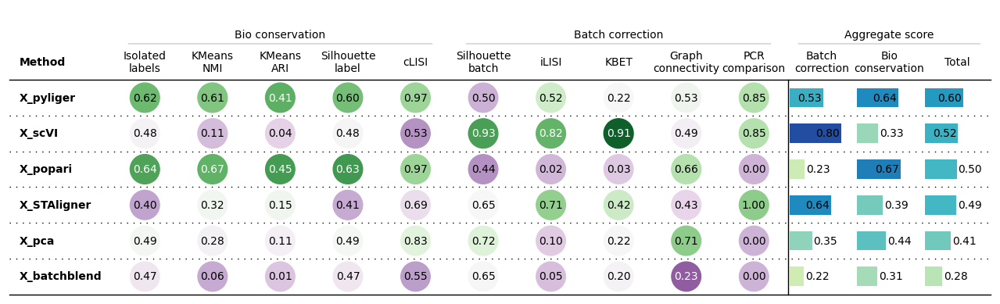

popari/simulated_batch_data/results/batch_effect_1pt5_with_75_percent/processed_dataset_28.csv
Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_75_percent/processed_dataset_7.h5ad


Embeddings:  17%|█▋        | 1/6 [00:01<00:07,  1.54s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:04<00:08,  2.21s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:04<00:04,  1.55s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:05<00:02,  1.22s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:06<00:01,  1.05s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:07<00:00,  1.20s/it]atch correction: pcr_co

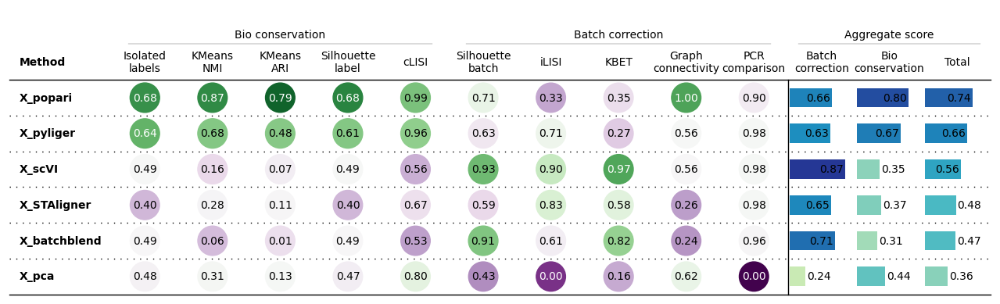

popari/simulated_batch_data/results/batch_effect_1pt5_with_75_percent/processed_dataset_7.csv
Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_75_percent/processed_dataset_42.h5ad


Embeddings:  17%|█▋        | 1/6 [00:05<00:27,  5.42s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:06<00:10,  2.74s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:07<00:06,  2.07s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:09<00:04,  2.11s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:10<00:01,  1.67s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:11<00:00,  1.89s/it]atch correction: pcr_co

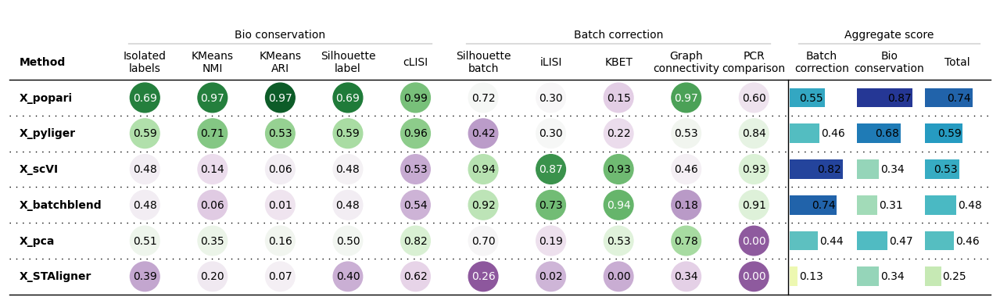

popari/simulated_batch_data/results/batch_effect_1pt5_with_75_percent/processed_dataset_42.csv
Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_75_percent/processed_dataset_10.h5ad


Embeddings:  17%|█▋        | 1/6 [00:03<00:16,  3.32s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:04<00:08,  2.08s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:05<00:04,  1.51s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:06<00:02,  1.22s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:06<00:01,  1.08s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:07<00:00,  1.29s/it]atch correction: pcr_co

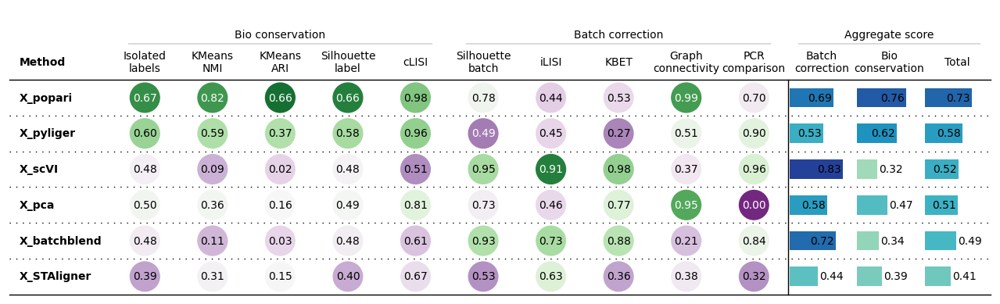

popari/simulated_batch_data/results/batch_effect_1pt5_with_75_percent/processed_dataset_10.csv
Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_75_percent/processed_dataset_13.h5ad


Embeddings:  17%|█▋        | 1/6 [00:02<00:11,  2.25s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:03<00:06,  1.62s/it]atch correction: pcr_comparison]
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:04<00:03,  1.24s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:05<00:02,  1.10s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:05<00:00,  1.01it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:06<00:00,  1.10s/it]atch correction: pcr_compar

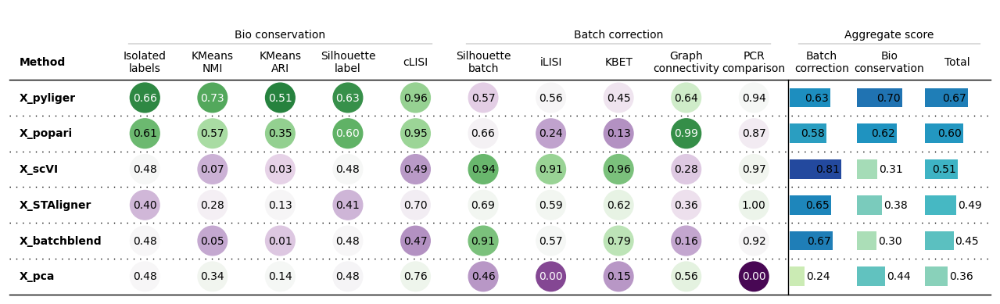

popari/simulated_batch_data/results/batch_effect_1pt5_with_75_percent/processed_dataset_13.csv
Processing file popari/simulated_batch_data/output/batch_effect_3_with_75_percent/processed_dataset_42.h5ad


Embeddings:  17%|█▋        | 1/6 [00:02<00:11,  2.22s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:03<00:05,  1.40s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:03<00:03,  1.13s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:04<00:01,  1.02it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:05<00:00,  1.11it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:06<00:00,  1.02s/it]atch correction: pcr_co

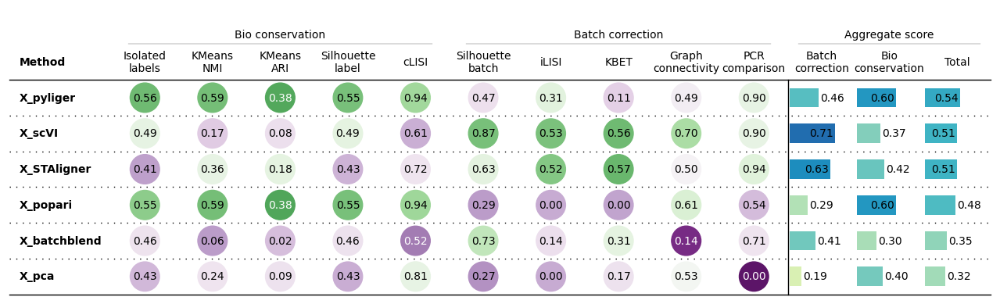

popari/simulated_batch_data/results/batch_effect_3_with_75_percent/processed_dataset_42.csv
Processing file popari/simulated_batch_data/output/batch_effect_3_with_75_percent/processed_dataset_28.h5ad


Embeddings:  17%|█▋        | 1/6 [00:01<00:07,  1.56s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:02<00:04,  1.08s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:03<00:02,  1.07it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:04<00:01,  1.03it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:04<00:00,  1.13it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:05<00:00,  1.08it/s]atch correction: pcr_co

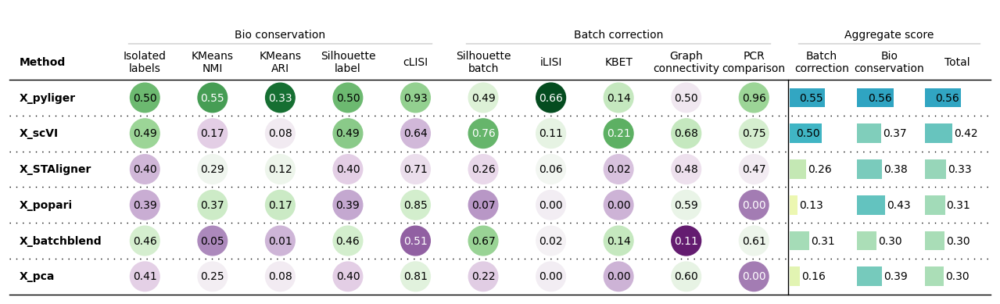

popari/simulated_batch_data/results/batch_effect_3_with_75_percent/processed_dataset_28.csv
Processing file popari/simulated_batch_data/output/batch_effect_3_with_75_percent/processed_dataset_7.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.17it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.28it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.32it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.36it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.38it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.35it/s]atch correction: pcr_co

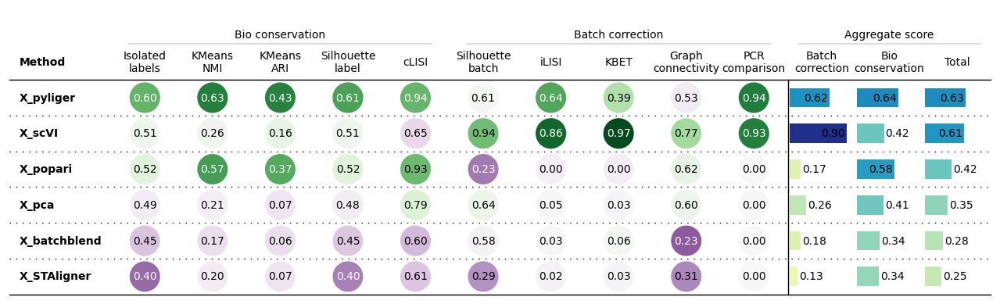

popari/simulated_batch_data/results/batch_effect_3_with_75_percent/processed_dataset_7.csv
Processing file popari/simulated_batch_data/output/batch_effect_3_with_75_percent/processed_dataset_10.h5ad


Embeddings:  17%|█▋        | 1/6 [00:01<00:05,  1.14s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.09it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.18it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.07it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:04<00:00,  1.17it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:05<00:00,  1.16it/s]atch correction: pcr_co

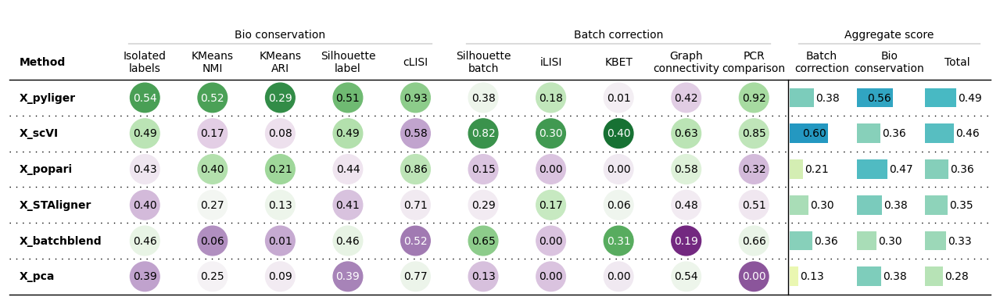

popari/simulated_batch_data/results/batch_effect_3_with_75_percent/processed_dataset_10.csv
Processing file popari/simulated_batch_data/output/batch_effect_3_with_75_percent/processed_dataset_13.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.17it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:04,  1.02s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.12it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.03it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:04<00:00,  1.14it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:05<00:00,  1.14it/s]atch correction: pcr_co

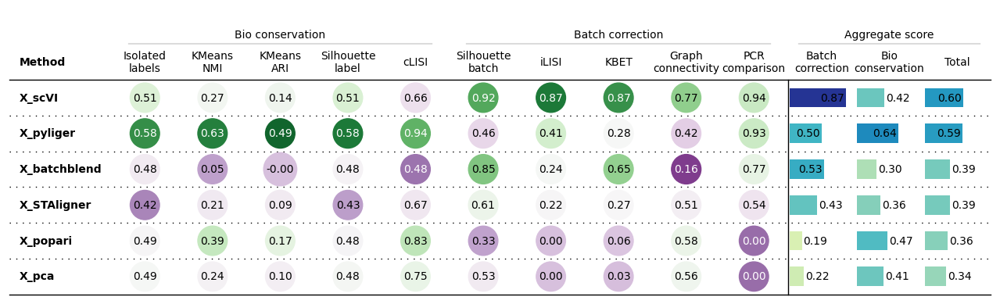

popari/simulated_batch_data/results/batch_effect_3_with_75_percent/processed_dataset_13.csv
Processing file popari/simulated_batch_data/output/batch_effect_2_with_75_percent/processed_dataset_13.h5ad


Embeddings:  17%|█▋        | 1/6 [00:01<00:09,  1.93s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:02<00:05,  1.27s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:03<00:03,  1.05s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:04<00:01,  1.08it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:05<00:00,  1.14it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:05<00:00,  1.04it/s]atch correction: pcr_co

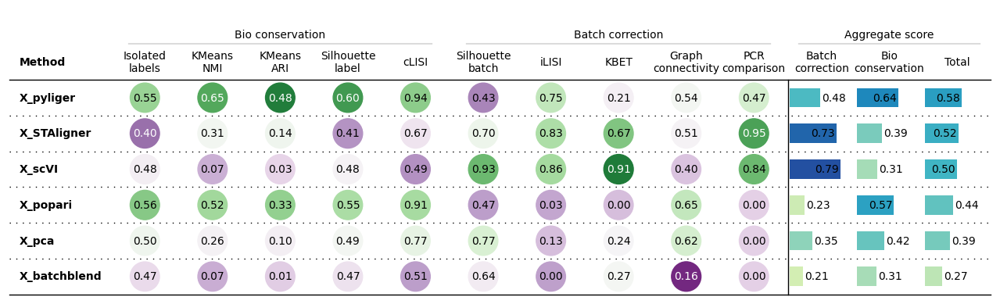

popari/simulated_batch_data/results/batch_effect_2_with_75_percent/processed_dataset_13.csv
Processing file popari/simulated_batch_data/output/batch_effect_2_with_75_percent/processed_dataset_7.h5ad


Embeddings:  17%|█▋        | 1/6 [00:02<00:11,  2.37s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:03<00:06,  1.65s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:04<00:03,  1.25s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:04<00:02,  1.04s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:05<00:00,  1.07it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:06<00:00,  1.08s/it]atch correction: pcr_co

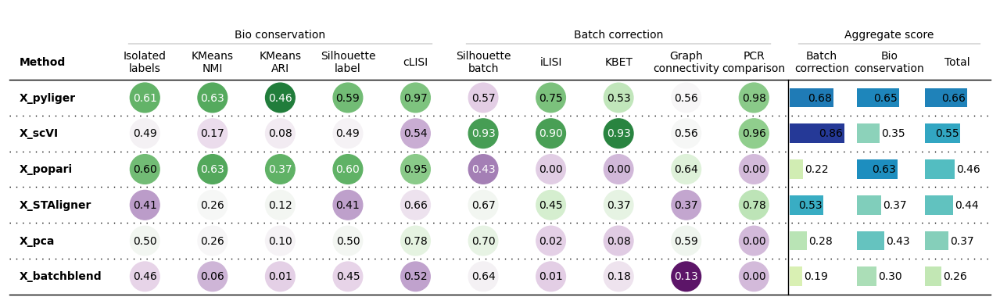

popari/simulated_batch_data/results/batch_effect_2_with_75_percent/processed_dataset_7.csv
Processing file popari/simulated_batch_data/output/batch_effect_2_with_75_percent/processed_dataset_28.h5ad


Embeddings:  17%|█▋        | 1/6 [00:01<00:09,  1.88s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:03<00:05,  1.49s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:03<00:03,  1.18s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:04<00:02,  1.01s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:05<00:00,  1.07it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:06<00:00,  1.03s/it]atch correction: pcr_co

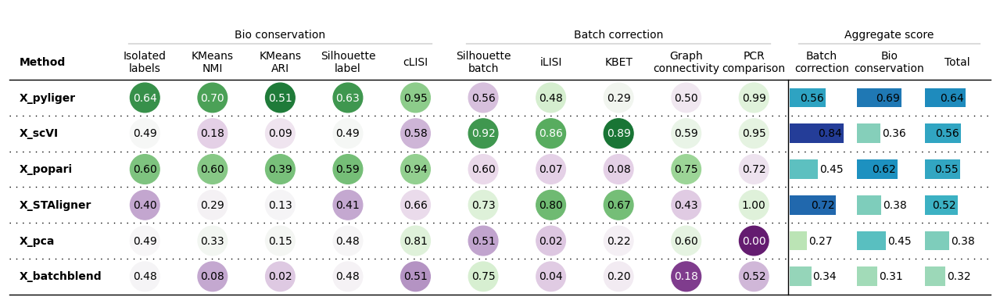

popari/simulated_batch_data/results/batch_effect_2_with_75_percent/processed_dataset_28.csv
Processing file popari/simulated_batch_data/output/batch_effect_2_with_75_percent/processed_dataset_42.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.18it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.26it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.30it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.36it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.35it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.33it/s]atch correction: pcr_co

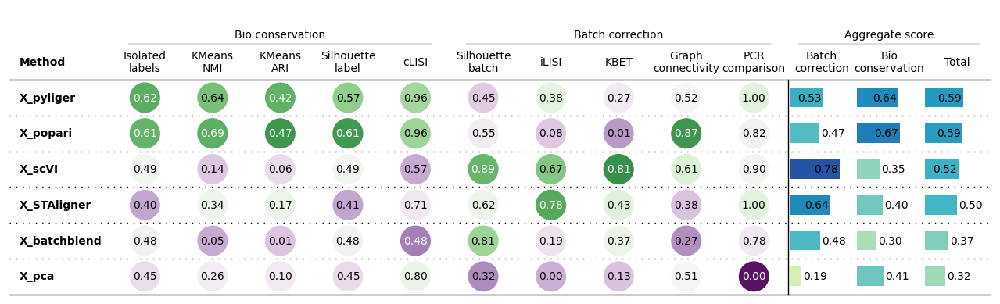

popari/simulated_batch_data/results/batch_effect_2_with_75_percent/processed_dataset_42.csv
Processing file popari/simulated_batch_data/output/batch_effect_2_with_75_percent/processed_dataset_10.h5ad


Embeddings:  17%|█▋        | 1/6 [00:01<00:05,  1.18s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.08it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.17it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.25it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:04<00:00,  1.29it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.23it/s]atch correction: pcr_co

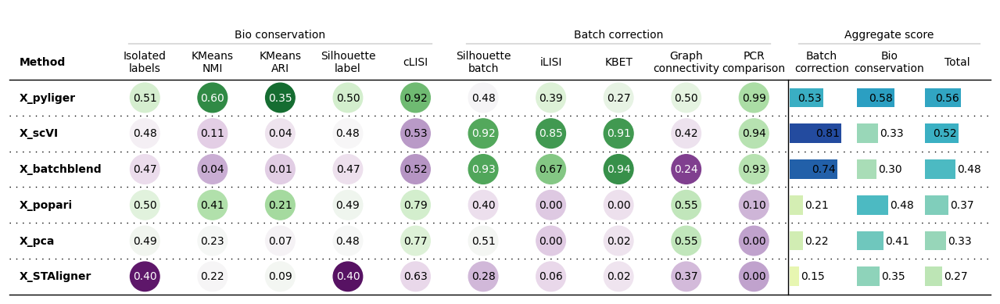

popari/simulated_batch_data/results/batch_effect_2_with_75_percent/processed_dataset_10.csv
Processing file popari/simulated_batch_data/output/batch_effect_5_with_50_percent/processed_dataset_13.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.27it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:02<00:01,  1.37it/s]atch correction: pcr_comparison]
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.39it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.35it/s]atch correction: pcr_compar

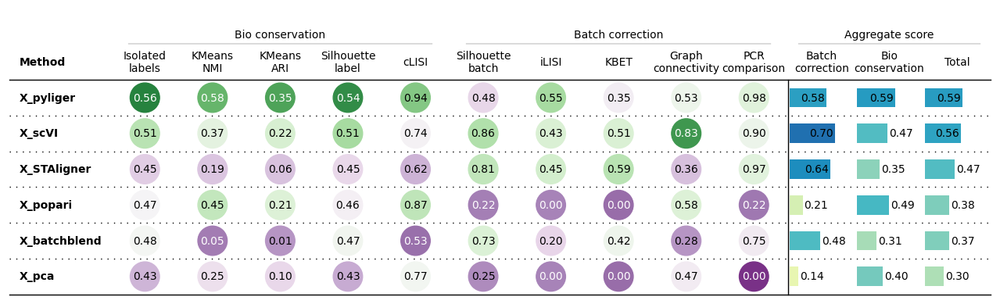

popari/simulated_batch_data/results/batch_effect_5_with_50_percent/processed_dataset_13.csv
Processing file popari/simulated_batch_data/output/batch_effect_5_with_50_percent/processed_dataset_42.h5ad


Embeddings:  17%|█▋        | 1/6 [00:01<00:05,  1.18s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:02<00:04,  1.18s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:03<00:02,  1.01it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.14it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:04<00:00,  1.22it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:05<00:00,  1.13it/s]atch correction: pcr_co

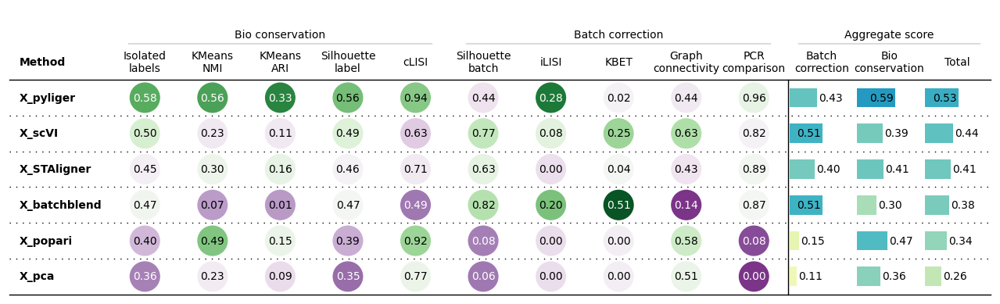

popari/simulated_batch_data/results/batch_effect_5_with_50_percent/processed_dataset_42.csv
Processing file popari/simulated_batch_data/output/batch_effect_5_with_50_percent/processed_dataset_7.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.26it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.29it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.35it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.37it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.34it/s]atch correction: pcr_co

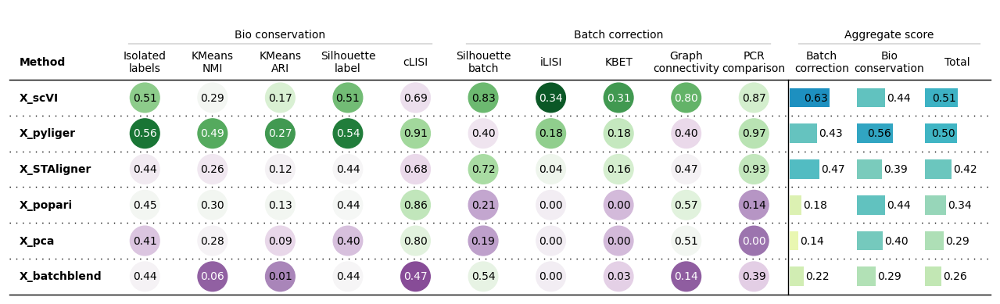

popari/simulated_batch_data/results/batch_effect_5_with_50_percent/processed_dataset_7.csv
Processing file popari/simulated_batch_data/output/batch_effect_5_with_50_percent/processed_dataset_28.h5ad


Embeddings:  17%|█▋        | 1/6 [00:01<00:07,  1.50s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:02<00:05,  1.33s/it]atch correction: pcr_comparison]
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:03<00:03,  1.08s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:04<00:01,  1.06it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:04<00:00,  1.14it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:05<00:00,  1.05it/s]atch correction: pcr_compar

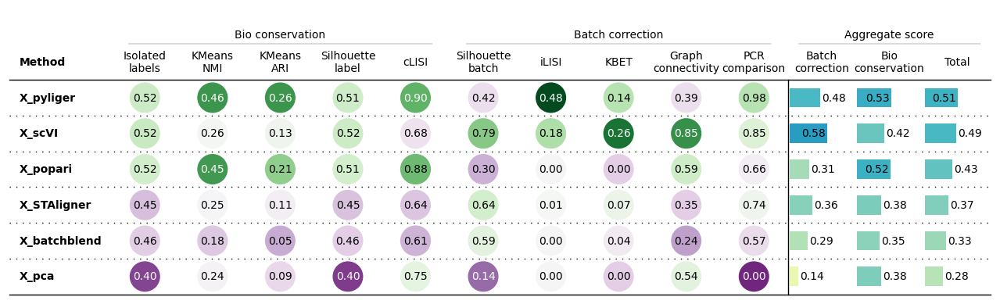

popari/simulated_batch_data/results/batch_effect_5_with_50_percent/processed_dataset_28.csv
Processing file popari/simulated_batch_data/output/batch_effect_5_with_50_percent/processed_dataset_10.h5ad


Embeddings:  17%|█▋        | 1/6 [00:01<00:05,  1.16s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.06it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.16it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.25it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:04<00:00,  1.29it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.23it/s]atch correction: pcr_co

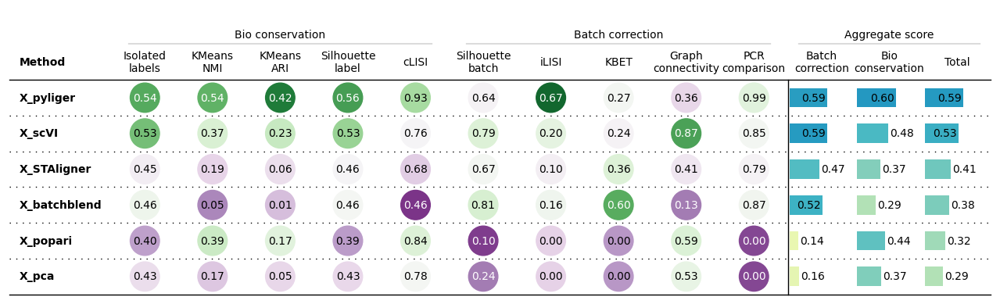

popari/simulated_batch_data/results/batch_effect_5_with_50_percent/processed_dataset_10.csv
Processing file popari/simulated_batch_data/output/batch_effect_1_with_75_percent/processed_dataset_42.h5ad


Embeddings:  17%|█▋        | 1/6 [00:01<00:05,  1.20s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:02<00:04,  1.20s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:03<00:03,  1.00s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.12it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:04<00:00,  1.19it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:05<00:00,  1.11it/s]atch correction: pcr_co

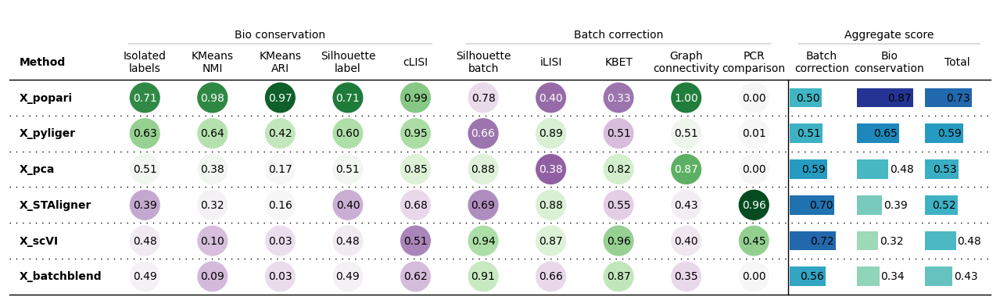

popari/simulated_batch_data/results/batch_effect_1_with_75_percent/processed_dataset_42.csv
Processing file popari/simulated_batch_data/output/batch_effect_1_with_75_percent/processed_dataset_28.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.16it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.25it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.25it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.23it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:04<00:00,  1.26it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.26it/s]atch correction: pcr_co

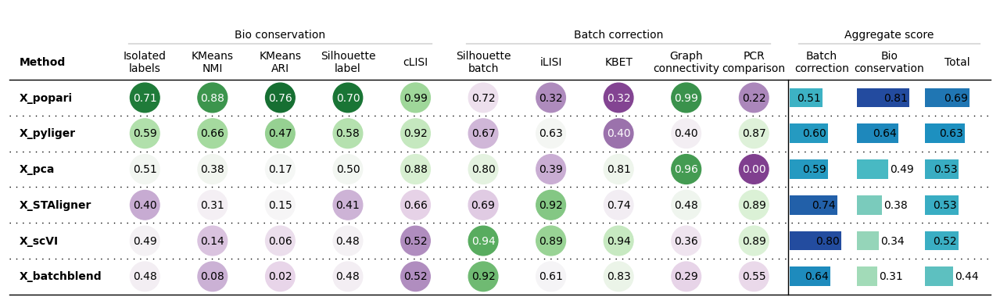

popari/simulated_batch_data/results/batch_effect_1_with_75_percent/processed_dataset_28.csv
Processing file popari/simulated_batch_data/output/batch_effect_1_with_75_percent/processed_dataset_10.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.15it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.23it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.28it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.33it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.34it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.31it/s]atch correction: pcr_co

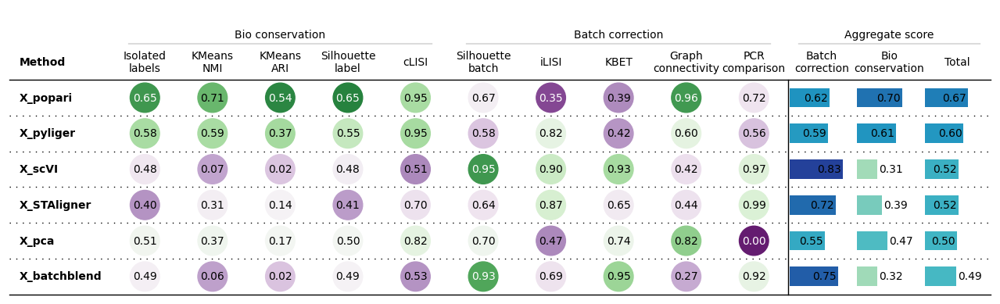

popari/simulated_batch_data/results/batch_effect_1_with_75_percent/processed_dataset_10.csv
Processing file popari/simulated_batch_data/output/batch_effect_1_with_75_percent/processed_dataset_7.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.16it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.23it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.28it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.34it/s]atch correction: pcr_comparison]
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.35it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.32it/s]atch correction: pcr_compar

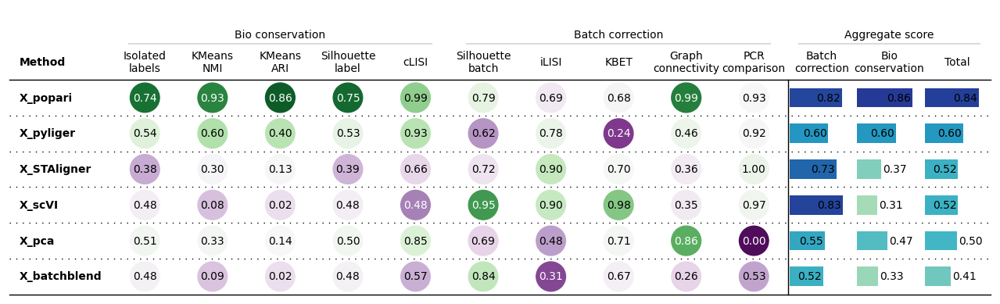

popari/simulated_batch_data/results/batch_effect_1_with_75_percent/processed_dataset_7.csv
Processing file popari/simulated_batch_data/output/batch_effect_1_with_75_percent/processed_dataset_13.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.17it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.24it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.28it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.34it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.34it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.31it/s]atch correction: pcr_co

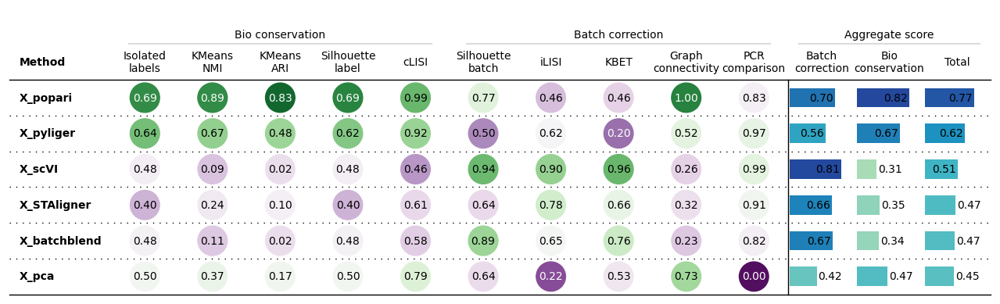

popari/simulated_batch_data/results/batch_effect_1_with_75_percent/processed_dataset_13.csv
Processing file popari/simulated_batch_data/output/batch_effect_2_with_100_percent/processed_dataset_7.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.16it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.25it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.29it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.11it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:04<00:00,  1.19it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.22it/s]atch correction: pcr_co

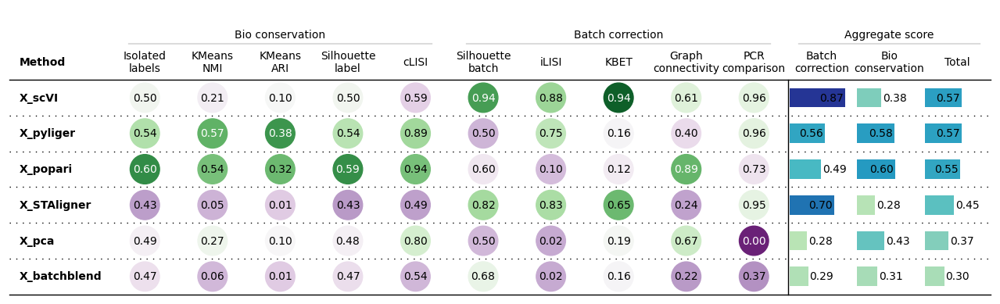

popari/simulated_batch_data/results/batch_effect_2_with_100_percent/processed_dataset_7.csv
Processing file popari/simulated_batch_data/output/batch_effect_2_with_100_percent/processed_dataset_10.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.15it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.23it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.26it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.32it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.34it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.31it/s]atch correction: pcr_co

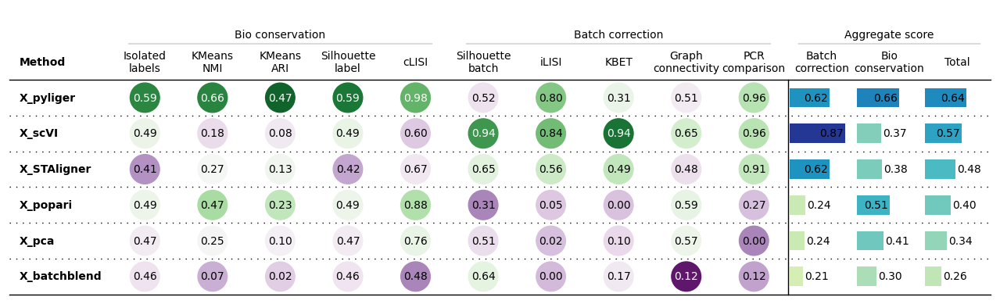

popari/simulated_batch_data/results/batch_effect_2_with_100_percent/processed_dataset_10.csv
Processing file popari/simulated_batch_data/output/batch_effect_2_with_100_percent/processed_dataset_42.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.19it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.24it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.28it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.33it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.35it/s]atch correction: pcr_comparison]
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.31it/s]atch correction: pcr_compar

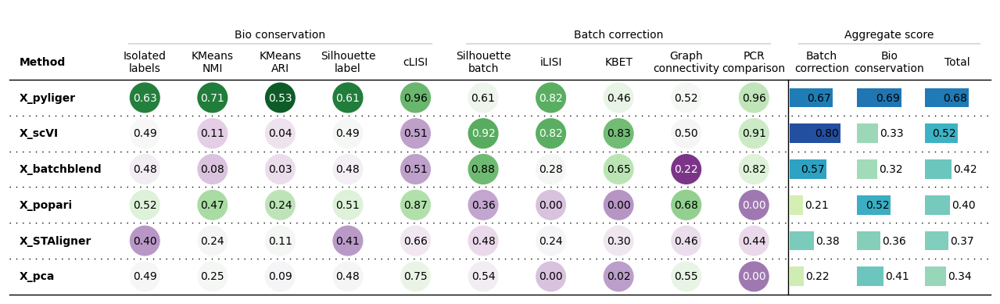

popari/simulated_batch_data/results/batch_effect_2_with_100_percent/processed_dataset_42.csv
Processing file popari/simulated_batch_data/output/batch_effect_2_with_100_percent/processed_dataset_28.h5ad


Embeddings:  17%|█▋        | 1/6 [00:01<00:08,  1.66s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:02<00:04,  1.15s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:03<00:02,  1.02it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.14it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:04<00:00,  1.20it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:05<00:00,  1.10it/s]atch correction: pcr_co

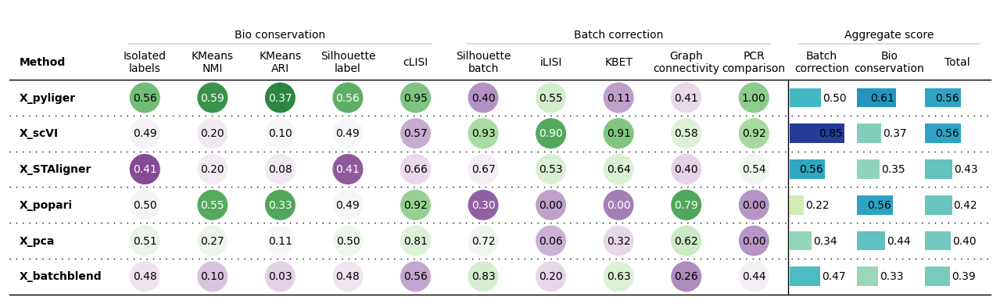

popari/simulated_batch_data/results/batch_effect_2_with_100_percent/processed_dataset_28.csv
Processing file popari/simulated_batch_data/output/batch_effect_2_with_100_percent/processed_dataset_13.h5ad


Embeddings:  17%|█▋        | 1/6 [00:01<00:06,  1.20s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:02<00:03,  1.04it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.13it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.21it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:04<00:00,  1.23it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:05<00:00,  1.19it/s]atch correction: pcr_co

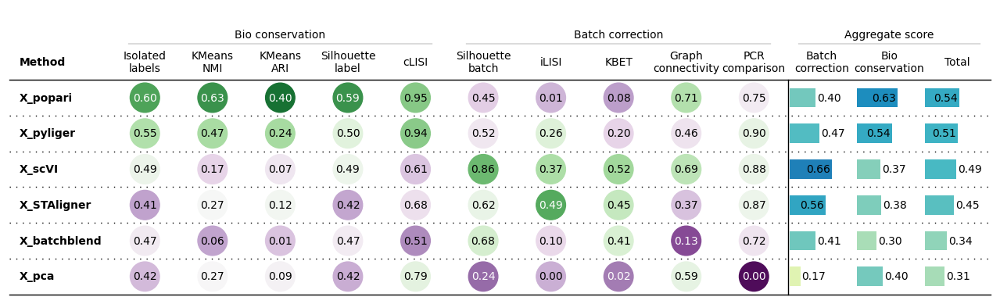

popari/simulated_batch_data/results/batch_effect_2_with_100_percent/processed_dataset_13.csv
Processing file popari/simulated_batch_data/output/batch_effect_3_with_100_percent/processed_dataset_13.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.25it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.28it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.34it/s]atch correction: pcr_comparison]
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.36it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.32it/s]atch correction: pcr_compar

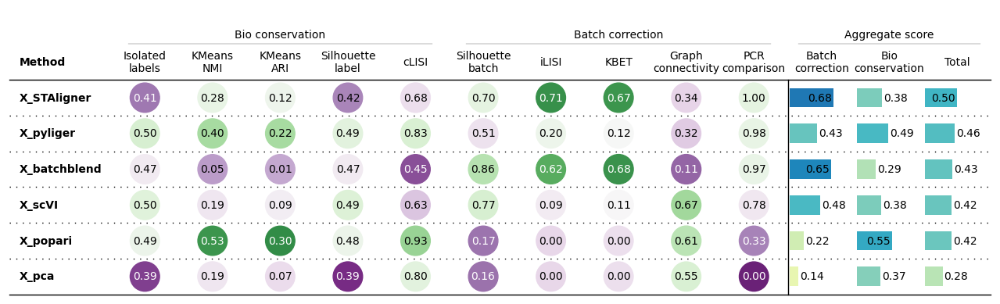

popari/simulated_batch_data/results/batch_effect_3_with_100_percent/processed_dataset_13.csv
Processing file popari/simulated_batch_data/output/batch_effect_3_with_100_percent/processed_dataset_28.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.17it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.24it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.27it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.34it/s]atch correction: pcr_comparison]
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.37it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.32it/s]atch correction: pcr_compar

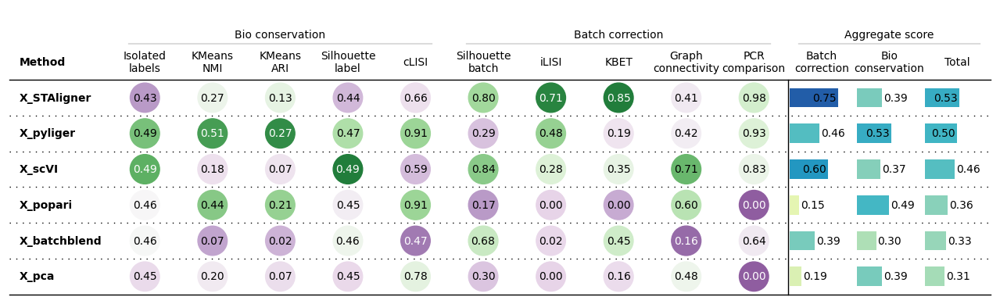

popari/simulated_batch_data/results/batch_effect_3_with_100_percent/processed_dataset_28.csv
Processing file popari/simulated_batch_data/output/batch_effect_3_with_100_percent/processed_dataset_10.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.28it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.29it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.35it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.36it/s]atch correction: pcr_comparison]
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.33it/s]atch correction: pcr_compar

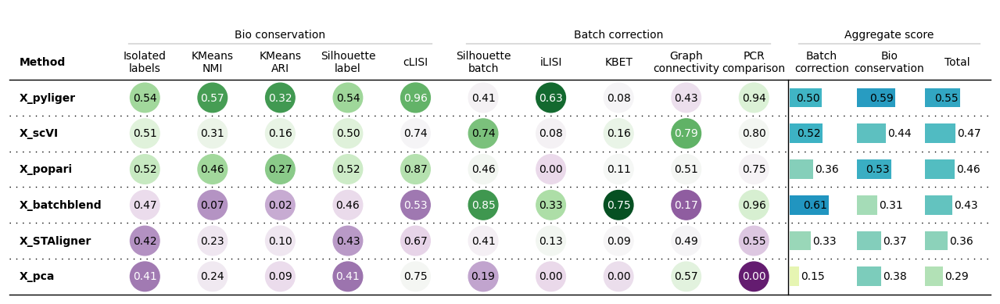

popari/simulated_batch_data/results/batch_effect_3_with_100_percent/processed_dataset_10.csv
Processing file popari/simulated_batch_data/output/batch_effect_0/processed_dataset_13.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.15it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.23it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.27it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.33it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.32it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.30it/s]atch correction: pcr_co

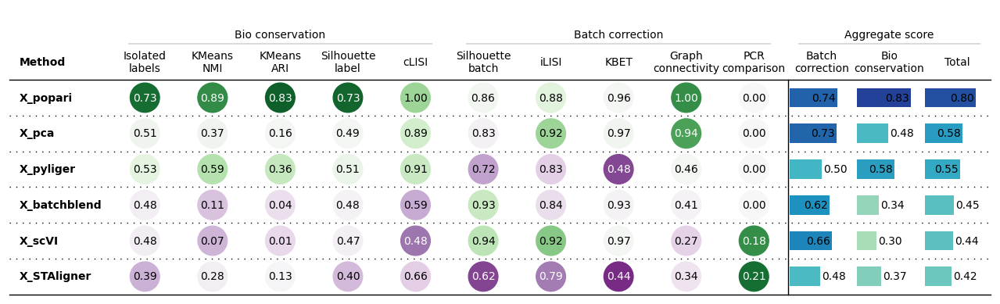

popari/simulated_batch_data/results/batch_effect_0/processed_dataset_13.csv
Processing file popari/simulated_batch_data/output/batch_effect_0/processed_dataset_10.h5ad


Embeddings:  17%|█▋        | 1/6 [00:02<00:10,  2.01s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:02<00:05,  1.31s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:03<00:03,  1.08s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:04<00:01,  1.07it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:05<00:00,  1.13it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:05<00:00,  1.02it/s]atch correction: pcr_co

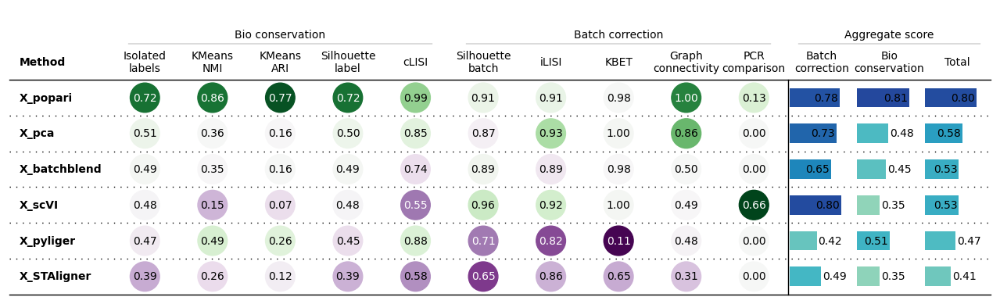

popari/simulated_batch_data/results/batch_effect_0/processed_dataset_10.csv
Processing file popari/simulated_batch_data/output/batch_effect_0/processed_dataset_7.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.16it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.21it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.26it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.33it/s]atch correction: pcr_comparison]
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.33it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.30it/s]atch correction: pcr_compar

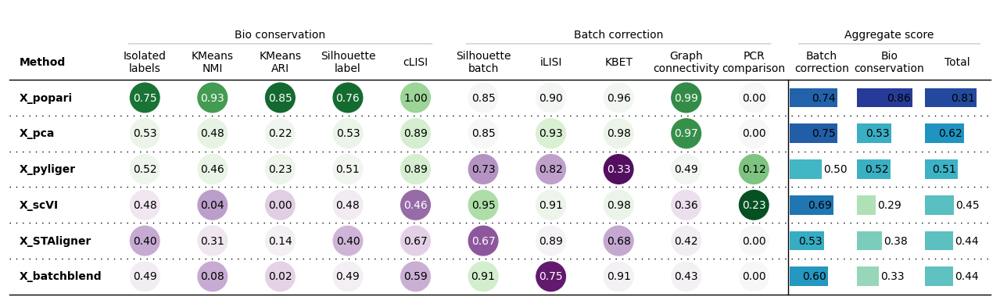

popari/simulated_batch_data/results/batch_effect_0/processed_dataset_7.csv
Processing file popari/simulated_batch_data/output/batch_effect_0/processed_dataset_42.h5ad


Embeddings:  17%|█▋        | 1/6 [00:01<00:07,  1.57s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:02<00:04,  1.13s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:03<00:02,  1.02it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.13it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:04<00:00,  1.18it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:05<00:00,  1.09it/s]atch correction: pcr_co

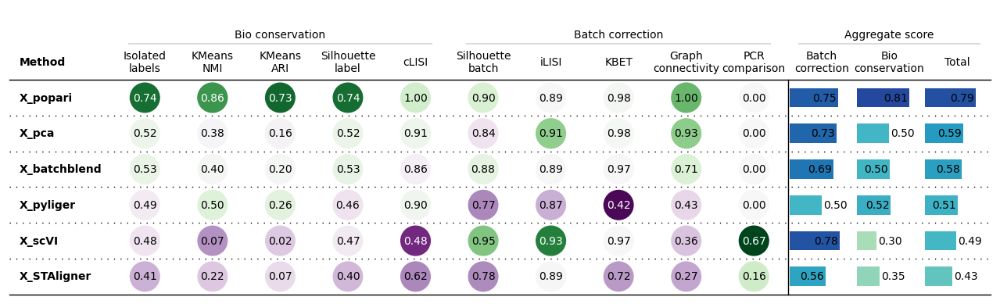

popari/simulated_batch_data/results/batch_effect_0/processed_dataset_42.csv
Processing file popari/simulated_batch_data/output/batch_effect_0/processed_dataset_28.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.14it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.23it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.28it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.34it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.34it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.31it/s]atch correction: pcr_co

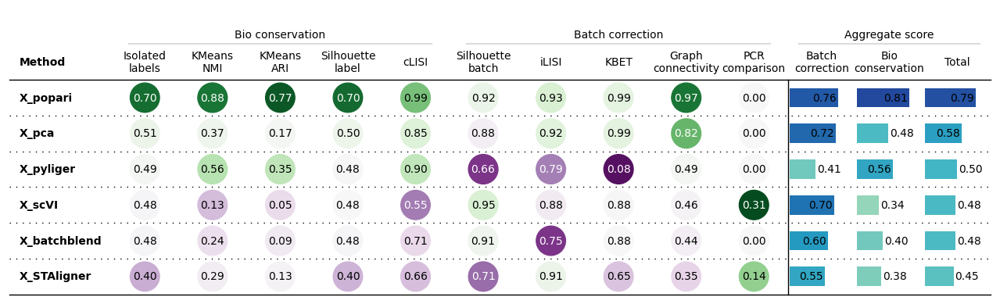

popari/simulated_batch_data/results/batch_effect_0/processed_dataset_28.csv
Processing file popari/simulated_batch_data/output/batch_effect_1_with_100_percent/processed_dataset_13.h5ad


Embeddings:  17%|█▋        | 1/6 [00:01<00:08,  1.66s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:02<00:04,  1.15s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:03<00:02,  1.02it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.14it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:04<00:00,  1.19it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:05<00:00,  1.10it/s]atch correction: pcr_co

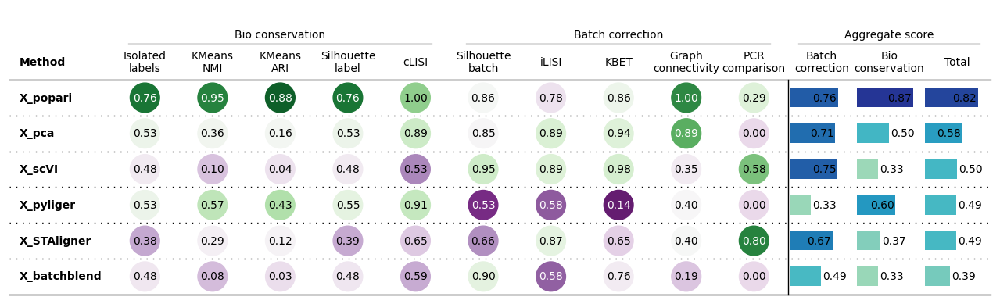

popari/simulated_batch_data/results/batch_effect_1_with_100_percent/processed_dataset_13.csv
Processing file popari/simulated_batch_data/output/batch_effect_1_with_100_percent/processed_dataset_42.h5ad


Embeddings:  17%|█▋        | 1/6 [00:01<00:05,  1.04s/it]atch correction: pcr_comparison]
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.10it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.19it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.26it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:04<00:00,  1.28it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.24it/s]atch correction: pcr_compar

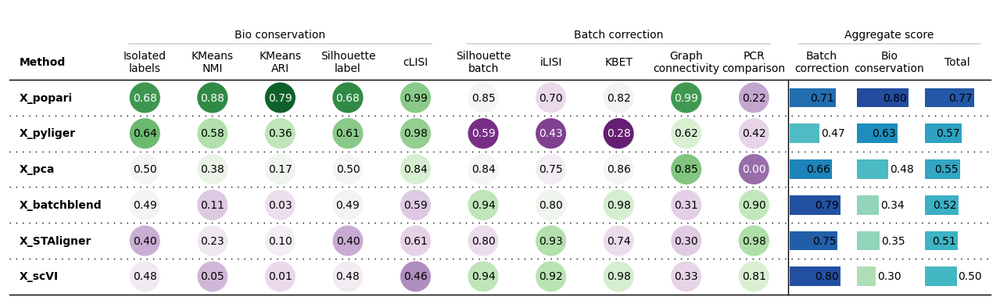

popari/simulated_batch_data/results/batch_effect_1_with_100_percent/processed_dataset_42.csv
Processing file popari/simulated_batch_data/output/batch_effect_1_with_100_percent/processed_dataset_28.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.16it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.24it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.28it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.33it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.33it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.30it/s]atch correction: pcr_co

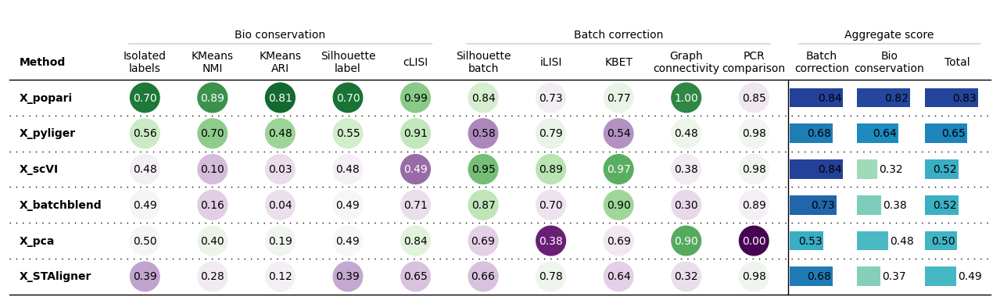

popari/simulated_batch_data/results/batch_effect_1_with_100_percent/processed_dataset_28.csv
Processing file popari/simulated_batch_data/output/batch_effect_1_with_100_percent/processed_dataset_7.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.13it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.26it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.29it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.34it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.34it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.32it/s]atch correction: pcr_co

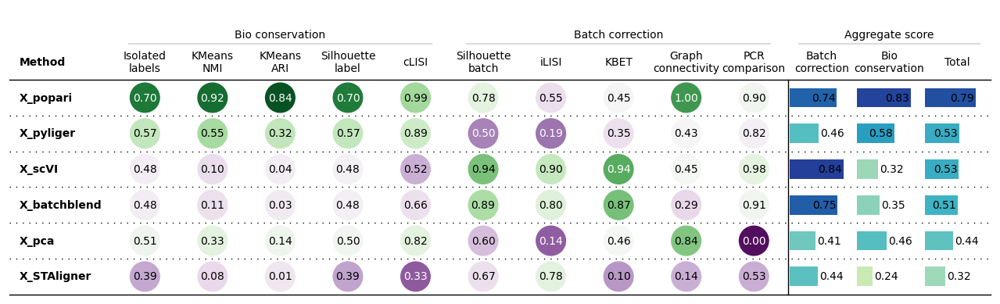

popari/simulated_batch_data/results/batch_effect_1_with_100_percent/processed_dataset_7.csv
Processing file popari/simulated_batch_data/output/batch_effect_1_with_100_percent/processed_dataset_10.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.15it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.24it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.28it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.34it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.33it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.31it/s]atch correction: pcr_co

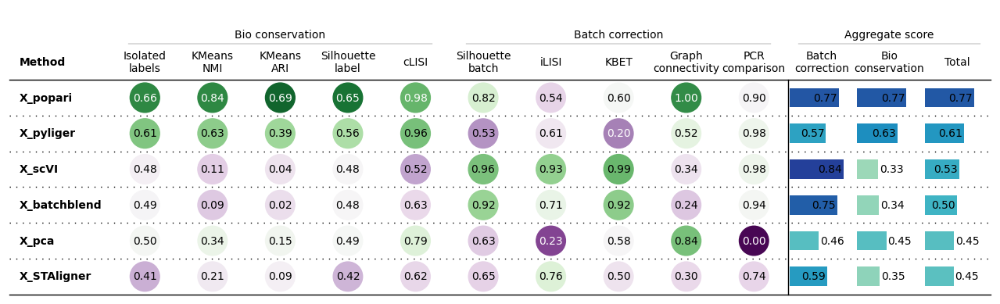

popari/simulated_batch_data/results/batch_effect_1_with_100_percent/processed_dataset_10.csv
Processing file popari/simulated_batch_data/output/batch_effect_5_with_25_percent/processed_dataset_13.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.18it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.24it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.28it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.33it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.33it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.31it/s]atch correction: pcr_co

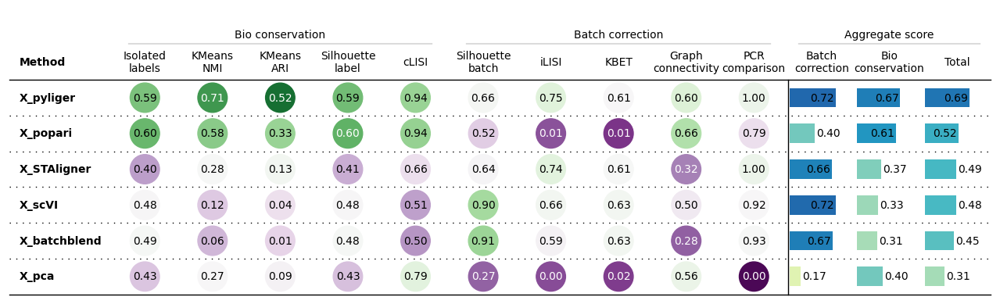

popari/simulated_batch_data/results/batch_effect_5_with_25_percent/processed_dataset_13.csv
Processing file popari/simulated_batch_data/output/batch_effect_5_with_25_percent/processed_dataset_7.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.19it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.25it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.28it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.33it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.35it/s]atch correction: pcr_comparison]
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.32it/s]atch correction: pcr_compar

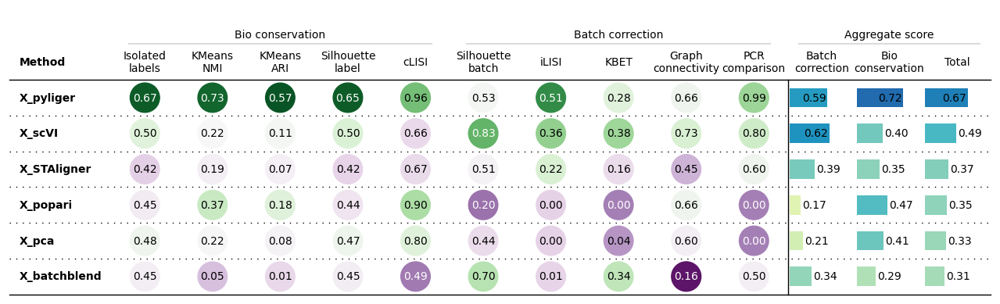

popari/simulated_batch_data/results/batch_effect_5_with_25_percent/processed_dataset_7.csv
Processing file popari/simulated_batch_data/output/batch_effect_5_with_25_percent/processed_dataset_10.h5ad


Embeddings:  17%|█▋        | 1/6 [00:01<00:07,  1.56s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:02<00:05,  1.36s/it]atch correction: pcr_comparison]
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:03<00:03,  1.29s/it]atch correction: pcr_comparison]
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:04<00:02,  1.07s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:05<00:00,  1.04it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:06<00:00,  1.04s/it]atch correction: pcr_comparison

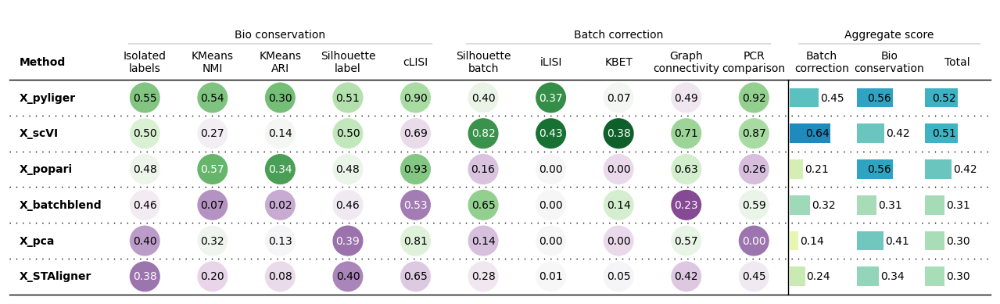

popari/simulated_batch_data/results/batch_effect_5_with_25_percent/processed_dataset_10.csv
Processing file popari/simulated_batch_data/output/batch_effect_5_with_25_percent/processed_dataset_42.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.26it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.29it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.35it/s]atch correction: pcr_comparison]
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.37it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.34it/s]atch correction: pcr_compar

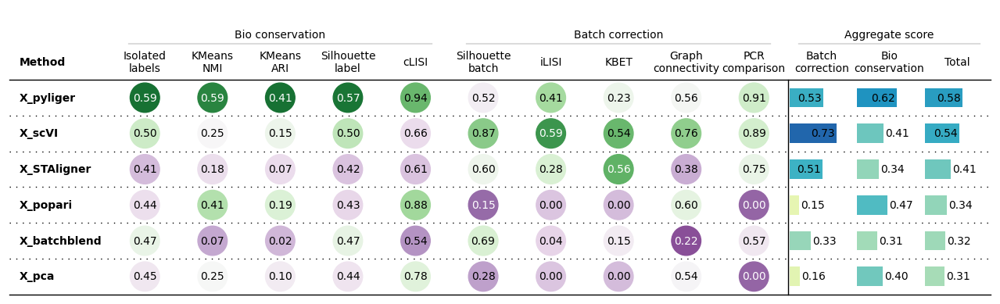

popari/simulated_batch_data/results/batch_effect_5_with_25_percent/processed_dataset_42.csv
Processing file popari/simulated_batch_data/output/batch_effect_5_with_25_percent/processed_dataset_28.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.28it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.30it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.35it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.36it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.34it/s]atch correction: pcr_co

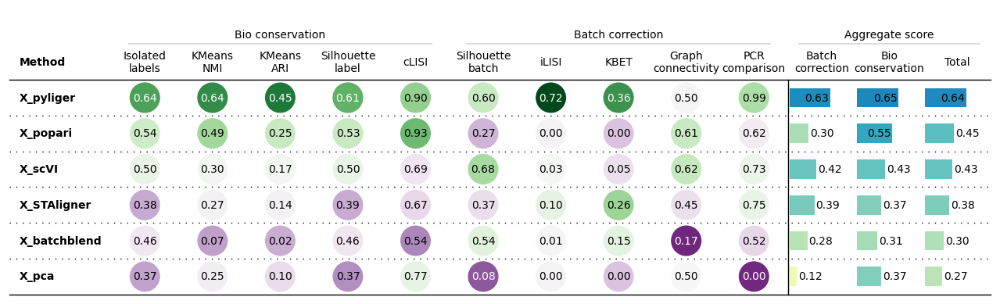

popari/simulated_batch_data/results/batch_effect_5_with_25_percent/processed_dataset_28.csv
Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_25_percent/processed_dataset_7.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.16it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.24it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.28it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.34it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.32it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.30it/s]atch correction: pcr_co

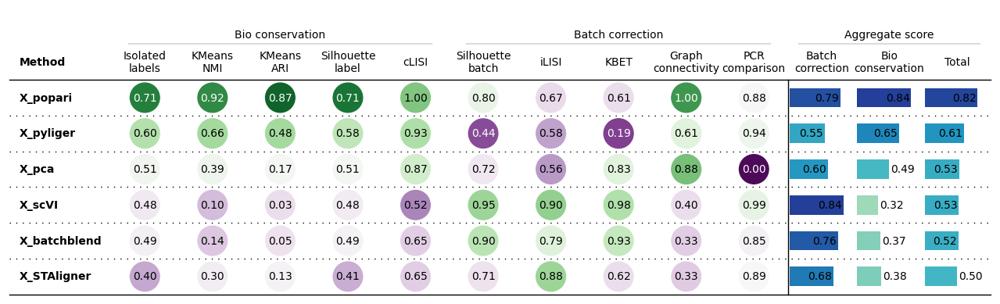

popari/simulated_batch_data/results/batch_effect_1pt5_with_25_percent/processed_dataset_7.csv
Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_25_percent/processed_dataset_28.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.14it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.22it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.26it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]atch correction: pcr_co

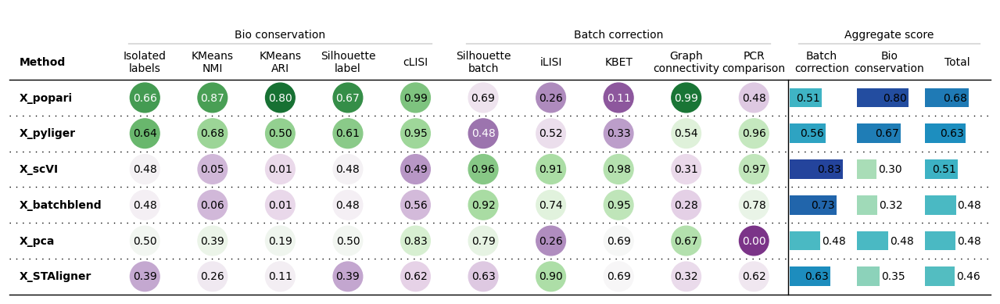

popari/simulated_batch_data/results/batch_effect_1pt5_with_25_percent/processed_dataset_28.csv
Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_25_percent/processed_dataset_42.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.12it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.22it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.26it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]atch correction: pcr_co

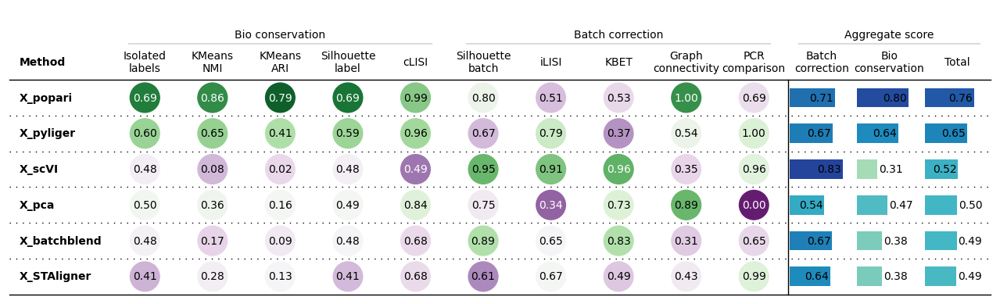

popari/simulated_batch_data/results/batch_effect_1pt5_with_25_percent/processed_dataset_42.csv
Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_25_percent/processed_dataset_10.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.15it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.22it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.26it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]atch correction: pcr_co

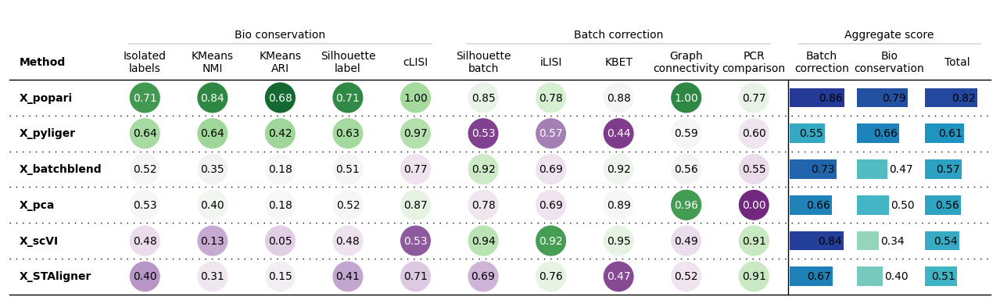

popari/simulated_batch_data/results/batch_effect_1pt5_with_25_percent/processed_dataset_10.csv
Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_25_percent/processed_dataset_13.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.14it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.23it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.27it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:04<00:02,  1.21s/it]atch correction: pcr_comparison]
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:05<00:01,  1.04s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:05<00:00,  1.04it/s]atch correction: pcr_compar

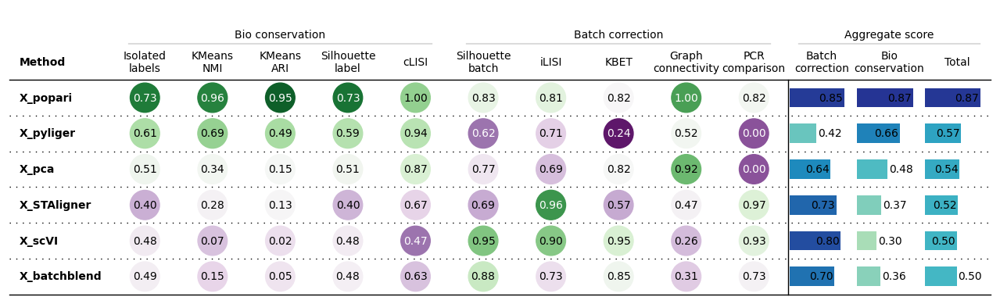

popari/simulated_batch_data/results/batch_effect_1pt5_with_25_percent/processed_dataset_13.csv
Processing file popari/simulated_batch_data/output/batch_effect_1_with_50_percent/processed_dataset_42.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.14it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.24it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.28it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.33it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.33it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.30it/s]atch correction: pcr_co

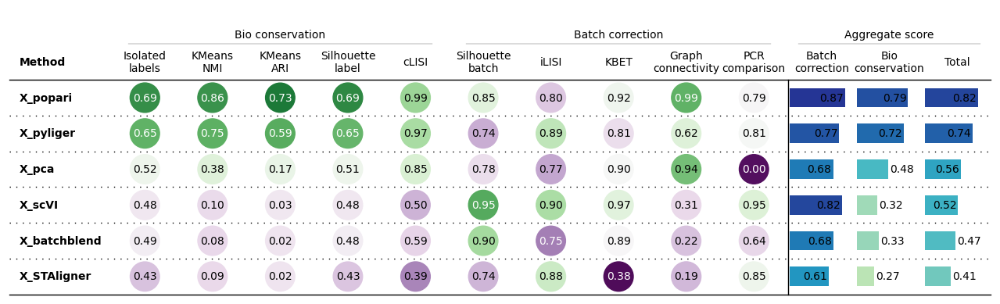

popari/simulated_batch_data/results/batch_effect_1_with_50_percent/processed_dataset_42.csv
Processing file popari/simulated_batch_data/output/batch_effect_1_with_50_percent/processed_dataset_7.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.16it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.23it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.27it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.32it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.32it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.30it/s]atch correction: pcr_co

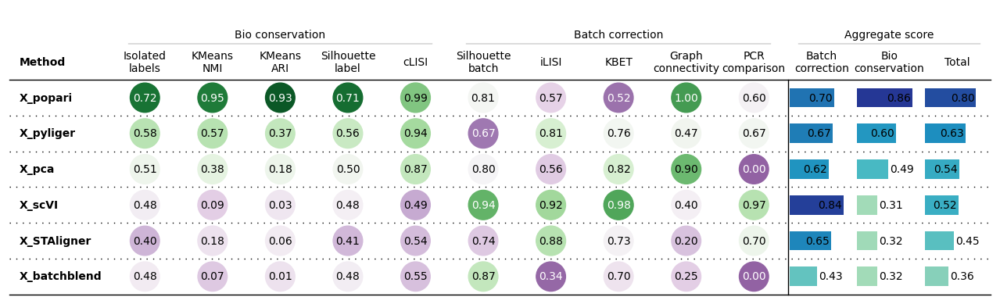

popari/simulated_batch_data/results/batch_effect_1_with_50_percent/processed_dataset_7.csv
Processing file popari/simulated_batch_data/output/batch_effect_1_with_50_percent/processed_dataset_28.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.14it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.22it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.27it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.33it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.33it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.30it/s]atch correction: pcr_co

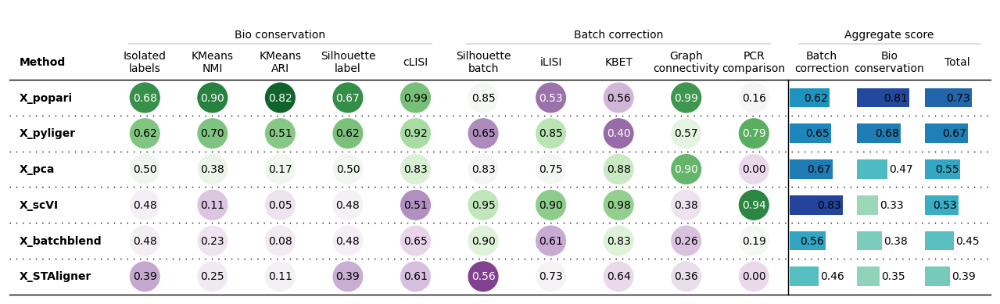

popari/simulated_batch_data/results/batch_effect_1_with_50_percent/processed_dataset_28.csv
Processing file popari/simulated_batch_data/output/batch_effect_1_with_50_percent/processed_dataset_10.h5ad


Embeddings:  17%|█▋        | 1/6 [00:01<00:06,  1.26s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:02<00:03,  1.02it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.12it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.20it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:04<00:00,  1.23it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:05<00:00,  1.18it/s]atch correction: pcr_co

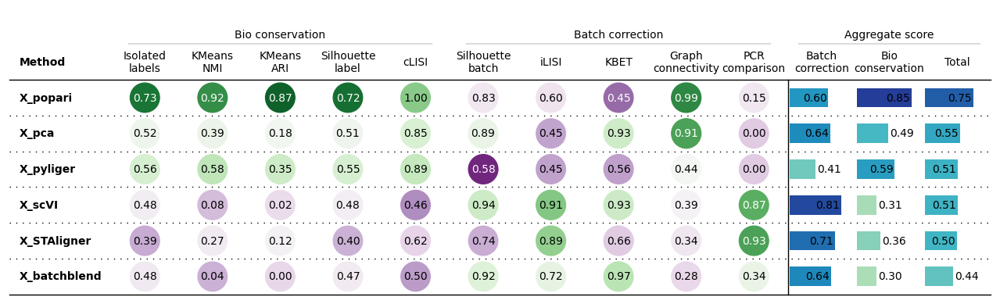

popari/simulated_batch_data/results/batch_effect_1_with_50_percent/processed_dataset_10.csv
Processing file popari/simulated_batch_data/output/batch_effect_1_with_50_percent/processed_dataset_13.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.16it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.22it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.23it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.15it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:04<00:00,  1.21it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.21it/s]atch correction: pcr_co

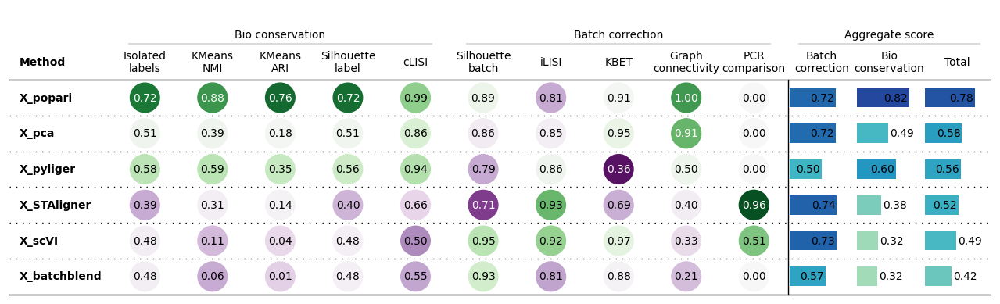

popari/simulated_batch_data/results/batch_effect_1_with_50_percent/processed_dataset_13.csv
Processing file popari/simulated_batch_data/output/batch_effect_3_with_25_percent/processed_dataset_10.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.17it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.26it/s]atch correction: pcr_comparison]
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.29it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.32it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.34it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.31it/s]atch correction: pcr_compar

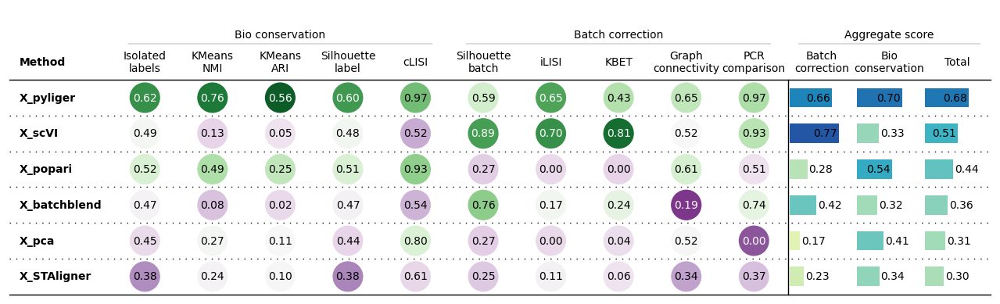

popari/simulated_batch_data/results/batch_effect_3_with_25_percent/processed_dataset_10.csv
Processing file popari/simulated_batch_data/output/batch_effect_3_with_25_percent/processed_dataset_7.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.14it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.20it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.24it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.30it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]atch correction: pcr_co

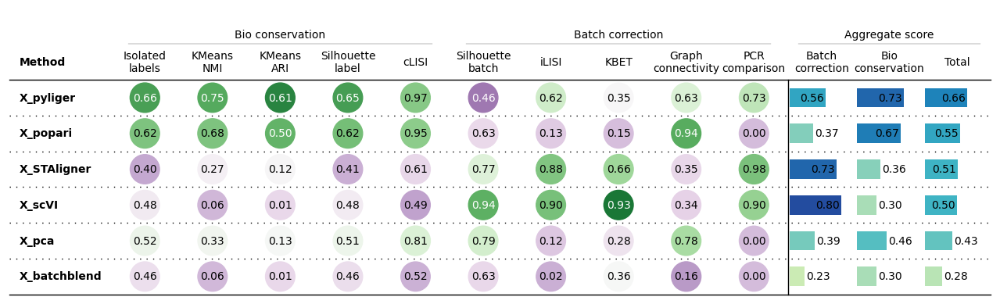

popari/simulated_batch_data/results/batch_effect_3_with_25_percent/processed_dataset_7.csv
Processing file popari/simulated_batch_data/output/batch_effect_3_with_25_percent/processed_dataset_28.h5ad


Embeddings:  17%|█▋        | 1/6 [00:02<00:10,  2.14s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:02<00:05,  1.35s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:03<00:03,  1.08s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:04<00:01,  1.08it/s]atch correction: pcr_comparison]
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:05<00:00,  1.15it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:05<00:00,  1.01it/s]atch correction: pcr_compar

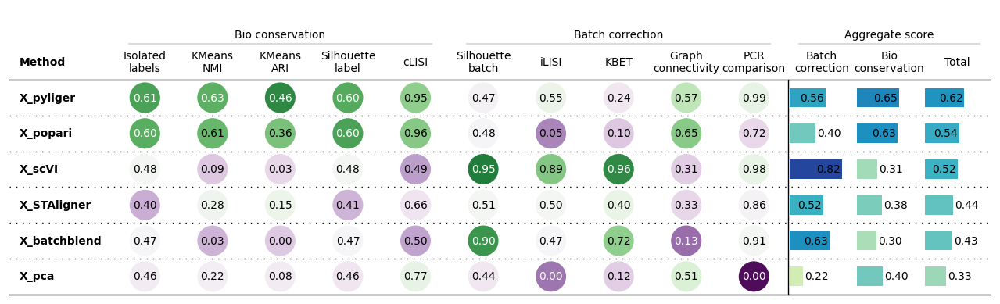

popari/simulated_batch_data/results/batch_effect_3_with_25_percent/processed_dataset_28.csv
Processing file popari/simulated_batch_data/output/batch_effect_3_with_25_percent/processed_dataset_42.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.16it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.23it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.27it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.34it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.30it/s]atch correction: pcr_co

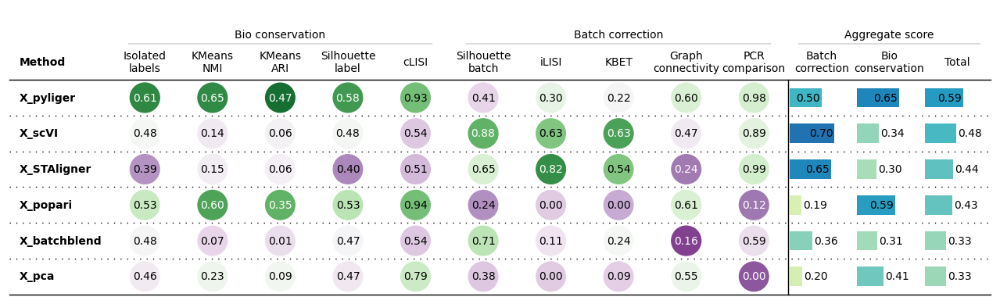

popari/simulated_batch_data/results/batch_effect_3_with_25_percent/processed_dataset_42.csv
Processing file popari/simulated_batch_data/output/batch_effect_3_with_25_percent/processed_dataset_13.h5ad


Embeddings:  17%|█▋        | 1/6 [00:01<00:08,  1.71s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:02<00:04,  1.18s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:03<00:02,  1.00it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:04<00:01,  1.11it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:04<00:00,  1.16it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:05<00:00,  1.07it/s]atch correction: pcr_co

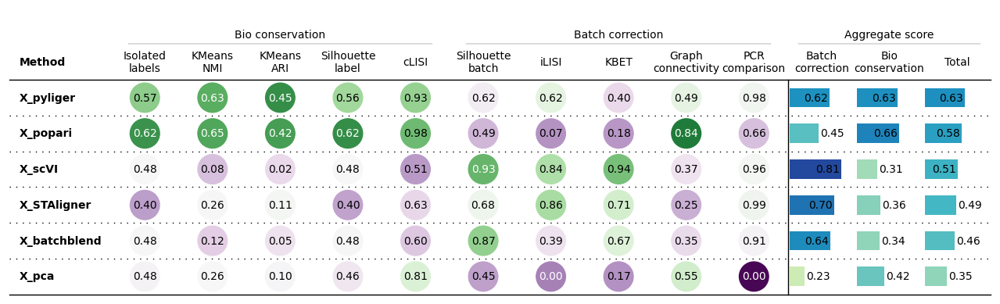

popari/simulated_batch_data/results/batch_effect_3_with_25_percent/processed_dataset_13.csv
Processing file popari/simulated_batch_data/output/batch_effect_2_with_25_percent/processed_dataset_7.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.14it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.22it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.26it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.32it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]atch correction: pcr_co

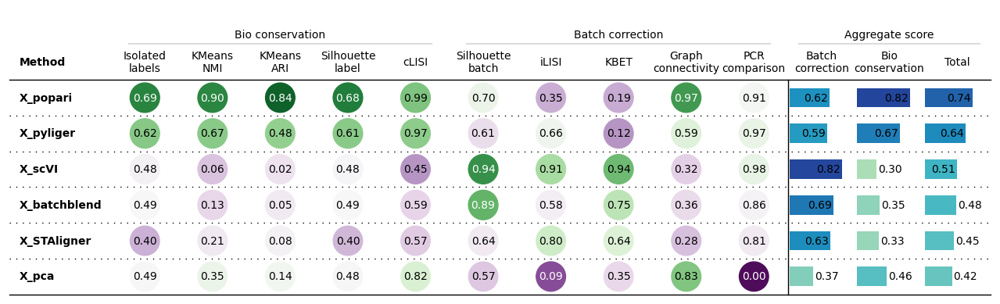

popari/simulated_batch_data/results/batch_effect_2_with_25_percent/processed_dataset_7.csv
Processing file popari/simulated_batch_data/output/batch_effect_2_with_25_percent/processed_dataset_13.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.14it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.24it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.27it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]atch correction: pcr_co

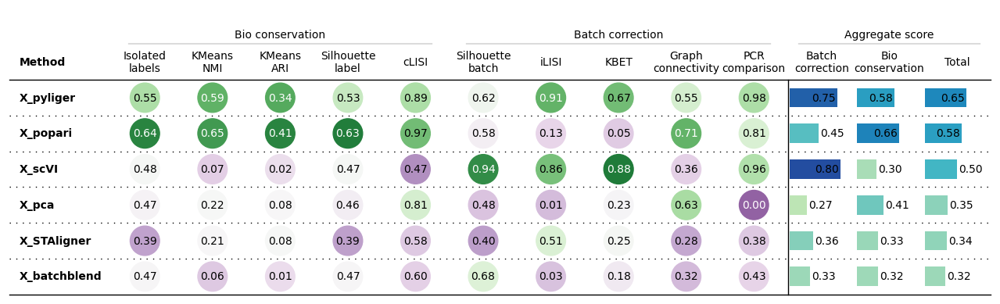

popari/simulated_batch_data/results/batch_effect_2_with_25_percent/processed_dataset_13.csv
Processing file popari/simulated_batch_data/output/batch_effect_2_with_25_percent/processed_dataset_28.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.14it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.21it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.25it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]atch correction: pcr_co

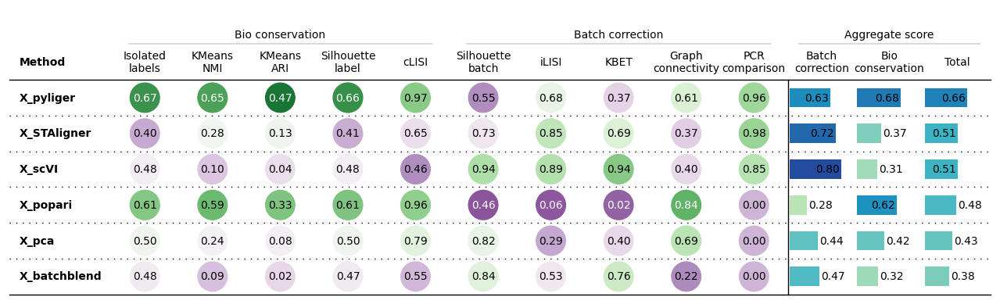

popari/simulated_batch_data/results/batch_effect_2_with_25_percent/processed_dataset_28.csv
Processing file popari/simulated_batch_data/output/batch_effect_2_with_25_percent/processed_dataset_42.h5ad


Embeddings:  17%|█▋        | 1/6 [00:01<00:06,  1.26s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:02<00:03,  1.01it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.11it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.20it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:04<00:00,  1.22it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:05<00:00,  1.17it/s]atch correction: pcr_co

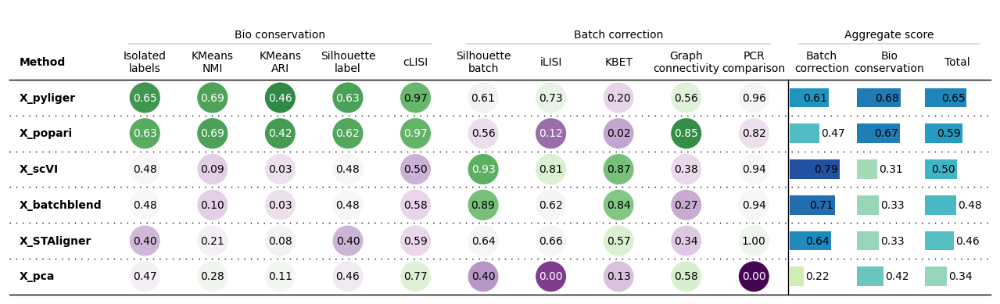

popari/simulated_batch_data/results/batch_effect_2_with_25_percent/processed_dataset_42.csv
Processing file popari/simulated_batch_data/output/batch_effect_2_with_25_percent/processed_dataset_10.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.15it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.24it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.28it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.33it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.33it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.31it/s]atch correction: pcr_co

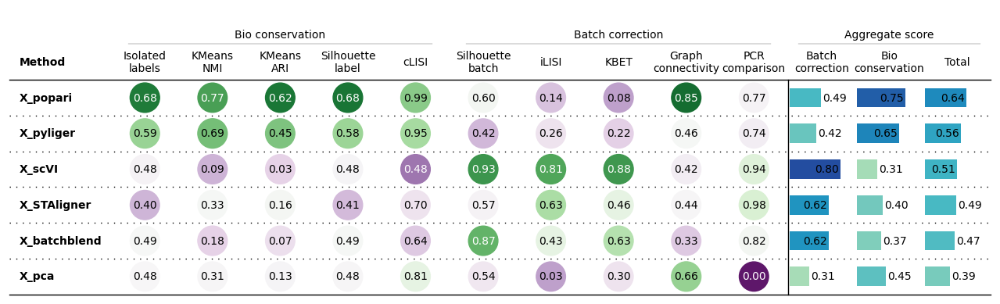

popari/simulated_batch_data/results/batch_effect_2_with_25_percent/processed_dataset_10.csv
Processing file popari/simulated_batch_data/output/batch_effect_1_with_25_percent/processed_dataset_10.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.14it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.22it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.26it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.33it/s]atch correction: pcr_comparison]
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.33it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.30it/s]atch correction: pcr_compar

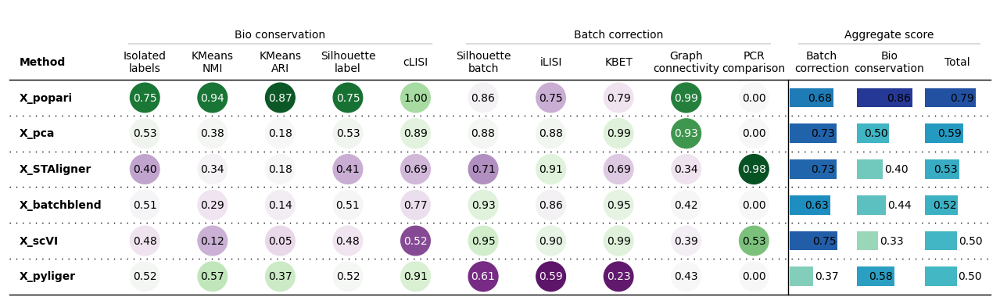

popari/simulated_batch_data/results/batch_effect_1_with_25_percent/processed_dataset_10.csv
Processing file popari/simulated_batch_data/output/batch_effect_1_with_25_percent/processed_dataset_42.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.15it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.24it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.26it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.32it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.32it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.30it/s]atch correction: pcr_co

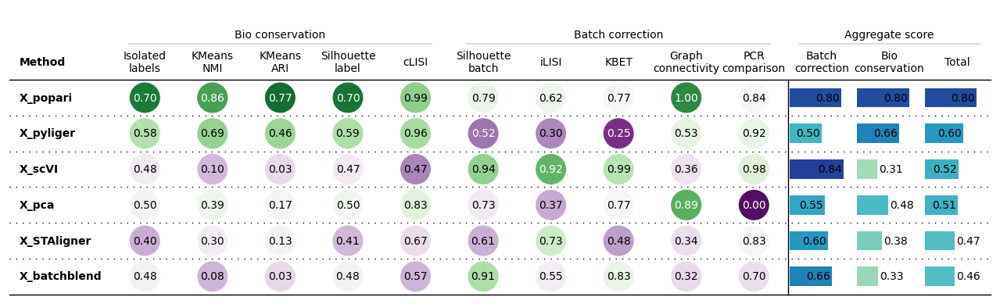

popari/simulated_batch_data/results/batch_effect_1_with_25_percent/processed_dataset_42.csv
Processing file popari/simulated_batch_data/output/batch_effect_1_with_25_percent/processed_dataset_28.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.14it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.22it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.26it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.32it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.32it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]atch correction: pcr_co

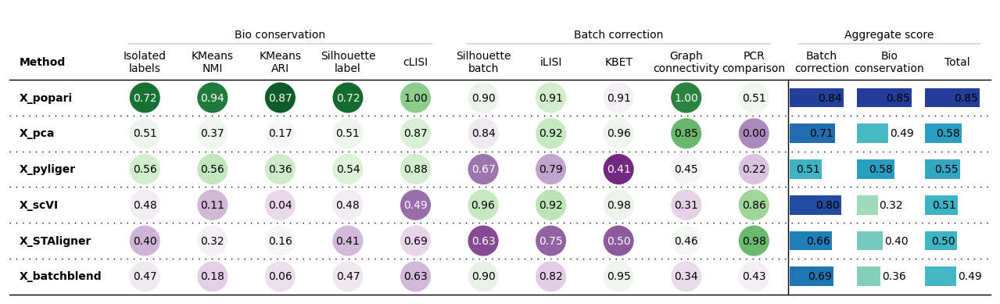

popari/simulated_batch_data/results/batch_effect_1_with_25_percent/processed_dataset_28.csv
Processing file popari/simulated_batch_data/output/batch_effect_1_with_25_percent/processed_dataset_13.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.15it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.23it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.26it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.33it/s]atch correction: pcr_comparison]
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.33it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.30it/s]atch correction: pcr_compar

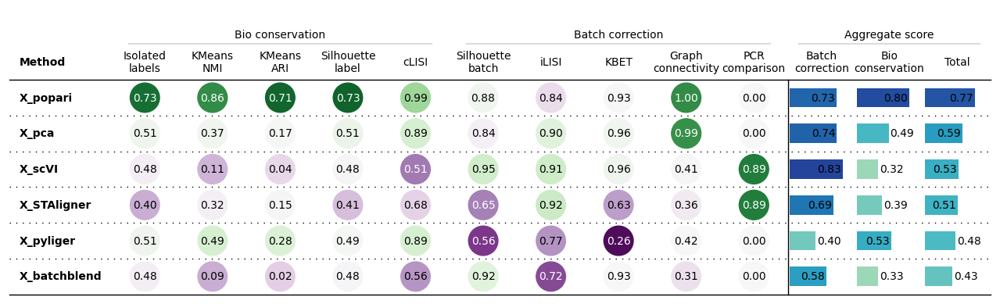

popari/simulated_batch_data/results/batch_effect_1_with_25_percent/processed_dataset_13.csv
Processing file popari/simulated_batch_data/output/batch_effect_1_with_25_percent/processed_dataset_7.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.14it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.22it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.26it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]atch correction: pcr_co

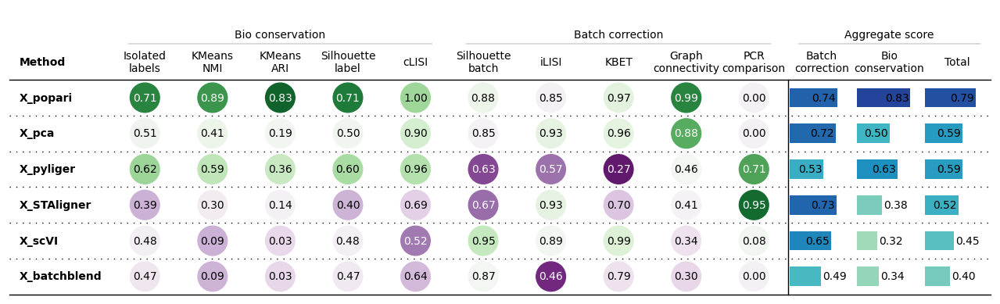

popari/simulated_batch_data/results/batch_effect_1_with_25_percent/processed_dataset_7.csv
Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_50_percent/processed_dataset_13.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.13it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.21it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.26it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.32it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.33it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.30it/s]atch correction: pcr_co

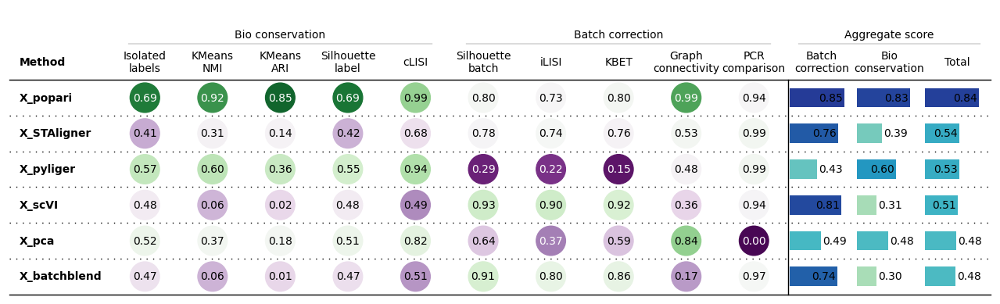

popari/simulated_batch_data/results/batch_effect_1pt5_with_50_percent/processed_dataset_13.csv
Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_50_percent/processed_dataset_10.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.15it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.23it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.27it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.32it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.32it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.30it/s]atch correction: pcr_co

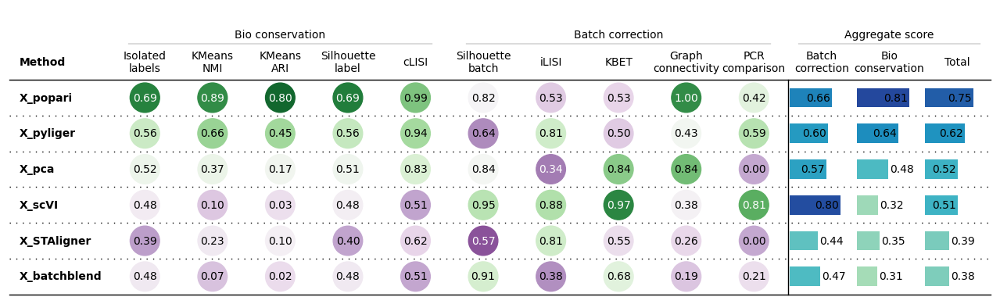

popari/simulated_batch_data/results/batch_effect_1pt5_with_50_percent/processed_dataset_10.csv
Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_50_percent/processed_dataset_7.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.15it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.23it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.26it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]atch correction: pcr_co

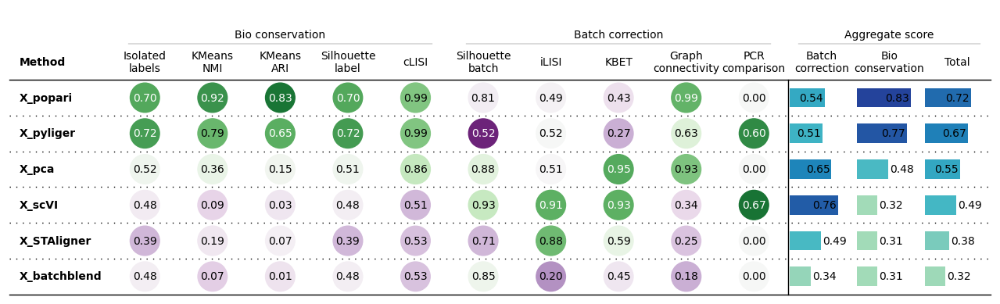

popari/simulated_batch_data/results/batch_effect_1pt5_with_50_percent/processed_dataset_7.csv
Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_50_percent/processed_dataset_28.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.13it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.21it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.25it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]atch correction: pcr_co

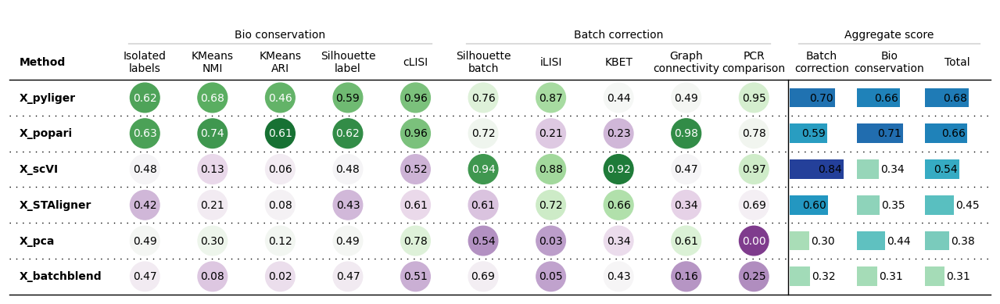

popari/simulated_batch_data/results/batch_effect_1pt5_with_50_percent/processed_dataset_28.csv
Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_50_percent/processed_dataset_42.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.13it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.22it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.26it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]atch correction: pcr_co

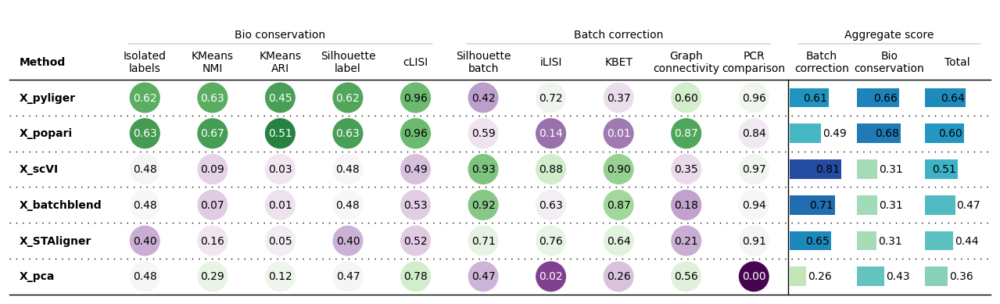

popari/simulated_batch_data/results/batch_effect_1pt5_with_50_percent/processed_dataset_42.csv
Processing file popari/simulated_batch_data/output/batch_effect_3_with_50_percent/processed_dataset_10.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.19it/s]atch correction: pcr_comparison]
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.23it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.27it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.33it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.33it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.31it/s]atch correction: pcr_compar

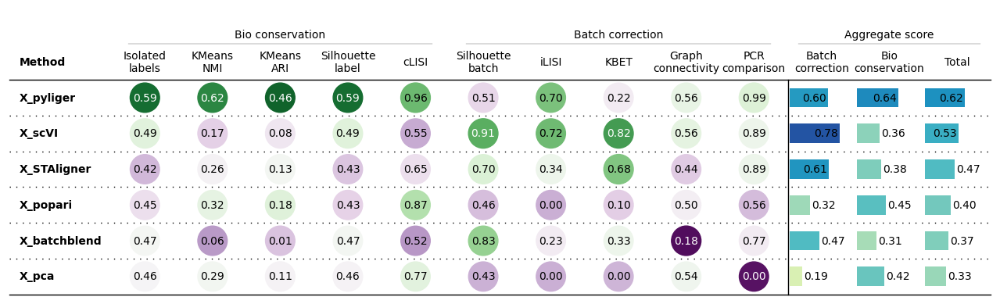

popari/simulated_batch_data/results/batch_effect_3_with_50_percent/processed_dataset_10.csv
Processing file popari/simulated_batch_data/output/batch_effect_3_with_50_percent/processed_dataset_42.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.24it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.27it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.34it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.31it/s]atch correction: pcr_co

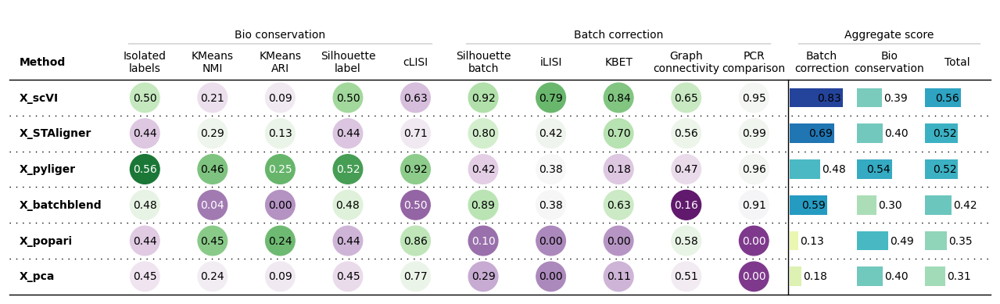

popari/simulated_batch_data/results/batch_effect_3_with_50_percent/processed_dataset_42.csv
Processing file popari/simulated_batch_data/output/batch_effect_3_with_50_percent/processed_dataset_28.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.18it/s]atch correction: pcr_comparison]
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.24it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.27it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.34it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.30it/s]atch correction: pcr_compar

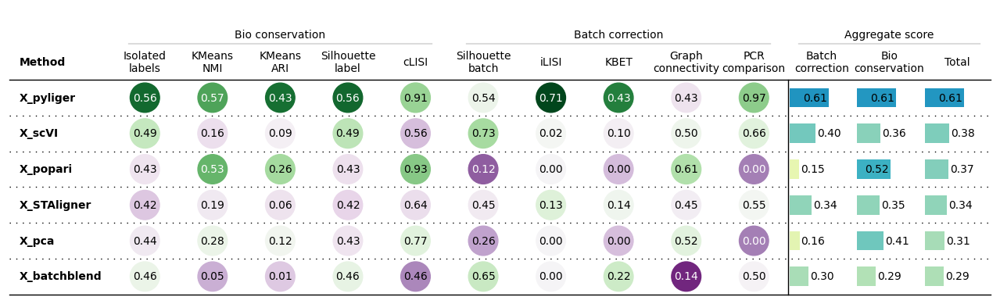

popari/simulated_batch_data/results/batch_effect_3_with_50_percent/processed_dataset_28.csv
Processing file popari/simulated_batch_data/output/batch_effect_3_with_50_percent/processed_dataset_13.h5ad


Embeddings:  17%|█▋        | 1/6 [00:01<00:06,  1.22s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:02<00:03,  1.03it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.12it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.21it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:04<00:00,  1.25it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:05<00:00,  1.19it/s]atch correction: pcr_co

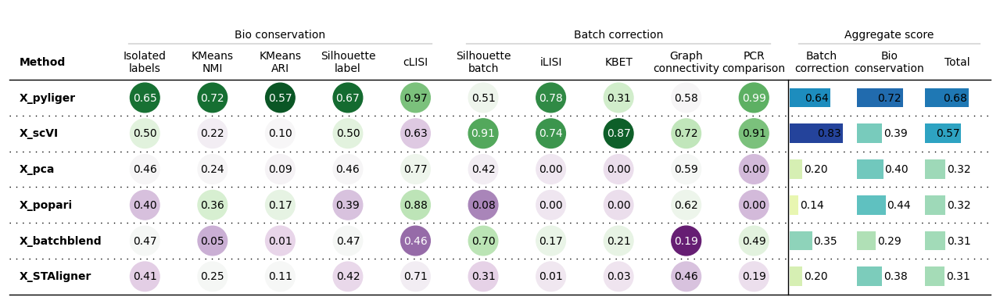

popari/simulated_batch_data/results/batch_effect_3_with_50_percent/processed_dataset_13.csv
Processing file popari/simulated_batch_data/output/batch_effect_3_with_50_percent/processed_dataset_7.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.18it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.23it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.26it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.33it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.33it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.30it/s]atch correction: pcr_co

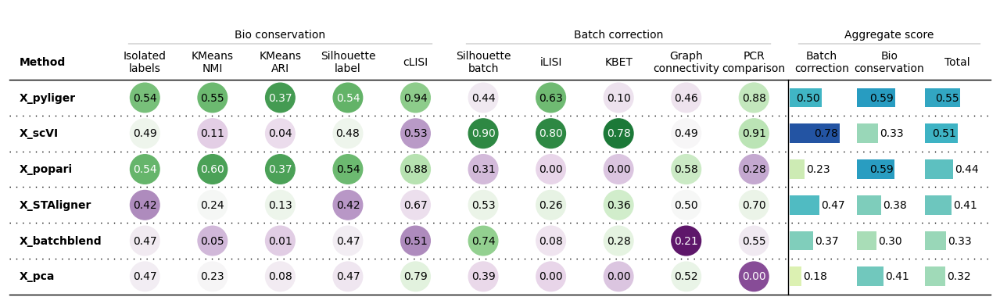

popari/simulated_batch_data/results/batch_effect_3_with_50_percent/processed_dataset_7.csv
Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_100_percent/processed_dataset_42.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.14it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.21it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.25it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.32it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]atch correction: pcr_co

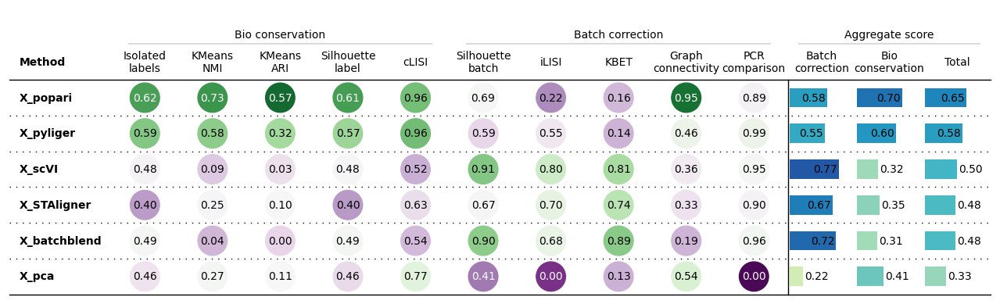

popari/simulated_batch_data/results/batch_effect_1pt5_with_100_percent/processed_dataset_42.csv
Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_100_percent/processed_dataset_28.h5ad


Embeddings:  17%|█▋        | 1/6 [00:01<00:06,  1.28s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:02<00:04,  1.00s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.10it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.18it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:04<00:00,  1.20it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:05<00:00,  1.15it/s]atch correction: pcr_co

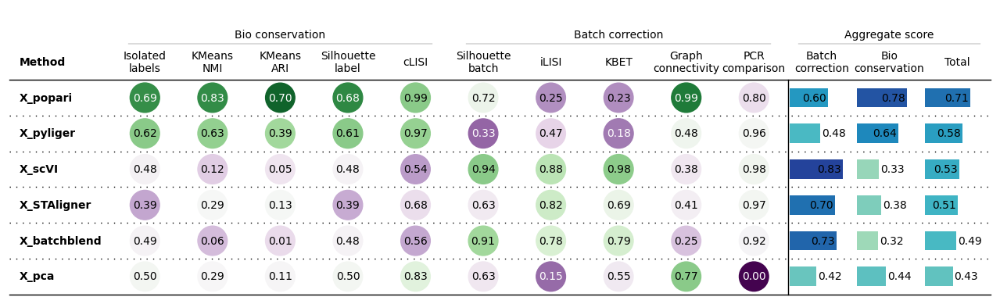

popari/simulated_batch_data/results/batch_effect_1pt5_with_100_percent/processed_dataset_28.csv
Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_100_percent/processed_dataset_7.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.13it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.22it/s]atch correction: pcr_comparison]
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.26it/s]atch correction: pcr_comparison]    
                                                                                         
Metrics:  10%|█         | 1/10 [00:00<00:00, 101.67it/s, Bio conservation: nmi_ari_cluster_labels_kmeans]

In [ ]:
for file in all_files:
    if file not in file_names:
        print(f"Processing file {file}")
        adata = ad.read_h5ad(file) 
        #print(adata)
    
        # print("Comparative visualization of all methods...")
        # fig, axes = plt.subplots(2, 6, figsize=(21, 7))
        
        # # Raw data
        # # sc.pp.neighbors(adata, use_rep="X_pca")
        # # sc.tl.umap(adata)
        # # sc.pl.umap(adata, color="cell_type", alpha=0.5, ax=axes[0,0], show=False, title="Cell types (raw)")
        # # sc.pl.umap(adata, color="batch", alpha=0.5, ax=axes[1,0], show=False, title="Batches (raw)")
        # sc.pl.embedding(adata, basis="X_umap", color="cell_type", alpha=0.5, ax=axes[0,0], show=False, title="Cell types (raw)")
        # sc.pl.embedding(adata, basis="X_umap", color="batch_name", alpha=0.5, ax=axes[1,0], show=False, title="Batches (raw)")
        
        
        # # STAligner
        # sc.pl.embedding(adata, basis="X_umap_STAligner", color="cell_type", alpha=0.5, ax=axes[0,1], show=False, title="Cell types (STAligner)")
        # sc.pl.embedding(adata, basis="X_umap_STAligner", color="batch_name", alpha=0.5, ax=axes[1,1], show=False, title="Batches (STAligner)")
        
        # # scVI
        # sc.pl.embedding(adata, basis="X_umap_scVI", color="cell_type", alpha=0.5, ax=axes[0,2], show=False, title="Cell types (scVI)")
        # sc.pl.embedding(adata, basis="X_umap_scVI", color="batch", alpha=0.5, ax=axes[1,2], show=False, title="Batches (scVI)")
        
        # # PyLiger
        # sc.pl.embedding(adata, basis="X_umap_pyliger", color="cell_type", alpha=0.5, ax=axes[0,3], show=False, title="Cell types (PyLiger)")
        # sc.pl.embedding(adata, basis="X_umap_pyliger", color="batch", alpha=0.5, ax=axes[1,3], show=False, title="Batches (PyLiger)")
    
        # # Popari
        # sc.pp.neighbors(adata, use_rep="X_popari")
        # sc.tl.umap(adata)
        # sc.pl.umap(adata, color="cell_type", alpha=0.5, ax=axes[0,4], show=False, title="Cell types (Popari)")
        # sc.pl.umap(adata, color="batch", alpha=0.5, ax=axes[1,4], show=False, title="Batches (Popari)")
    
        # # Batch Blend
        # sc.pp.neighbors(adata, use_rep="X_batchblend")
        # sc.tl.umap(adata)
        # sc.pl.umap(adata, color="cell_type", alpha=0.5, ax=axes[0,5], show=False, title="Cell types (BatchBlend)")
        # sc.pl.umap(adata, color="batch", alpha=0.5, ax=axes[1,5], show=False, title="Batches (BatchBlend)")
    
        
        # for ax in axes.flat:
        #     ax.get_legend().remove()
        # plt.tight_layout()
        # plt.show()
    
    
        bm = Benchmarker(
                adata,
                batch_key="batch",
                label_key="cell_type",
                bio_conservation_metrics=BioConservation(),
                batch_correction_metrics=BatchCorrection(),
                embedding_obsm_keys=["X_pca", "X_STAligner", "X_scVI", "X_pyliger", "X_popari", "X_batchblend"],
                n_jobs=1,
            )
        bm.benchmark()
        bm.plot_results_table(min_max_scale=False)
    
        df = bm.get_results(min_max_scale=False)
    
    
        save_path = file.replace("output", "results").replace(".h5ad", ".csv")
        
        
        df.to_csv(save_path)
        print(save_path)   

Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_75_percent/processed_dataset_28.h5ad
Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_75_percent/processed_dataset_7.h5ad
Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_75_percent/processed_dataset_42.h5ad
Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_75_percent/processed_dataset_10.h5ad
Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_75_percent/processed_dataset_13.h5ad
Processing file popari/simulated_batch_data/output/batch_effect_3_with_75_percent/processed_dataset_42.h5ad
Processing file popari/simulated_batch_data/output/batch_effect_3_with_75_percent/processed_dataset_28.h5ad
Processing file popari/simulated_batch_data/output/batch_effect_3_with_75_percent/processed_dataset_7.h5ad
Processing file popari/simulated_batch_data/output/batch_effect_3_with_75_percent/processed_dataset_10.h5ad
Processing file

Metrics:   0%|          | 0/10 [00:00<?, ?it/s, Bio conservation: isolated_labels]WARNING:jax._src.xla_bridge:An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.

Embeddings:  17%|█▋        | 1/6 [00:09<00:47,  9.47s/it]atch correction: pcr_comparison]
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:10<00:18,  4.62s/it]atch correction: pcr_comparison]
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:11<00:09,  3.07s/it]atch correction: pcr_comparison]
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:13<00:05,  2.67s/it]atch correction: pcr_comparison]
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:15<00:02,  2.14s/it]a

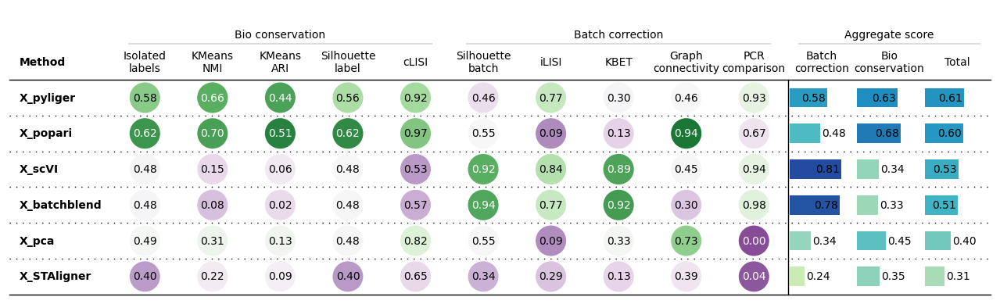

popari/simulated_batch_data/results/batch_effect_1pt5_with_100_percent/processed_dataset_7.csv
Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_100_percent/processed_dataset_10.h5ad


Embeddings:  17%|█▋        | 1/6 [00:04<00:20,  4.05s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:05<00:09,  2.40s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:06<00:05,  1.87s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:07<00:02,  1.44s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:08<00:01,  1.22s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:08<00:00,  1.48s/it]atch correction: pcr_co

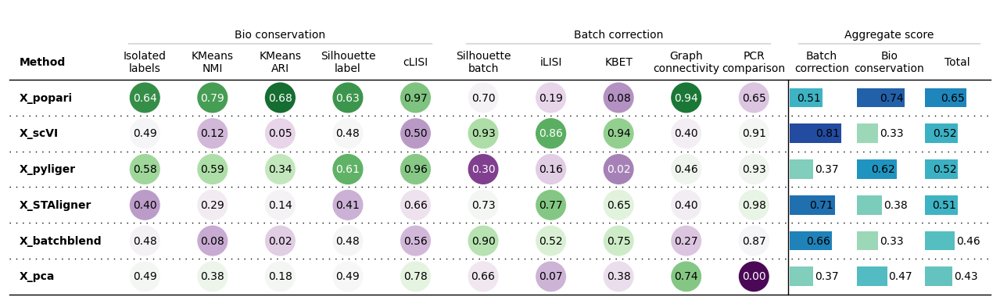

popari/simulated_batch_data/results/batch_effect_1pt5_with_100_percent/processed_dataset_10.csv
Processing file popari/simulated_batch_data/output/batch_effect_1pt5_with_100_percent/processed_dataset_13.h5ad


Embeddings:  17%|█▋        | 1/6 [00:04<00:23,  4.75s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:06<00:10,  2.70s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:06<00:05,  1.86s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:07<00:02,  1.45s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:08<00:01,  1.24s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:09<00:00,  1.65s/it]atch correction: pcr_co

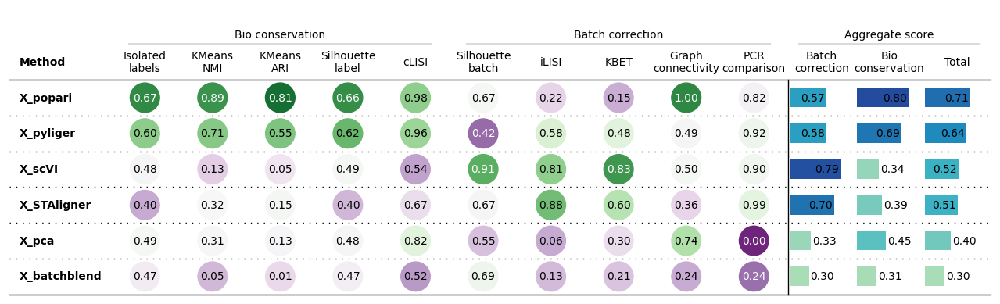

popari/simulated_batch_data/results/batch_effect_1pt5_with_100_percent/processed_dataset_13.csv
Processing file popari/simulated_batch_data/output/batch_effect_2_with_50_percent/processed_dataset_13.h5ad


Embeddings:  17%|█▋        | 1/6 [00:02<00:14,  2.99s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:04<00:07,  1.95s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:05<00:04,  1.43s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:06<00:02,  1.31s/it]atch correction: pcr_comparison]
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:06<00:01,  1.13s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:07<00:00,  1.28s/it]atch correction: pcr_compar

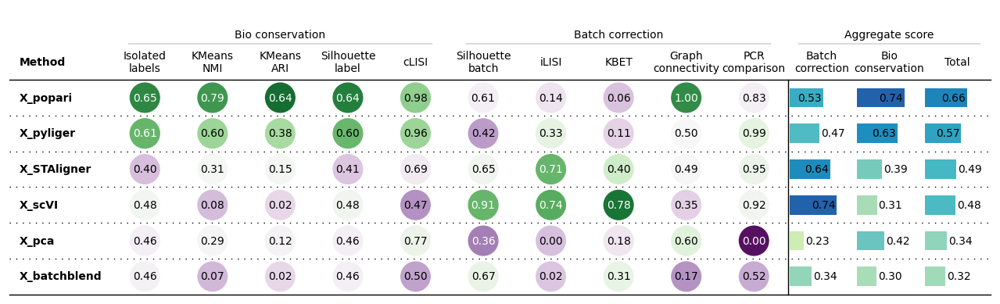

popari/simulated_batch_data/results/batch_effect_2_with_50_percent/processed_dataset_13.csv
Processing file popari/simulated_batch_data/output/batch_effect_2_with_50_percent/processed_dataset_28.h5ad


Embeddings:  17%|█▋        | 1/6 [00:03<00:18,  3.65s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:04<00:08,  2.00s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:05<00:04,  1.65s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:06<00:02,  1.45s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:07<00:01,  1.23s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:08<00:00,  1.41s/it]atch correction: pcr_co

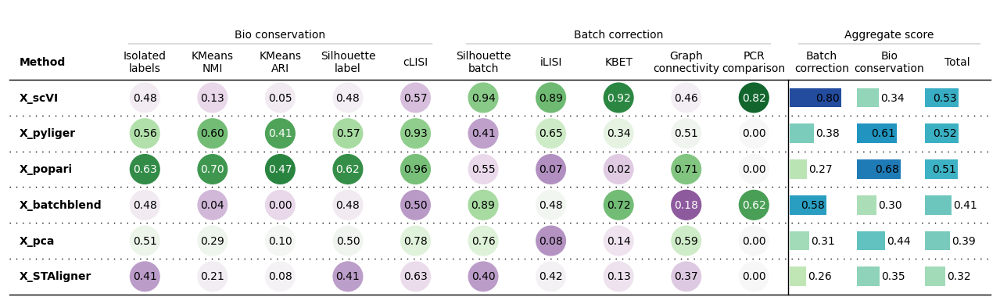

popari/simulated_batch_data/results/batch_effect_2_with_50_percent/processed_dataset_28.csv
Processing file popari/simulated_batch_data/output/batch_effect_2_with_50_percent/processed_dataset_42.h5ad


Embeddings:  17%|█▋        | 1/6 [00:03<00:16,  3.35s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:04<00:08,  2.10s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:05<00:04,  1.52s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:06<00:02,  1.38s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:08<00:01,  1.44s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:08<00:00,  1.47s/it]atch correction: pcr_co

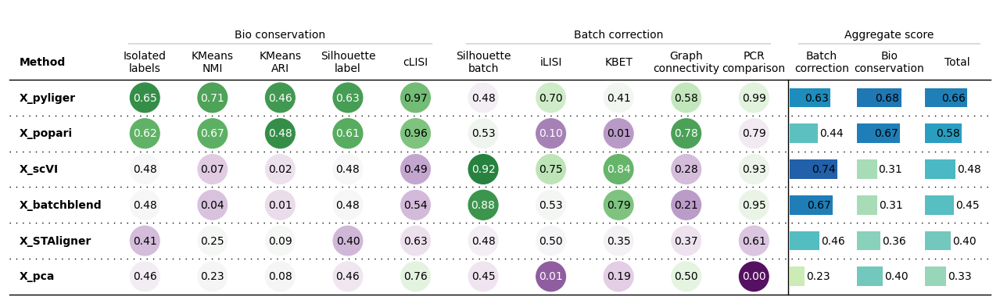

popari/simulated_batch_data/results/batch_effect_2_with_50_percent/processed_dataset_42.csv
Processing file popari/simulated_batch_data/output/batch_effect_2_with_50_percent/processed_dataset_10.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.17it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.25it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.29it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.13it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:04<00:00,  1.19it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.21it/s]atch correction: pcr_co

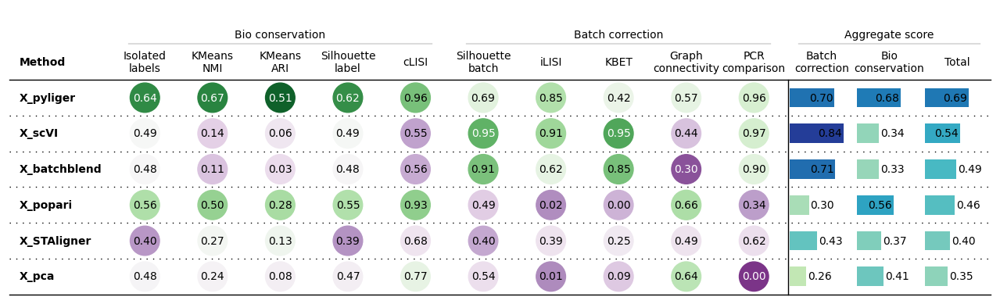

popari/simulated_batch_data/results/batch_effect_2_with_50_percent/processed_dataset_10.csv
Processing file popari/simulated_batch_data/output/batch_effect_2_with_50_percent/processed_dataset_7.h5ad


Embeddings:  17%|█▋        | 1/6 [00:03<00:18,  3.64s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:04<00:08,  2.24s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:05<00:04,  1.60s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:06<00:02,  1.27s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:07<00:01,  1.12s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:08<00:00,  1.35s/it]atch correction: pcr_co

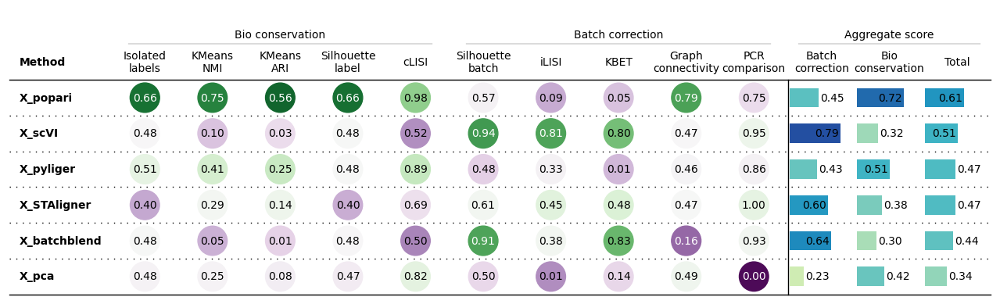

popari/simulated_batch_data/results/batch_effect_2_with_50_percent/processed_dataset_7.csv
Processing file popari/simulated_batch_data/output/batch_effect_5_with_75_percent/processed_dataset_42.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.27it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.30it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:02<00:01,  1.37it/s]atch correction: pcr_comparison]
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.38it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.35it/s]atch correction: pcr_compar

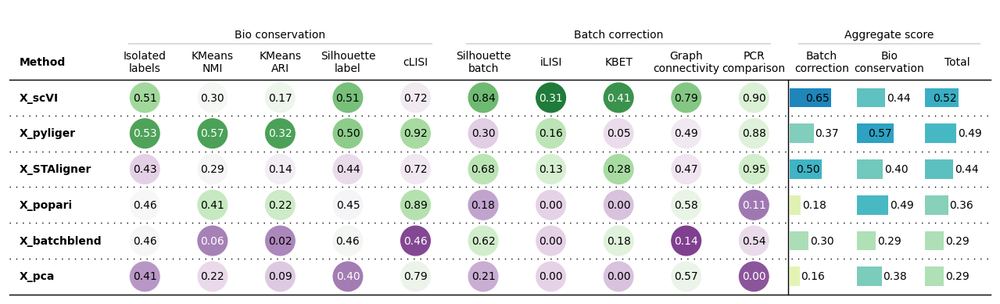

popari/simulated_batch_data/results/batch_effect_5_with_75_percent/processed_dataset_42.csv
Processing file popari/simulated_batch_data/output/batch_effect_5_with_75_percent/processed_dataset_7.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]atch correction: pcr_comparison]
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.27it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.30it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.35it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.38it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.34it/s]atch correction: pcr_compar

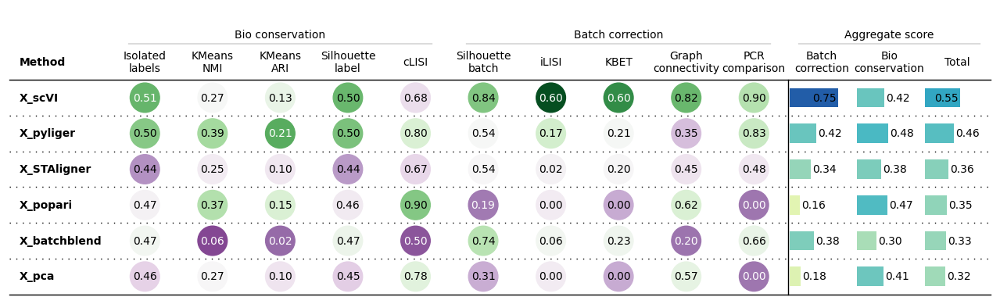

popari/simulated_batch_data/results/batch_effect_5_with_75_percent/processed_dataset_7.csv
Processing file popari/simulated_batch_data/output/batch_effect_5_with_75_percent/processed_dataset_28.h5ad


Embeddings:  17%|█▋        | 1/6 [00:02<00:10,  2.16s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:04<00:09,  2.30s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:05<00:04,  1.63s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:06<00:02,  1.28s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:06<00:01,  1.11s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:07<00:00,  1.28s/it]atch correction: pcr_co

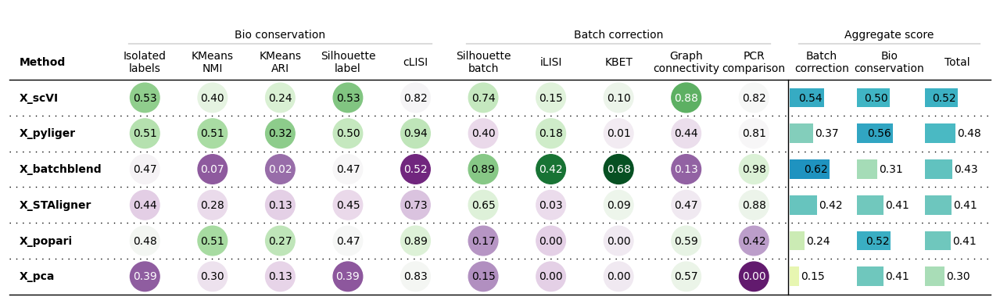

popari/simulated_batch_data/results/batch_effect_5_with_75_percent/processed_dataset_28.csv
Processing file popari/simulated_batch_data/output/batch_effect_5_with_75_percent/processed_dataset_10.h5ad


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.28it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:02<00:01,  1.37it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.39it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.35it/s]atch correction: pcr_co

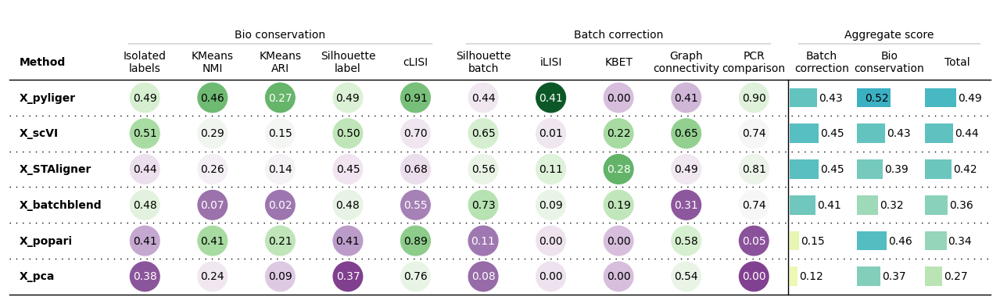

popari/simulated_batch_data/results/batch_effect_5_with_75_percent/processed_dataset_10.csv
Processing file popari/simulated_batch_data/output/batch_effect_5_with_75_percent/processed_dataset_13.h5ad


Embeddings:  17%|█▋        | 1/6 [00:01<00:07,  1.49s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:02<00:05,  1.32s/it]atch correction: pcr_comparison]
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:03<00:03,  1.06s/it]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:04<00:01,  1.08it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:04<00:00,  1.16it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:06<00:00,  1.07s/it]atch correction: pcr_compar

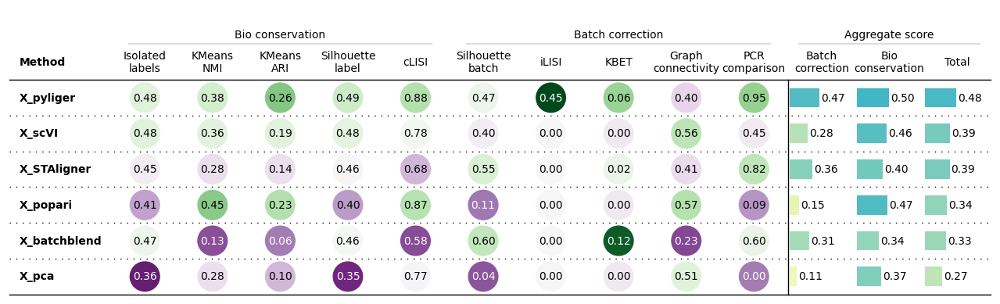

popari/simulated_batch_data/results/batch_effect_5_with_75_percent/processed_dataset_13.csv


In [6]:
for file in all_files:
    if file not in file_names:
        print(f"Processing file {file}")
        adata = ad.read_h5ad(file) 
        
        save_path = file.replace("output", "results").replace(".h5ad", ".csv")
        
        if os.path.exists(save_path):
            pass
        else:  
            bm = Benchmarker(
                    adata,
                    batch_key="batch",
                    label_key="cell_type",
                    bio_conservation_metrics=BioConservation(),
                    batch_correction_metrics=BatchCorrection(),
                    embedding_obsm_keys=["X_pca", "X_STAligner", "X_scVI", "X_pyliger", "X_popari", "X_batchblend"],
                    n_jobs=1,
                )
            bm.benchmark()
            bm.plot_results_table(min_max_scale=False)
        
            df = bm.get_results(min_max_scale=False)
        
        
            save_path = file.replace("output", "results").replace(".h5ad", ".csv")
            
            
            df.to_csv(save_path)
            print(save_path)   

Processing file popari/simulated_batch_data/output/data_['32.h5ad'].h5ad
AnnData object with n_obs × n_vars = 450 × 100
    obs: 'domain', 'cell_type', 'cell_type_encoded', 'batch'
    uns: 'adjacency_matrix', 'batch_colors', 'cell_type_colors', 'cell_type_definitions', 'domain_landmarks', 'domain_names', 'ground_truth_M', 'ground_truth_batch_effect', 'neighbors', 'pca', 'simulation_parameters', 'spatial_neighbors', 'umap'
    obsm: 'X_batchblend', 'X_pca', 'X_popari', 'X_umap', 'adjacency_list', 'ground_truth_X', 'spatial'
    varm: 'PCs'
    obsp: 'adjacency_matrix', 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

Visualizing raw data...


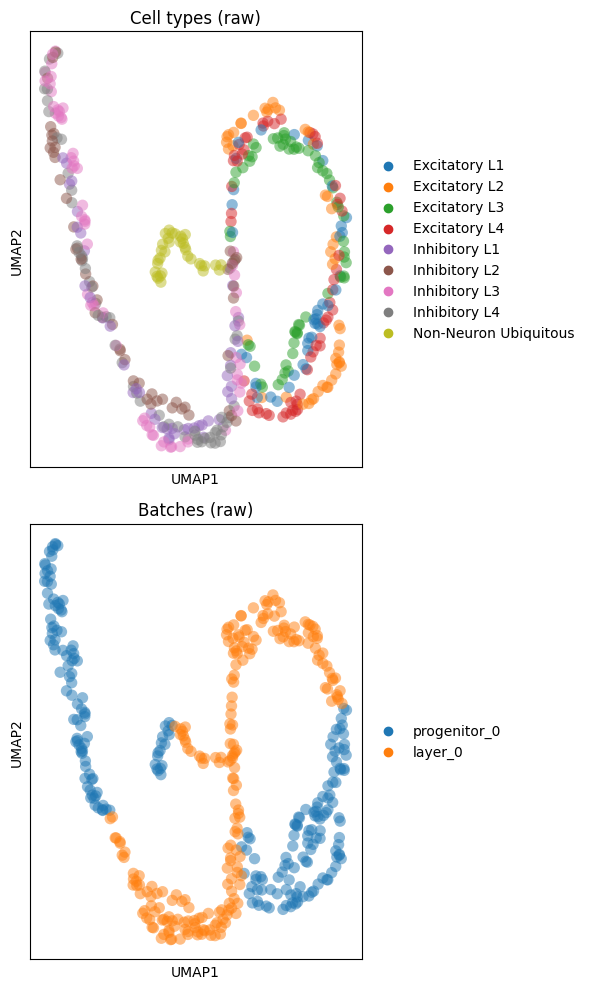

Running STAligner...
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
------Calculating spatial graph...
The graph contains 11250 edges, 225 cells.
50.0000 neighbors per cell on average.
STAligner(
  (conv1): GATConv(100, 512, heads=1)
  (conv2): GATConv(512, 30, heads=1)
  (conv3): GATConv(30, 512, heads=1)
  (conv4): GATConv(512, 100, heads=1)
)
Pretrain with STAGATE...


100%|██████████| 500/500 [00:01<00:00, 324.30it/s]


Train with STAligner...


  2%|▏         | 10/500 [00:00<00:05, 96.90it/s]

Update spot triplets at epoch 500


 23%|██▎       | 113/500 [00:00<00:02, 191.81it/s]

Update spot triplets at epoch 600


 44%|████▎     | 218/500 [00:01<00:01, 197.96it/s]

Update spot triplets at epoch 700


 65%|██████▍   | 324/500 [00:01<00:00, 198.93it/s]

Update spot triplets at epoch 800


 86%|████████▌ | 428/500 [00:02<00:00, 209.77it/s]

Update spot triplets at epoch 900


100%|██████████| 500/500 [00:02<00:00, 217.92it/s]


Staligner AnnData object with n_obs × n_vars = 450 × 100
    obs: 'domain', 'cell_type', 'cell_type_encoded', 'batch', 'slice_name', 'batch_name'
    uns: 'edgeList'
    obsm: 'X_batchblend', 'X_pca', 'X_popari', 'X_umap', 'adjacency_list', 'ground_truth_X', 'spatial', 'STAGATE', 'STAligner'


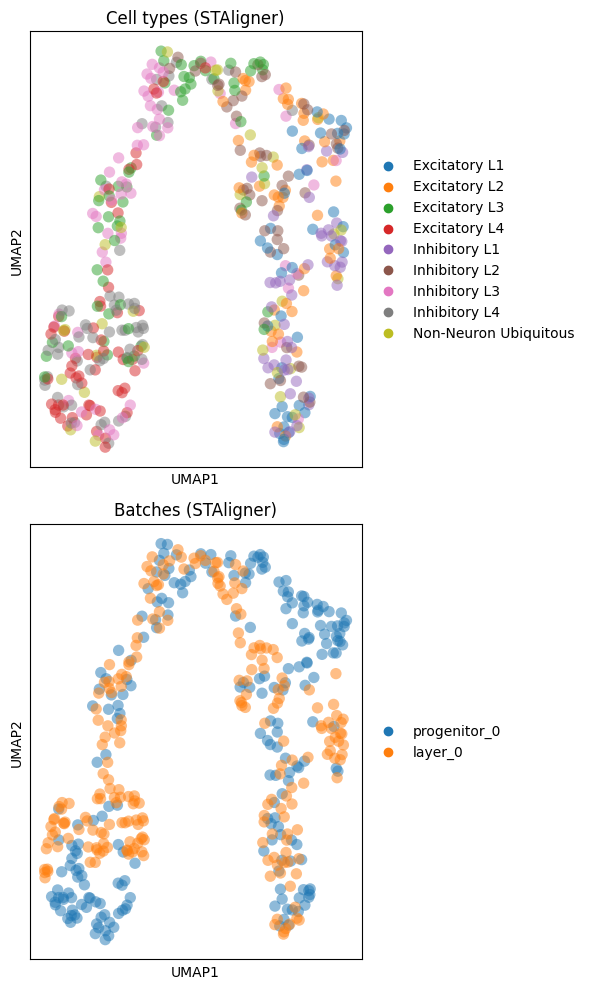

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Running scVI...
Epoch 400/400: 100%|██████████| 400/400 [00:13<00:00, 28.76it/s, v_num=1, train_loss_step=49.9, train_loss_epoch=51]  

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:13<00:00, 28.71it/s, v_num=1, train_loss_step=49.9, train_loss_epoch=51]


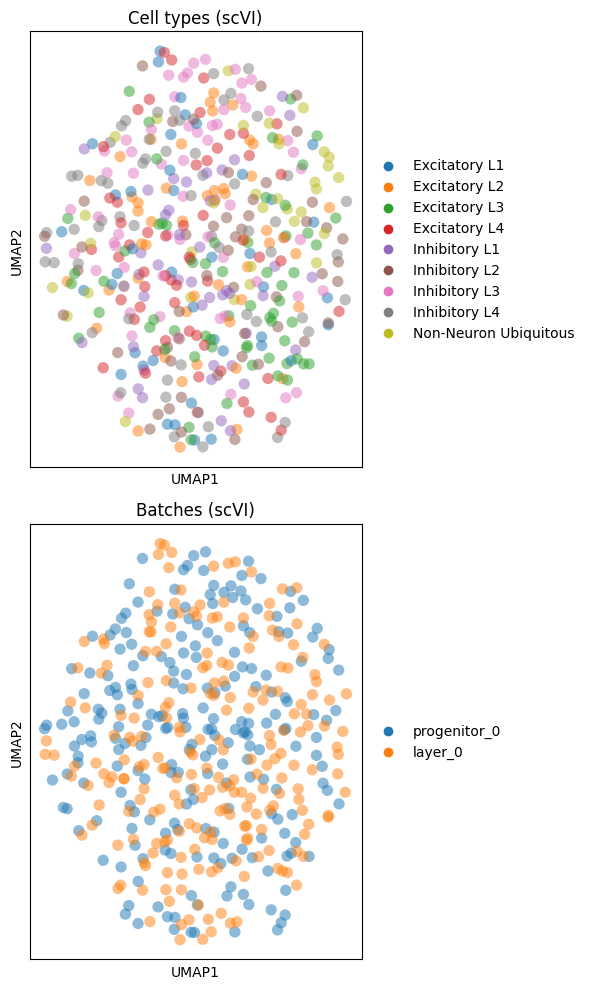

Running PyLiger...


100%|██████████| 30/30 [00:00<00:00, 312.34it/s]


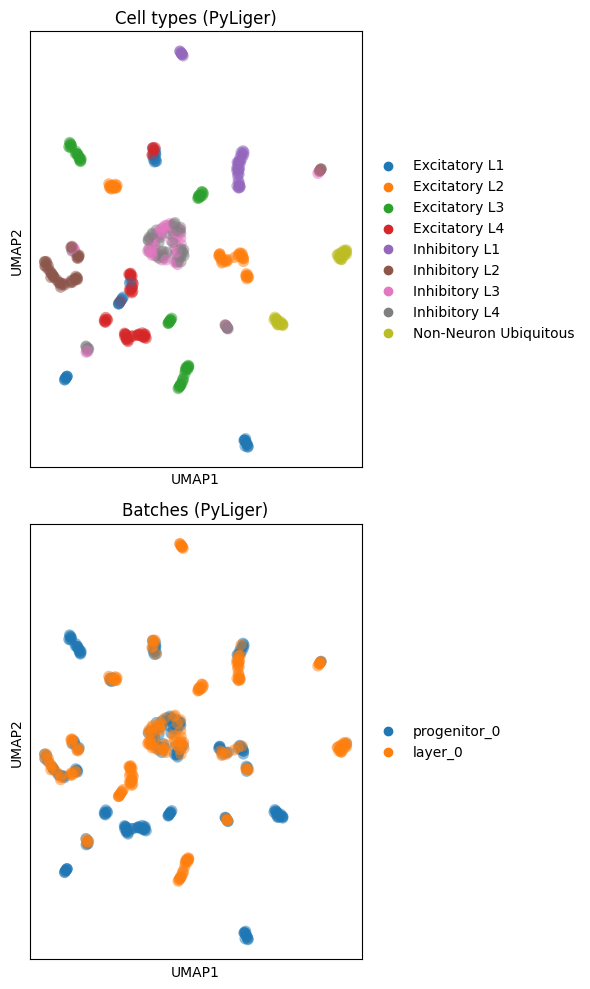

Comparative visualization of all methods...


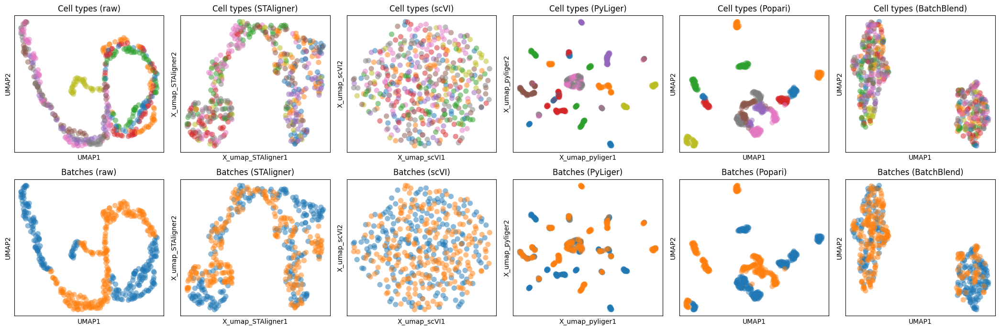

AnnData object with n_obs × n_vars = 450 × 100
    obs: 'domain', 'cell_type', 'cell_type_encoded', 'batch', 'batch_name', '_scvi_batch', '_scvi_labels'
    uns: 'adjacency_matrix', 'batch_colors', 'cell_type_colors', 'cell_type_definitions', 'domain_landmarks', 'domain_names', 'ground_truth_M', 'ground_truth_batch_effect', 'neighbors', 'pca', 'simulation_parameters', 'spatial_neighbors', 'umap', '_scvi_uuid', '_scvi_manager_uuid', 'batch_name_colors'
    obsm: 'X_batchblend', 'X_pca', 'X_popari', 'X_umap', 'adjacency_list', 'ground_truth_X', 'spatial', 'X_umap_STAligner', 'X_STAligner', 'X_scVI', 'X_umap_scVI', 'X_umap_pyliger', 'X_pyliger'
    varm: 'PCs'
    obsp: 'adjacency_matrix', 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'


Embeddings:  17%|█▋        | 1/6 [00:00<00:04,  1.16it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  33%|███▎      | 2/6 [00:01<00:03,  1.25it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  50%|█████     | 3/6 [00:02<00:02,  1.31it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  67%|██████▋   | 4/6 [00:03<00:01,  1.36it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings:  83%|████████▎ | 5/6 [00:03<00:00,  1.36it/s]atch correction: pcr_comparison]    
                                                                                         
Embeddings: 100%|██████████| 6/6 [00:04<00:00,  1.34it/s]atch correction: pcr_co

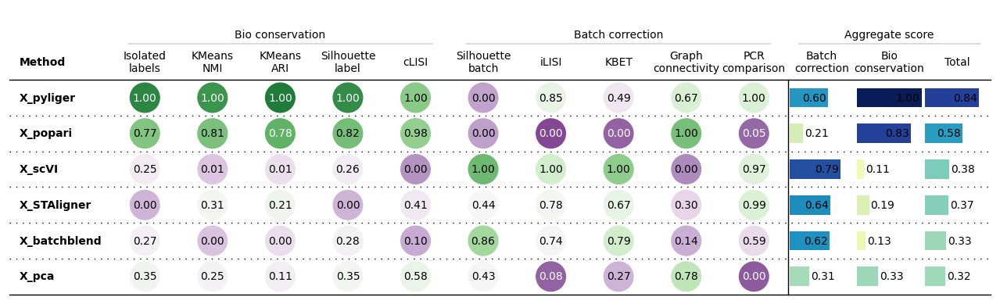

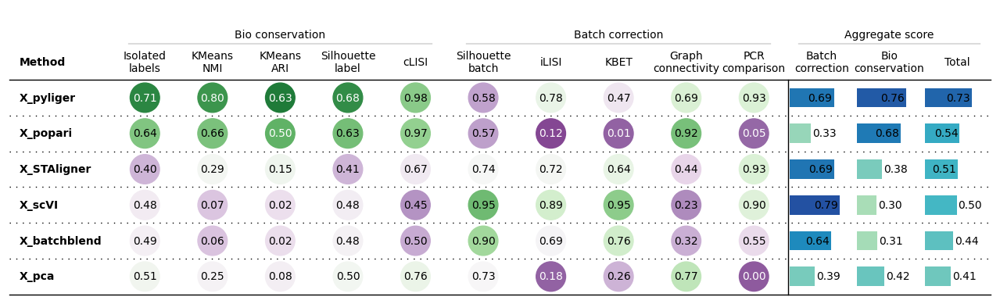

In [26]:
for file in all_files:
    
    print(f"Processing file {file}")
    adata = ad.read_h5ad(file)
    print(adata)
    print("\nVisualizing raw data...")
    sc.pp.neighbors(adata)
    sc.tl.umap(adata)
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 10))
    sc.pl.umap(adata, color="cell_type", alpha=0.5, ax=ax1, show=False, title="Cell types (raw)")
    sc.pl.umap(adata, color="batch", alpha=0.5, ax=ax2, show=False, title="Batches (raw)")
    plt.tight_layout()
    plt.show()

    # fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 10))
    # sc.pp.neighbors(adata, use_rep="X_popari")
    # sc.tl.umap(adata)
    # sc.pl.umap(adata, color="cell_type", alpha=0.5, ax=ax1, show=False, title="Cell types (Popari)")
    # sc.pl.umap(adata, color="batch", alpha=0.5, ax=ax2, show=False, title="Batches (Popari)")
    # plt.tight_layout()
    # plt.show()

    # fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 10))
    # sc.pp.neighbors(adata, use_rep="X_batchblend")
    # sc.tl.umap(adata)
    # sc.pl.umap(adata, color="cell_type", alpha=0.5, ax=ax1, show=False, title="Cell types (BatchBlend)")
    # sc.pl.umap(adata, color="batch", alpha=0.5, ax=ax2, show=False, title="Batches (BatchBlend)")    
    # plt.tight_layout()
    # plt.show()

    
    print("Running STAligner...")
    batches = adata.obs['batch'].unique()
    batches_list = batches.tolist()
    
    Batch_list = []
    adj_list = []
    for batch in batches:
        batch_data = adata[adata.obs['batch'] == batch].copy()
        batch_data.X = csr_matrix(batch_data.X)
        Cal_Spatial_Net(batch_data, rad_cutoff=1.3)
       
        sc.pp.normalize_total(batch_data, target_sum=1e4)
        sc.pp.log1p(batch_data)
        sc.pp.highly_variable_genes(batch_data, flavor="seurat_v3", n_top_genes=5000)
        batch_data = batch_data[:, batch_data.var['highly_variable']]
    
        adj_list.append(batch_data.uns['adj'])
        Batch_list.append(batch_data)

    adata_concat = ad.concat(Batch_list, label="slice_name", keys=batches)
    adata_concat.obs["batch_name"] = adata_concat.obs["slice_name"].astype('category')
    adata.obs["batch_name"] = adata_concat.obs["slice_name"].astype('category')

    adj_concat = np.asarray(adj_list[0].todense())
    for batch_id in range(1,len(batches_list)):
        adj_concat = scipy.linalg.block_diag(adj_concat, np.asarray(adj_list[batch_id].todense()))
    adata_concat.uns['edgeList'] = np.nonzero(adj_concat)

    adata_concat.obs_names_make_unique()
    
    reference_batch = 1
    iter_comb = []
    for i in range(len(batches_list)):
        if i != reference_batch:
            iter_comb.append((i, reference_batch))
    
    adata_concat = train_STAligner(adata_concat, verbose=True, knn_neigh=100, iter_comb=iter_comb, margin=2.5)
    
    adata_staligner = adata_concat.copy()
    print("Staligner", adata_staligner)
    sc.pp.neighbors(adata_staligner, use_rep='STAligner')
    sc.tl.umap(adata_staligner)
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 10))
    sc.pl.umap(adata_staligner, color="cell_type", alpha=0.5, ax=ax1, show=False, title="Cell types (STAligner)")
    sc.pl.umap(adata_staligner, color="batch_name", alpha=0.5, ax=ax2, show=False, title="Batches (STAligner)")
    plt.tight_layout()
    plt.show()
    adata.obsm['X_umap_STAligner'] = adata_staligner.obsm['X_umap']
    adata.obsm['X_STAligner'] = adata_staligner.obsm['STAligner']

    
    print("Running scVI...")
    scvi.model.SCVI.setup_anndata(adata, batch_key='batch')
    model = scvi.model.SCVI(adata)
    model.train()
    adata.obsm['X_scVI'] = model.get_latent_representation()

    adata_scvi = adata.copy()
    sc.pp.neighbors(adata_scvi, use_rep='X_scVI')
    sc.tl.umap(adata_scvi)    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 10))
    sc.pl.umap(adata_scvi, color="cell_type", alpha=0.5, ax=ax1, show=False, title="Cell types (scVI)")
    sc.pl.umap(adata_scvi, color="batch", alpha=0.5, ax=ax2, show=False, title="Batches (scVI)")
    plt.tight_layout()
    plt.show()
    adata.obsm['X_umap_scVI'] = adata_scvi.obsm['X_umap']



    print("Running PyLiger...")
    batch_datas = []
    
    for i, batch in enumerate(batches):
        original_batch = adata[adata.obs['batch'] == batch]
        X_matrix = original_batch.obsm['ground_truth_X'].copy()
        cell_types = original_batch.obs['cell_type'].copy()
        
        new_var_index = [f"feature_{j}" for j in range(X_matrix.shape[1])]
        var_df = pd.DataFrame(index=new_var_index)
        batch_data = ad.AnnData(
            X=X_matrix,
            obs=original_batch.obs.copy(),
            var=var_df
        )
        
        
        batch_data.obs.index.name = "cell_" + str(i)
        batch_data.var.index.name = "metagene_" + str(i)
        batch_data.uns["sample_name"] = f"dataset_{i}"
        batch_data.obs['cell_type'] = cell_types
        batch_datas += [batch_data]
    
    liger_data = pyliger.create_liger(batch_datas)
    pyliger.normalize(liger_data)
    pyliger.select_genes(liger_data)
    pyliger.scale_not_center(liger_data)
    pyliger.optimize_ALS(liger_data, k=5)
    pyliger.quantile_norm(liger_data)
    pyliger.leiden_cluster(liger_data, resolution=0.25)
    pyliger.run_umap(liger_data, distance='cosine', n_neighbors=10, min_dist=0.3)
    
    adata_liger = adata.copy()
    adata_liger.obsm['X_pyliger'] = liger_data.tsne_coords.to_numpy()
    sc.pp.neighbors(adata_liger, use_rep='X_pyliger')
    sc.tl.umap(adata_liger)
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(6, 10))
    sc.pl.umap(adata_liger, color="cell_type", alpha=0.5, ax=ax1, show=False, title="Cell types (PyLiger)")
    sc.pl.umap(adata_liger, color="batch", alpha=0.5, ax=ax2, show=False, title="Batches (PyLiger)")
    plt.tight_layout()
    plt.show()
    adata.obsm['X_umap_pyliger'] = adata_liger.obsm['X_umap']
    adata.obsm['X_pyliger'] = adata_liger.obsm['X_pyliger']
    
    print("Comparative visualization of all methods...")
    fig, axes = plt.subplots(2, 6, figsize=(21, 7))
    
    # Raw data
    sc.pl.umap(adata, color="cell_type", alpha=0.5, ax=axes[0,0], show=False, title="Cell types (raw)")
    sc.pl.umap(adata, color="batch", alpha=0.5, ax=axes[1,0], show=False, title="Batches (raw)")
    
    # STAligner
    sc.pl.embedding(adata, basis="X_umap_STAligner", color="cell_type", alpha=0.5, ax=axes[0,1], show=False, title="Cell types (STAligner)")
    sc.pl.embedding(adata, basis="X_umap_STAligner", color="batch_name", alpha=0.5, ax=axes[1,1], show=False, title="Batches (STAligner)")
    
    # scVI
    sc.pl.embedding(adata, basis="X_umap_scVI", color="cell_type", alpha=0.5, ax=axes[0,2], show=False, title="Cell types (scVI)")
    sc.pl.embedding(adata, basis="X_umap_scVI", color="batch", alpha=0.5, ax=axes[1,2], show=False, title="Batches (scVI)")
    
    # PyLiger
    sc.pl.embedding(adata, basis="X_umap_pyliger", color="cell_type", alpha=0.5, ax=axes[0,3], show=False, title="Cell types (PyLiger)")
    sc.pl.embedding(adata, basis="X_umap_pyliger", color="batch", alpha=0.5, ax=axes[1,3], show=False, title="Batches (PyLiger)")

    # Popari
    sc.pp.neighbors(adata, use_rep="X_popari")
    sc.tl.umap(adata)
    sc.pl.umap(adata, color="cell_type", alpha=0.5, ax=axes[0,4], show=False, title="Cell types (Popari)")
    sc.pl.umap(adata, color="batch", alpha=0.5, ax=axes[1,4], show=False, title="Batches (Popari)")

    # Batch Blend
    sc.pp.neighbors(adata, use_rep="X_batchblend")
    sc.tl.umap(adata)
    sc.pl.umap(adata, color="cell_type", alpha=0.5, ax=axes[0,5], show=False, title="Cell types (BatchBlend)")
    sc.pl.umap(adata, color="batch", alpha=0.5, ax=axes[1,5], show=False, title="Batches (BatchBlend)")

    
    for ax in axes.flat:
        ax.get_legend().remove()
    plt.tight_layout()
    plt.show()

    print(adata)
    bm = Benchmarker(
            adata,
            batch_key="batch",
            label_key="cell_type",
            bio_conservation_metrics=BioConservation(),
            batch_correction_metrics=BatchCorrection(),
            embedding_obsm_keys=["X_pca", "X_STAligner", "X_scVI", "X_pyliger", "X_popari", "X_batchblend"],
            n_jobs=1,
        )
    bm.benchmark()
    bm.plot_results_table()
    bm.plot_results_table(min_max_scale=False)

    df = bm.get_results(min_max_scale=False)
    df.to_csv("/home/raehashs/batch_effect_correction/popari/simulated_batch_data/output/all_models_data_" + str(file.split("[")[-1:]) + ".csv")
        


In [8]:
for file in all_files:
    print(f"Processing file {file}")
    adata = ad.read_h5ad(file)
    print(adata)
    break

Processing file popari/simulated_batch_data/output/data_['28.h5ad'].h5ad
AnnData object with n_obs × n_vars = 450 × 100
    obs: 'domain', 'cell_type', 'cell_type_encoded', 'batch'
    uns: 'adjacency_matrix', 'batch_colors', 'cell_type_colors', 'cell_type_definitions', 'domain_landmarks', 'domain_names', 'ground_truth_M', 'ground_truth_batch_effect', 'neighbors', 'pca', 'simulation_parameters', 'spatial_neighbors', 'umap'
    obsm: 'X_batchblend', 'X_pca', 'X_popari', 'X_umap', 'adjacency_list', 'ground_truth_X', 'spatial'
    varm: 'PCs'
    obsp: 'adjacency_matrix', 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'


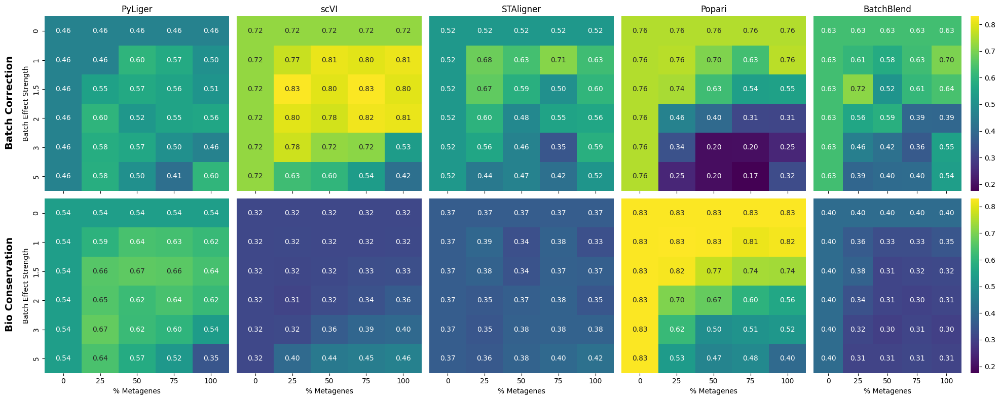

In [6]:
#Create Heatmap
import matplotlib.pyplot as plt
import seaborn as sns
from glob import glob
base_path = "popari/simulated_batch_data/results/"

methods = ["X_pyliger", "X_scVI", "X_STAligner", "X_popari", "X_batchblend"]
metrics = ["Batch correction", "Bio conservation"]


strengths = [0, 1, 1.5, 2, 3, 5]
percentages = [0, 25, 50, 75, 100]

results = {metric: {method: np.zeros((len(strengths), len(percentages))) for method in methods} for metric in metrics}

for i, strength in enumerate(strengths):
    for j, percentage in enumerate(percentages):
        if strength == 0 or percentage == 0:
            folder_name = f"batch_effect_0"
        else:
            strength_str = str(strength).replace('.', 'pt') if '.' in str(strength) else str(strength)
            folder_name = f"batch_effect_{strength_str}_with_{percentage}_percent"
        folder_path = os.path.join(base_path, folder_name)

        metric_sums = {metric: {method: 0 for method in methods} for metric in metrics}
        file_count = 0
        csv_files = glob(os.path.join(folder_path, "*.csv"))
        for csv_file in csv_files:
            df = pd.read_csv(csv_file)
            file_count += 1
            for method in methods:
                for metric in metrics:
                    method_row = df[df.iloc[:, 0] == method]
                    metric_col = df.columns[df.columns.str.lower() == metric.lower()]
                    value = method_row[metric_col[0]].values[0]
                    metric_sums[metric][method] += float(value)
        
        for metric in metrics:
            for method in methods:
                results[metric][method][i, j] = metric_sums[metric][method] / file_count

# Separate Heatmaps
# for metric in metrics:
#     for method in methods:
#         print(metric, method)
#         fig, ax = plt.subplots(figsize=(6, 5))
        
#         sns.heatmap(results[metric][method], ax=ax, cmap="viridis",
#                    xticklabels=percentages, yticklabels=strengths,
#                    annot=True, fmt=".2f")
        
#         ax.set_title(f"{method.replace('X_', '')} - {metric}")
#         ax.set_xlabel("% Metagenes")
#         ax.set_ylabel("Batch Effect Strength")
#         plt.tight_layout()
#         plt.show()

vmin = min([results[metric][method].min() for metric in metrics for method in methods])
vmax = max([results[metric][method].max() for metric in metrics for method in methods])
    
fig, axes = plt.subplots(2, len(methods), figsize=(20, 8), sharex=True)

# Plot heatmaps

method_names = ['PyLiger', 'scVI', 'STAligner', 'Popari', 'BatchBlend']

for i, metric in enumerate(metrics):
    for j, method in enumerate(methods):
        ax = axes[i, j]

        cbar = True if j == len(methods)-1 else False

        yticklabels = strengths if j == 0 else False

        
        sns.heatmap(results[metric][method], ax=ax, cmap="viridis", 
                   xticklabels=percentages, yticklabels=yticklabels,
                   annot=True, fmt=".2f", vmin=vmin, vmax=vmax, cbar=cbar)
        
        # Set titles only for the top row
        if i == 0:
            ax.set_title(method_names[j])
            #ax.set_title(f"{method.replace('X_', '')}")
        
        # Set x labels only for the bottom row
        if i == 1:
            ax.set_xlabel("% Metagenes")
        else:
            ax.set_xlabel("")

        if j == 0:
            ax.set_ylabel("Batch Effect Strength")
        else:
            ax.set_ylabel("")
        
        

fig.text(0.01, 0.63, 'Batch Correction', rotation=90, fontsize=14, fontweight='bold')
fig.text(0.01, 0.18, 'Bio Conservation', rotation=90, fontsize=14, fontweight='bold')

plt.tight_layout(rect=[0.02, 0, 1, 1])
plt.show()
    


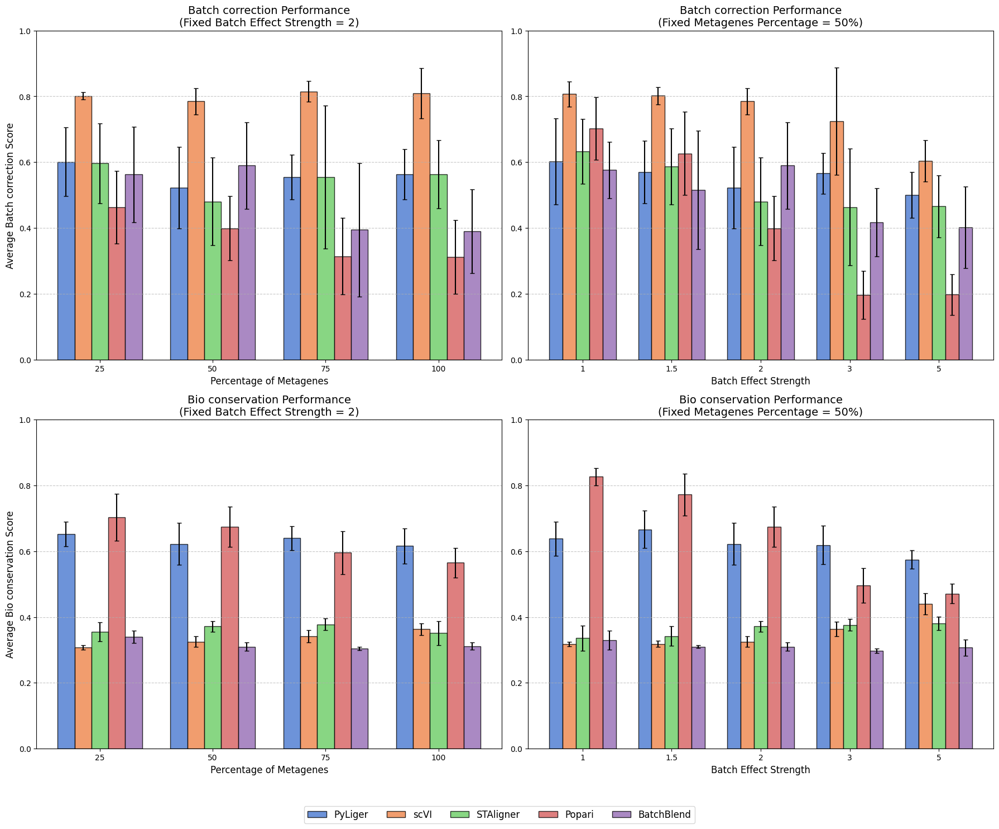

In [8]:
# Your original parameters
methods = ["pyliger", "scVI", "STAligner", "popari", "batchblend"]
method_columns = [f"X_{method}" for method in methods]  # For data extraction
strengths = [1, 1.5, 2, 3, 5]
percentages = [25, 50, 75, 100]
method_display_names = {
    "pyliger": "PyLiger",
    "scVI": "scVI",
    "STAligner": "STAligner",
    "popari": "Popari",
    "batchblend": "BatchBlend"
}
colors = sns.color_palette("muted", len(methods))

# List of metrics to plot
metrics = ["Batch correction", "Bio conservation"]

# Create figure with 2 rows, 2 columns of subplots
fig, axs = plt.subplots(2, 2, figsize=(18, 16))

# Loop through each metric
for metric_idx, metric in enumerate(metrics):
    # For each metric, we create two plots (scenario 1 and scenario 2)
    
    # Scenario 1: Fixed batch effect strength = 2, varying metagenes %
    scenario1_data = {method: {'means': [], 'stds': []} for method in methods}
    for j, percentage in enumerate(percentages):
        if percentage == 0:
            continue  # Skip 0% since we want to focus on 25%, 50%, 75%, 100%
            
        # Construct folder name for batch_effect_2
        folder_name = f"batch_effect_2_with_{percentage}_percent"
        folder_path = os.path.join(base_path, folder_name)
                
        # Process CSV files in the folder
        csv_files = glob(os.path.join(folder_path, "*.csv"))
             
        # Extract data for each method
        for k, method in enumerate(methods):
            method_col = method_columns[k]
            method_values = []
            
            for csv_file in csv_files:
                df = pd.read_csv(csv_file)
                method_row = df[df.iloc[:, 0] == method_col]
                if not method_row.empty:
                    metric_col = df.columns[df.columns.str.lower() == metric.lower()]
                    if len(metric_col) > 0:
                        value = method_row[metric_col[0]].values[0]
                        method_values.append(float(value))
            
            if method_values:  # Only compute if there are values
                scenario1_data[method]['means'].append(np.mean(method_values))
                scenario1_data[method]['stds'].append(np.std(method_values))
            else:
                scenario1_data[method]['means'].append(0)
                scenario1_data[method]['stds'].append(0)
    
    # Scenario 2: Fixed metagenes % = 50, varying batch effect strength
    scenario2_data = {method: {'means': [], 'stds': []} for method in methods}
    for i, strength in enumerate(strengths):
        if strength == 0:
            continue  # Skip batch_effect_0 since we want to focus on 1, 1.5, 2, 3, 5
            
        # Handle decimal in strength (1.5 becomes 1pt5)
        strength_str = str(strength).replace('.', 'pt') if '.' in str(strength) else str(strength)
        folder_name = f"batch_effect_{strength_str}_with_50_percent"
        folder_path = os.path.join(base_path, folder_name)
        
        csv_files = glob(os.path.join(folder_path, "*.csv"))
        
        for k, method in enumerate(methods):
            method_col = method_columns[k]
            method_values = []
            
            for csv_file in csv_files:
                df = pd.read_csv(csv_file)
                method_row = df[df.iloc[:, 0] == method_col]
                if not method_row.empty:
                    metric_col = df.columns[df.columns.str.lower() == metric.lower()]
                    if len(metric_col) > 0:
                        value = method_row[metric_col[0]].values[0]
                        method_values.append(float(value))
            
            if method_values:  # Only compute if there are values
                scenario2_data[method]['means'].append(np.mean(method_values))
                scenario2_data[method]['stds'].append(np.std(method_values))
            else:
                scenario2_data[method]['means'].append(0)
                scenario2_data[method]['stds'].append(0)
    
    # Get the current axes for this metric
    ax1 = axs[metric_idx, 0]  # Left plot
    ax2 = axs[metric_idx, 1]  # Right plot
    
    # Plot 1: Fixed batch effect strength = 2, varying metagenes %
    width = 0.15  # width of bars
    x = np.arange(len(percentages))  # positions for percentages
    for i, method in enumerate(methods):
        means = scenario1_data[method]['means']
        stds = scenario1_data[method]['stds']
        position = x + (i - 2) * width  # Center the groups
        bars = ax1.bar(position, means, width, label=method_display_names[method], color=colors[i], 
                      alpha=0.8, edgecolor='black', linewidth=1)
        # Add error bars
        ax1.errorbar(position, means, yerr=stds, fmt='none', ecolor='black', 
                    capsize=3, capthick=1)
    
    ax1.set_ylabel(f'Average {metric} Score', fontsize=12)
    ax1.set_xlabel('Percentage of Metagenes', fontsize=12)
    ax1.set_title(f'{metric} Performance\n(Fixed Batch Effect Strength = 2)', fontsize=14)
    ax1.set_xticks(x)
    ax1.set_xticklabels(percentages)
    ax1.set_ylim(0, 1.0)  # Assuming scores are between 0 and 1
    ax1.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Plot 2: Fixed metagenes % = 50, varying batch effect strength
    x = np.arange(len(strengths))  # positions for strengths
    for i, method in enumerate(methods):
        means = scenario2_data[method]['means']
        stds = scenario2_data[method]['stds']
        position = x + (i - 2) * width  # Center the groups
        bars = ax2.bar(position, means, width, label=method_display_names[method], color=colors[i], 
                      alpha=0.8, edgecolor='black', linewidth=1)
        # Add error bars
        ax2.errorbar(position, means, yerr=stds, fmt='none', ecolor='black', 
                    capsize=3, capthick=1)
    
    ax2.set_xlabel('Batch Effect Strength', fontsize=12)
    ax2.set_title(f'{metric} Performance\n(Fixed Metagenes Percentage = 50%)', fontsize=14)
    ax2.set_xticks(x)
    ax2.set_xticklabels(strengths)
    ax2.set_ylim(0, 1.0)  # Assuming scores are between 0 and 1
    ax2.grid(axis='y', linestyle='--', alpha=0.7)

# Add a single legend at the bottom of the figure
handles, labels = axs[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, 0.05), ncol=len(methods), fontsize=12)

# Adjust layout to make room for the legend
plt.tight_layout(rect=[0, 0.1, 1, 0.98])  

plt.show()

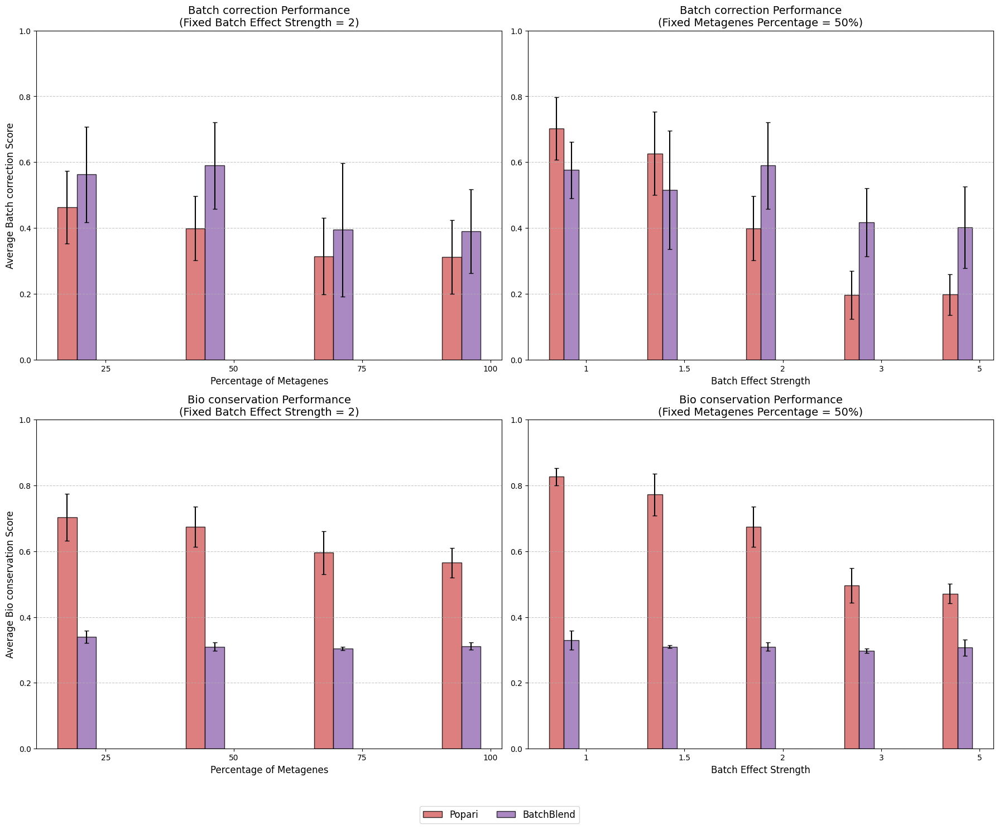

In [12]:
# Your original parameters
methods = ["popari", "batchblend"]
method_columns = [f"X_{method}" for method in methods]  # For data extraction
strengths = [1, 1.5, 2, 3, 5]
percentages = [25, 50, 75, 100]
method_display_names = {
    "popari": "Popari",
    "batchblend": "BatchBlend"
}
all_colors = sns.color_palette("muted", 5)
colors = [all_colors[3], all_colors[4]]

# List of metrics to plot
metrics = ["Batch correction", "Bio conservation"]

# Create figure with 2 rows, 2 columns of subplots
fig, axs = plt.subplots(2, 2, figsize=(18, 16))

# Loop through each metric
for metric_idx, metric in enumerate(metrics):
    # For each metric, we create two plots (scenario 1 and scenario 2)
    
    # Scenario 1: Fixed batch effect strength = 2, varying metagenes %
    scenario1_data = {method: {'means': [], 'stds': []} for method in methods}
    for j, percentage in enumerate(percentages):
        if percentage == 0:
            continue  # Skip 0% since we want to focus on 25%, 50%, 75%, 100%
            
        # Construct folder name for batch_effect_2
        folder_name = f"batch_effect_2_with_{percentage}_percent"
        folder_path = os.path.join(base_path, folder_name)
                
        # Process CSV files in the folder
        csv_files = glob(os.path.join(folder_path, "*.csv"))
             
        # Extract data for each method
        for k, method in enumerate(methods):
            method_col = method_columns[k]
            method_values = []
            
            for csv_file in csv_files:
                df = pd.read_csv(csv_file)
                method_row = df[df.iloc[:, 0] == method_col]
                if not method_row.empty:
                    metric_col = df.columns[df.columns.str.lower() == metric.lower()]
                    if len(metric_col) > 0:
                        value = method_row[metric_col[0]].values[0]
                        method_values.append(float(value))
            
            if method_values:  # Only compute if there are values
                scenario1_data[method]['means'].append(np.mean(method_values))
                scenario1_data[method]['stds'].append(np.std(method_values))
            else:
                scenario1_data[method]['means'].append(0)
                scenario1_data[method]['stds'].append(0)
    
    # Scenario 2: Fixed metagenes % = 50, varying batch effect strength
    scenario2_data = {method: {'means': [], 'stds': []} for method in methods}
    for i, strength in enumerate(strengths):
        if strength == 0:
            continue  # Skip batch_effect_0 since we want to focus on 1, 1.5, 2, 3, 5
            
        # Handle decimal in strength (1.5 becomes 1pt5)
        strength_str = str(strength).replace('.', 'pt') if '.' in str(strength) else str(strength)
        folder_name = f"batch_effect_{strength_str}_with_50_percent"
        folder_path = os.path.join(base_path, folder_name)
        
        csv_files = glob(os.path.join(folder_path, "*.csv"))
        
        for k, method in enumerate(methods):
            method_col = method_columns[k]
            method_values = []
            
            for csv_file in csv_files:
                df = pd.read_csv(csv_file)
                method_row = df[df.iloc[:, 0] == method_col]
                if not method_row.empty:
                    metric_col = df.columns[df.columns.str.lower() == metric.lower()]
                    if len(metric_col) > 0:
                        value = method_row[metric_col[0]].values[0]
                        method_values.append(float(value))
            
            if method_values:  # Only compute if there are values
                scenario2_data[method]['means'].append(np.mean(method_values))
                scenario2_data[method]['stds'].append(np.std(method_values))
            else:
                scenario2_data[method]['means'].append(0)
                scenario2_data[method]['stds'].append(0)
    
    # Get the current axes for this metric
    ax1 = axs[metric_idx, 0]  # Left plot
    ax2 = axs[metric_idx, 1]  # Right plot
    
    # Plot 1: Fixed batch effect strength = 2, varying metagenes %
    width = 0.15  # width of bars
    x = np.arange(len(percentages))  # positions for percentages
    for i, method in enumerate(methods):
        means = scenario1_data[method]['means']
        stds = scenario1_data[method]['stds']
        position = x + (i - 2) * width  # Center the groups
        bars = ax1.bar(position, means, width, label=method_display_names[method], color=colors[i], 
                      alpha=0.8, edgecolor='black', linewidth=1)
        # Add error bars
        ax1.errorbar(position, means, yerr=stds, fmt='none', ecolor='black', 
                    capsize=3, capthick=1)
    
    ax1.set_ylabel(f'Average {metric} Score', fontsize=12)
    ax1.set_xlabel('Percentage of Metagenes', fontsize=12)
    ax1.set_title(f'{metric} Performance\n(Fixed Batch Effect Strength = 2)', fontsize=14)
    ax1.set_xticks(x)
    ax1.set_xticklabels(percentages)
    ax1.set_ylim(0, 1.0)  # Assuming scores are between 0 and 1
    ax1.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Plot 2: Fixed metagenes % = 50, varying batch effect strength
    x = np.arange(len(strengths))  # positions for strengths
    for i, method in enumerate(methods):
        means = scenario2_data[method]['means']
        stds = scenario2_data[method]['stds']
        position = x + (i - 2) * width  # Center the groups
        bars = ax2.bar(position, means, width, label=method_display_names[method], color=colors[i], 
                      alpha=0.8, edgecolor='black', linewidth=1)
        # Add error bars
        ax2.errorbar(position, means, yerr=stds, fmt='none', ecolor='black', 
                    capsize=3, capthick=1)
    
    ax2.set_xlabel('Batch Effect Strength', fontsize=12)
    ax2.set_title(f'{metric} Performance\n(Fixed Metagenes Percentage = 50%)', fontsize=14)
    ax2.set_xticks(x)
    ax2.set_xticklabels(strengths)
    ax2.set_ylim(0, 1.0)  # Assuming scores are between 0 and 1
    ax2.grid(axis='y', linestyle='--', alpha=0.7)

# Add a single legend at the bottom of the figure
handles, labels = axs[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, 0.05), ncol=len(methods), fontsize=12)

# Adjust layout to make room for the legend
plt.tight_layout(rect=[0, 0.1, 1, 0.98])  

plt.show()

In [7]:
#Create BarPlot with Standard Deviation keeping % fixed and Batch Effect Strength fixed

methods = ["pyliger", "scVI", "STAligner", "popari", "batchblend"]
method_columns = [f"X_{method}" for method in methods]  # For data extraction
metric = "Batch correction"

scenario1_data = {method: {'means': [], 'stds': []} for method in methods}
for j, percentage in enumerate(percentages):
    if percentage == 0:
        continue  # Skip 0% since we want to focus on 25%, 50%, 75%, 100%
        
    # Construct folder name for batch_effect_2
    folder_name = f"batch_effect_2_with_{percentage}_percent"
    folder_path = os.path.join(base_path, folder_name)
            
    # Process CSV files in the folder
    csv_files = glob(os.path.join(folder_path, "*.csv"))
         
    # Extract data for each method
    for k, method in enumerate(methods):
        method_col = method_columns[k]
        method_values = []
        
        for csv_file in csv_files:
            df = pd.read_csv(csv_file)
            method_row = df[df.iloc[:, 0] == method_col]
            if not method_row.empty:
                metric_col = df.columns[df.columns.str.lower() == metric.lower()]
                if len(metric_col) > 0:
                    value = method_row[metric_col[0]].values[0]
                    method_values.append(float(value))

        scenario1_data[method]['means'].append(np.mean(method_values))
        scenario1_data[method]['stds'].append(np.std(method_values))


scenario2_data = {method: {'means': [], 'stds': []} for method in methods}
for i, strength in enumerate(strengths):
    if strength == 0:
        continue  # Skip batch_effect_0 since we want to focus on 1, 1.5, 2, 3, 5
        
    # Handle decimal in strength (1.5 becomes 1pt5)
    strength_str = str(strength).replace('.', 'pt') if '.' in str(strength) else str(strength)
    folder_name = f"batch_effect_{strength_str}_with_50_percent"
    folder_path = os.path.join(base_path, folder_name)
    

    
    csv_files = glob(os.path.join(folder_path, "*.csv"))
    
    for k, method in enumerate(methods):
        method_col = method_columns[k]
        method_values = []
        
        for csv_file in csv_files:
            df = pd.read_csv(csv_file)
            method_row = df[df.iloc[:, 0] == method_col]
            if not method_row.empty:
                metric_col = df.columns[df.columns.str.lower() == metric.lower()]
                if len(metric_col) > 0:
                    value = method_row[metric_col[0]].values[0]
                    method_values.append(float(value))
            
        
        scenario2_data[method]['means'].append(np.mean(method_values))
        scenario2_data[method]['stds'].append(np.std(method_values))


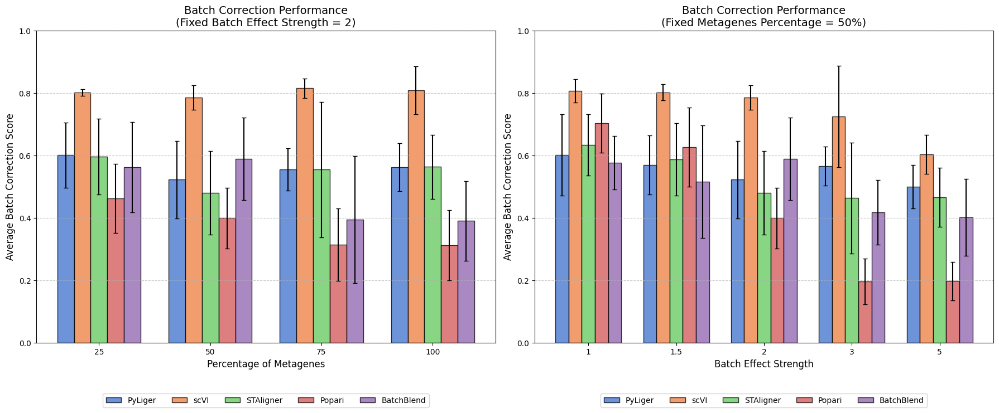

In [44]:
strengths = [1, 1.5, 2, 3, 5]
percentages = [25, 50, 75, 100]
method_display_names = {
        "pyliger": "PyLiger",
        "scVI": "scVI",
        "STAligner": "STAligner",
        "popari": "Popari",
        "batchblend": "BatchBlend"
    }
colors = sns.color_palette("muted", len(methods))
    
# If method_display_names is not provided, use original names
if method_display_names is None:
    method_display_names = {method: method for method in methods}

# Create figure with 2 subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))

# Plot 1: Fixed batch effect strength = 2, varying metagenes %
width = 0.15  # width of bars
x = np.arange(len(percentages))  # positions for percentages

for i, method in enumerate(methods):
    means = scenario1_data[method]['means']
    stds = scenario1_data[method]['stds']
    position = x + (i - 2) * width  # Center the groups
    bars = ax1.bar(position, means, width, label=method_display_names[method], color=colors[i], 
                  alpha=0.8, edgecolor='black', linewidth=1)
    # Add error bars
    ax1.errorbar(position, means, yerr=stds, fmt='none', ecolor='black', 
                capsize=3, capthick=1)

ax1.set_ylabel('Average Batch Correction Score', fontsize=12)
ax1.set_xlabel('Percentage of Metagenes', fontsize=12)
ax1.set_title('Batch Correction Performance\n(Fixed Batch Effect Strength = 2)', fontsize=14)
ax1.set_xticks(x)
ax1.set_xticklabels(percentages)
ax1.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=len(methods))
ax1.set_ylim(0, 1.0)  # Assuming scores are between 0 and 1
ax1.grid(axis='y', linestyle='--', alpha=0.7)

# Plot 2: Fixed metagenes % = 50, varying batch effect strength
x = np.arange(len(strengths))  # positions for strengths

for i, method in enumerate(methods):
    means = scenario2_data[method]['means']
    stds = scenario2_data[method]['stds']
    position = x + (i - 2) * width  # Center the groups
    bars = ax2.bar(position, means, width, label=method_display_names[method], color=colors[i], 
                  alpha=0.8, edgecolor='black', linewidth=1)
    # Add error bars
    ax2.errorbar(position, means, yerr=stds, fmt='none', ecolor='black', 
                capsize=3, capthick=1)

# ax2.set_ylabel('Average Batch Correction Score', fontsize=12)
ax2.set_xlabel('Batch Effect Strength', fontsize=12)
ax2.set_title('Batch Correction Performance\n(Fixed Metagenes Percentage = 50%)', fontsize=14)
ax2.set_xticks(x)
ax2.set_xticklabels(strengths)
ax2.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=len(methods))
ax2.set_ylim(0, 1.0)  # Assuming scores are between 0 and 1
ax2.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout(rect=[0, 0.05, 1, 1]) 
plt.show()